## Final Project Submission

* Student name: Kiarash Ahmadi
* Student pace: self paced 
* Scheduled project review date/time: 8/3/2019 @ 4pm EST
* Instructor name: Jeff Herman 
* Blog post URL: https://medium.com/@mkiah09/flatiron-data-science-module-1-project-edbbc38a8d1e


# Introduction:

This project consisted of obtaining a dataset of house sales from King County in Washington State. From there I was tasked to develop a multi-linear regression model in order to accurately predict housing prices from this dataset. The framework behind developing this model involved following the OSEMiN Data Science Process. This process consists of 5 key steps: 

* Obtain: 
    * Extracting the data 
* Scrub: 
    * Preprocessing the data for the model 
    * Examples include normalizing the data, removing or replacing null values, or dealing with outliers
* Explore: 
    * This step tends to blend in with the "Scrub" step 
    * Check for multicollinearity, visualize and explore the data to have an understanding of how to prepare the predictors and whether any can be dropped in order to have more accurate model
    * Usually categorizing and binning the data happens after this step in order to minimize the visualizations created
* Model: 
    * The data is modeled and evaluated based on a number of parameters
    * From there, different trails are run in which the data is again scrubbed and explored to see how it can improve the model potentially
* Interpret: 
    * The results of the model are interpreted and echoed to stakeholders .
    * From here you decide if the model is satisfactory or if further steps are needed to improve 
    
In addition, 3 meaningful questions are to be addressed through the development of a model. These questions are: 

1. How much does the quality of the house affect house prices? 
2. Does a view actually cause an increase in house prices?
3. Does location matter the most? If not what does?

# Imports 

First, import the neccessary packages for this project. From there define your dataset into a dataframe.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
%matplotlib inline
import statsmodels.api as sm
import statsmodels.stats.api as sms
import statsmodels.formula.api as smf
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import math


# 1. Obtaining Data 

Extract the data the standard way using pandas. Let's make sure that the dataset is correct by checking the first 5 rows. 

In [2]:
df = pd.read_csv('kc_house_data.csv')
dff = df.copy()
print(df.shape)
df.head()

(21597, 21)


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


# 2. Data Scrubbing

## Dealing with Null Values

We can then begin our data scrubbing process. First evaluate the column names then evaluate the null values in each column

In [3]:
print(df.columns)
df.isna().sum()

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')


id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

The columns waterfront and yr_renovated have a signficant amount of null values to where further evaluation is needed. The low number of null values in the view column allow for us to simply delete rows that contain these null values. This will be done after first evaluating the other two columns. First let's look and see the unique values for waterfront.

In [4]:
df.waterfront.unique()

array([nan,  0.,  1.])

This seems to indicate that either the property is facing the waterfront, not facing, or there is a null value. To evaluate how one can designate the null values, the price of these properties with respect to the 3 waterfront values is analyzed using a boxplot.

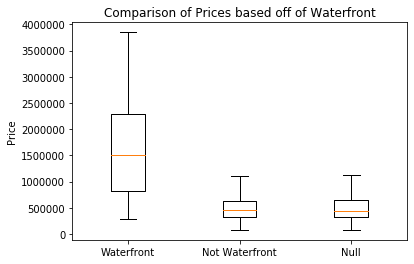

In [5]:
on_water = df.price[df['waterfront'] == 1]
not_on_water = df.price[df['waterfront'] == 0]
null_values = df.price[df['waterfront'].isna()]
plt.boxplot([on_water,not_on_water,null_values],labels = ['Waterfront','Not Waterfront', 'Null'],showfliers = False)
plt.title('Comparison of Prices based off of Waterfront')
plt.ylabel('Price')
plt.show()

Waterfront seems to cause an increase in price but this would have to be further evaluated later within the model. More importantly for now, it seems that when the waterfront value is null it most resembles when the property is not waterfront. Thus these NaN values can be replace with 0.

In [6]:
df.waterfront.fillna(0,inplace=True)
df.isna().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront          0
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

The focus then shifts to yr_renovated where we repeat the same process of evaluating how we can change the NaN values

In [7]:
df.yr_renovated.value_counts()


0.0       17011
2014.0       73
2003.0       31
2013.0       31
2007.0       30
          ...  
1946.0        1
1959.0        1
1971.0        1
1951.0        1
1954.0        1
Name: yr_renovated, Length: 70, dtype: int64

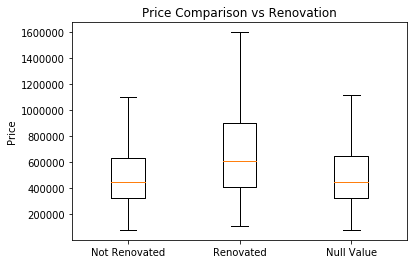

In [8]:
not_renovated = df.price[df['yr_renovated'] == 0]
renovated = df.price[(df['yr_renovated'] != 0) & (df['yr_renovated'].notna())]
null_ren = df.price[df['yr_renovated'].isna()]
plt.boxplot([not_renovated,renovated,null_ren],
            labels = ['Not Renovated','Renovated','Null Value'],showfliers = False)
plt.title('Price Comparison vs Renovation')
plt.ylabel('Price')
plt.show()

The same conclusions can be drawn in which all the null values are replaces with 0 as they seem to exhibit similar behavior.

In [9]:
df.yr_renovated.fillna(0,inplace=True)
df.isna().sum()

id                0
date              0
price             0
bedrooms          0
bathrooms         0
sqft_living       0
sqft_lot          0
floors            0
waterfront        0
view             63
condition         0
grade             0
sqft_above        0
sqft_basement     0
yr_built          0
yr_renovated      0
zipcode           0
lat               0
long              0
sqft_living15     0
sqft_lot15        0
dtype: int64

There are remaining 63 null values in the view column. Let's first see the unique values in the view column and then create a boxplot of view with respect to price based off those unique values.

In [10]:
df.view.unique()

array([ 0., nan,  3.,  4.,  2.,  1.])

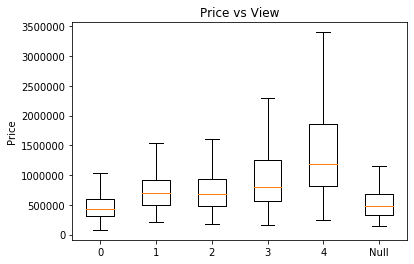

In [11]:
zero = df.price[df['view'] == 0]
one = df.price[df['view'] == 1]
two = df.price[df['view'] == 2]
three = df.price[df['view'] == 3]
four = df.price[df['view'] == 4]
null_view = df.price[df['view'].isna()]
plt.boxplot([zero,one,two,three,four,null_view],labels = ['0','1','2','3','4','Null'],showfliers = False)
plt.title('Price vs View')
plt.ylabel('Price')
plt.show()

It seems as though the null values can be replaced for 0. Let's next check the object type of every column to see where further data scrubbing is needed. 

In [12]:
df.view.fillna(0,inplace=True)
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null float64
view             21597 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     21597 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB
None


It seems as though the variable "sqft_basement" is listed as an object type. This needs to be changed to float type or integer in order to perform the necessary analysis. There is a potential for non-number characters to be in this column. This can be found out by looking at the column's unique values.

In [13]:
df.sqft_basement.unique()

array(['0.0', '400.0', '910.0', '1530.0', '?', '730.0', '1700.0', '300.0',
       '970.0', '760.0', '720.0', '700.0', '820.0', '780.0', '790.0',
       '330.0', '1620.0', '360.0', '588.0', '1510.0', '410.0', '990.0',
       '600.0', '560.0', '550.0', '1000.0', '1600.0', '500.0', '1040.0',
       '880.0', '1010.0', '240.0', '265.0', '290.0', '800.0', '540.0',
       '710.0', '840.0', '380.0', '770.0', '480.0', '570.0', '1490.0',
       '620.0', '1250.0', '1270.0', '120.0', '650.0', '180.0', '1130.0',
       '450.0', '1640.0', '1460.0', '1020.0', '1030.0', '750.0', '640.0',
       '1070.0', '490.0', '1310.0', '630.0', '2000.0', '390.0', '430.0',
       '850.0', '210.0', '1430.0', '1950.0', '440.0', '220.0', '1160.0',
       '860.0', '580.0', '2060.0', '1820.0', '1180.0', '200.0', '1150.0',
       '1200.0', '680.0', '530.0', '1450.0', '1170.0', '1080.0', '960.0',
       '280.0', '870.0', '1100.0', '460.0', '1400.0', '660.0', '1220.0',
       '900.0', '420.0', '1580.0', '1380.0', '475.0', 

There seems to be some values listed as '?'. The choice here is to replace these values via a statistical or logical reason or drop them as they only account for 2%. However, based of the column name descriptions it is possible that sqft_basement = sqft_living - sqft_above. Thus, lets first see if this holds true at first glance by examining a few rows. 

In [14]:
df.loc[:,['sqft_living','sqft_above','sqft_basement']]

,sqft_living,sqft_above,sqft_basement
0,1180,1180,0.0
1,2570,2170,400.0
2,770,770,0.0
3,1960,1050,910.0
4,1680,1680,0.0
...,...,...,...
21592,1530,1530,0.0
21593,2310,2310,0.0
21594,1020,1020,0.0
21595,1600,1600,0.0


It seems as though this might be the case thus lets find out via a boolean comparison. First we should ensure that the dtype for all columns are the same and we have to drop the '?' as this would error. 

In [15]:
# make a copy to drop "?" values to perform boolean comparison
test_df = df.copy()
test_df = test_df[test_df.sqft_basement != '?']
# needed a separate line of code for '0.0' as .astype(float) would error
test_df.sqft_basement[test_df.sqft_basement == '0.0'] = 0
# now I can convert datatype of the whole set to float
test_df.sqft_basement = test_df.sqft_basement.astype(float)
test_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21143 entries, 0 to 21596
Data columns (total 21 columns):
id               21143 non-null int64
date             21143 non-null object
price            21143 non-null float64
bedrooms         21143 non-null int64
bathrooms        21143 non-null float64
sqft_living      21143 non-null int64
sqft_lot         21143 non-null int64
floors           21143 non-null float64
waterfront       21143 non-null float64
view             21143 non-null float64
condition        21143 non-null int64
grade            21143 non-null int64
sqft_above       21143 non-null int64
sqft_basement    21143 non-null float64
yr_built         21143 non-null int64
yr_renovated     21143 non-null float64
zipcode          21143 non-null int64
lat              21143 non-null float64
long             21143 non-null float64
sqft_living15    21143 non-null int64
sqft_lot15       21143 non-null int64
dtypes: float64(9), int64(11), object(1)
memory usage: 3.5+ MB


Now let's see if this relationship between the 3 variables is consistent throughout the entire dataset

In [16]:
(test_df.sqft_basement != test_df.sqft_living - test_df.sqft_above).sum()

0

Thus we can conclude that any row with a value of '?' in the sqft_basement column can be replaced by using the data from sqft_living and sqft_above. 

In [17]:
difference = (df.loc[df["sqft_basement"] == '?', ["sqft_living"]
                   ]).values-(df.loc[df["sqft_basement"] == '?', ["sqft_above"]]).values
df.loc[df["sqft_basement"] == '?', ["sqft_basement"]] = difference

In [18]:
#change the dtype to int64 to be consistent with the rest of the 'sqft' variables
df.sqft_basement = df.sqft_basement.astype(float)
df.sqft_basement = df.sqft_basement.astype('int64')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null float64
view             21597 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null int64
yr_built         21597 non-null int64
yr_renovated     21597 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(12), object(1)
memory usage: 3.5+ MB


Next, we can see that the column 'id' is not a object type thus this needs to be changed as these values have no actual statistical value but rather are simply for the means of identification.

In [19]:
df.id = df.id.astype('str')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null object
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null float64
view             21597 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null int64
yr_built         21597 non-null int64
yr_renovated     21597 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


It seems as though, the column data is not a datetime64 datatype. 

In [20]:
df['date'] = df['date'].astype('datetime64')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null object
date             21597 non-null datetime64[ns]
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null float64
view             21597 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null int64
yr_built         21597 non-null int64
yr_renovated     21597 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: datetime64[ns](1), float64(8), int64(11), object(1)
memory 

In [21]:
#this DataFrame copy is made for Modeling Trial 3.
df3=df.copy()

# 3. Exploratory Data Analysis

This section of the project consists of preparing the data in a way that will ensure an accurate and well-performing model. First, let's observe the statistical features of the predictors and the target variable. From there we can observe the distribution of each variable to see if any further manipulation of data is necessary as well as a scatter matrix to the linear correlation among the features

In [22]:
df.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.006760,0.233181,3.409825,7.657915,1788.596842,291.725008,1970.999676,68.758207,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.081944,0.764673,0.650546,1.173200,827.759761,442.667800,29.375234,364.037499,53.513072,0.138552,0.140724,685.230472,27274.441950
min,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


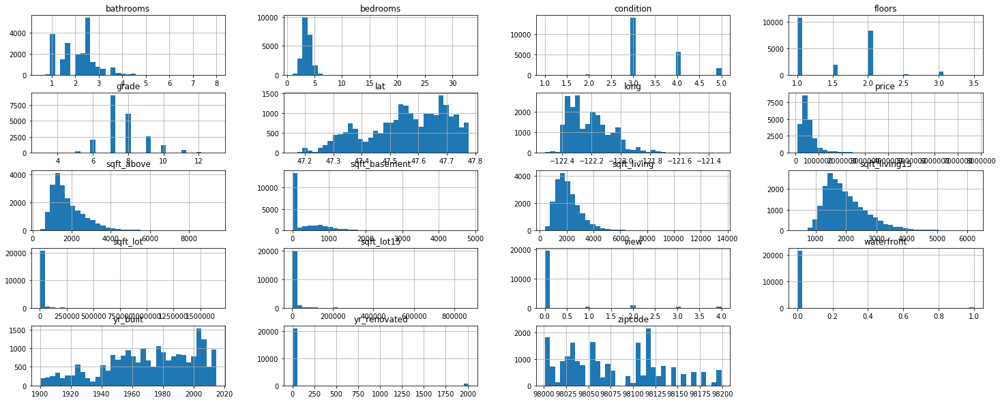

In [23]:
df.hist(figsize = (25,10),bins = 35)
plt.show()

######## Markdown because this code takes a long time to run. 
pd.plotting.scatter_matrix(df,figsize=(25,15))
plt.show()

The histograms above give us a lot of information as to what needs to be done in order to have a good model as one would like for all these variables to follow a normal distribution. The scatter matrix gives me an initial idea as to what variables are correlated with the focus being on the target variable price. One, can see that the distributions of some features do not follow normal behavior which causes the need for some variables to be dropped, categorized, or transformed. Thus, let's first examine zipcode to see which zipcodes have the highest price and if there's a clear grouping that can be made.

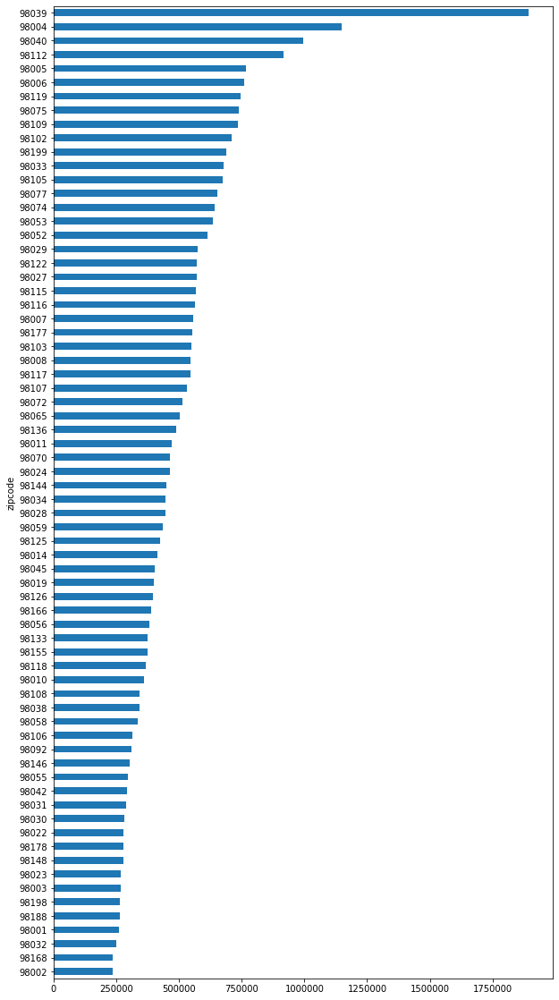

In [24]:
df.groupby('zipcode')['price'].median().sort_values().plot(kind = 'barh',figsize = (10,20))
plt.show()

Based off the bar graph there seems to be 4 zipcodes that differentiate themselves in terms of highest price: 

* 98038
* 98004 
* 98040
* 98112

Let's see where these top 4 groups are and if they are near each other. 

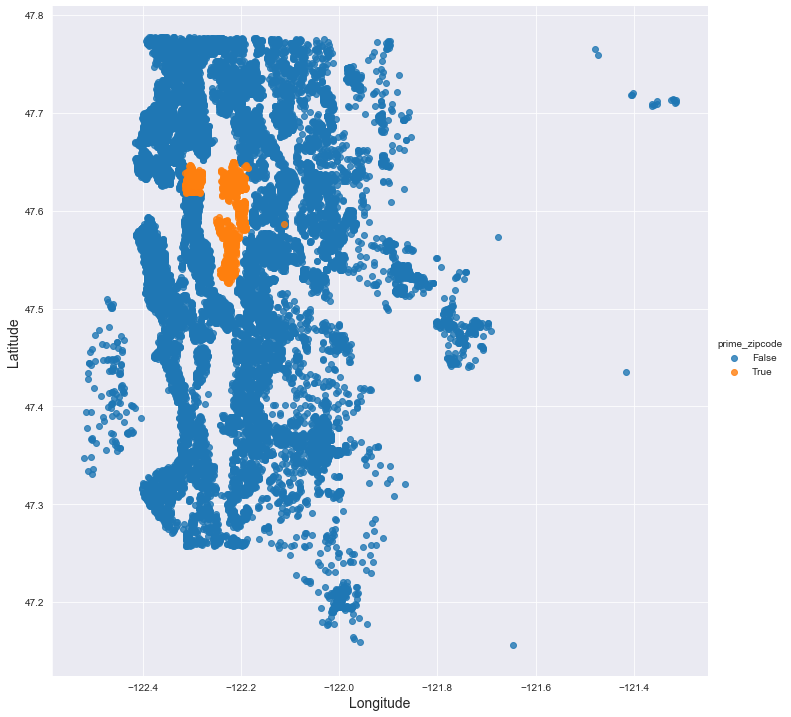

In [25]:
df['prime_zipcode'] = df['zipcode'].isin([98039, 98004, 98040, 98112])
sns.set_style('darkgrid')
g = sns.lmplot(data = df,x = 'long',y = 'lat',hue = 'prime_zipcode',height = 10, fit_reg = False)
plt.xlabel('Longitude', fontsize = 14)
plt.ylabel('Latitude', fontsize = 14)
plt.savefig('prime_zip.jpg', bbox_inches = 'tight')
plt.show()
sns.set_style('white')

It looks like these top 4 zipcodes are near. It also looks like the next two highest median price values with respect to zipcode are near these top 4 zipcodes. Thus it's suspected that being closer to these zipcodes would lead to an increase in prices as this grouping of top zipcodes with respect to price seems to indicate that location may be a key predictor in price. To investigate this, we'll add a variable called "dist_from_top" that consists of the distance from the average coordinates of the top 4 zipcodes. Let's first find out the average coordinates of the top 4 zipcodes. 

In [26]:
prime = df['zipcode'].isin([98039, 98004, 98040, 98112])
coordinates = [df[prime].lat.mean(),df[prime].long.mean()]
print(coordinates)

[47.60333997821352, -122.2401579520698]


We'll now introduce a function called dist_calc that will calculate the distance of every house from the average coordinates an introduce this variable into the DataFrame.

NOTE: Two variables that measured the distance from Seattle and Bellevue were added at first but the multicollinearity between the two was too high thus I wanted to have a variable that could incorporate these two separate variables together hence dist_from_top.

In [27]:
# Radius of Earth in miles
radius = 3958.8

def dist_calc(lat2,lon2,coordinates):
    lat1 = math.radians(coordinates[0])
    lon1 = math.radians(coordinates[1])
    lat2 = math.radians(lat2)
    lon2 = math.radians(lon2)
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = math.sin(dlat / 2) ** 2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon / 2) ** 2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    dist = radius * c
    return dist

In [28]:
#incorporate this variable into the dataframe using the made function
df['dist_from_top'] = df.apply(lambda x: dist_calc(x['lat'], x['long'], coordinates), axis = 1)
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'prime_zipcode',
       'dist_from_top'],
      dtype='object')

This predictor variable has the potential for us to drop lat, long, and zipcode but further evaluation is needed as far as categorizing zipcode and let's first just see how the model performs with latitude and longitude in the DataFrame.

## Multicollinearity

Now that we have introduced a new variable , the next point of focus is to check for multicollinearity. Multicollinearity refers to a situation in which the predictor variables in a multiple regression model are highly linearly related. Thus to check this we introduce using the seaborn package and develop a correlation matrix to check for multicollinearity. 


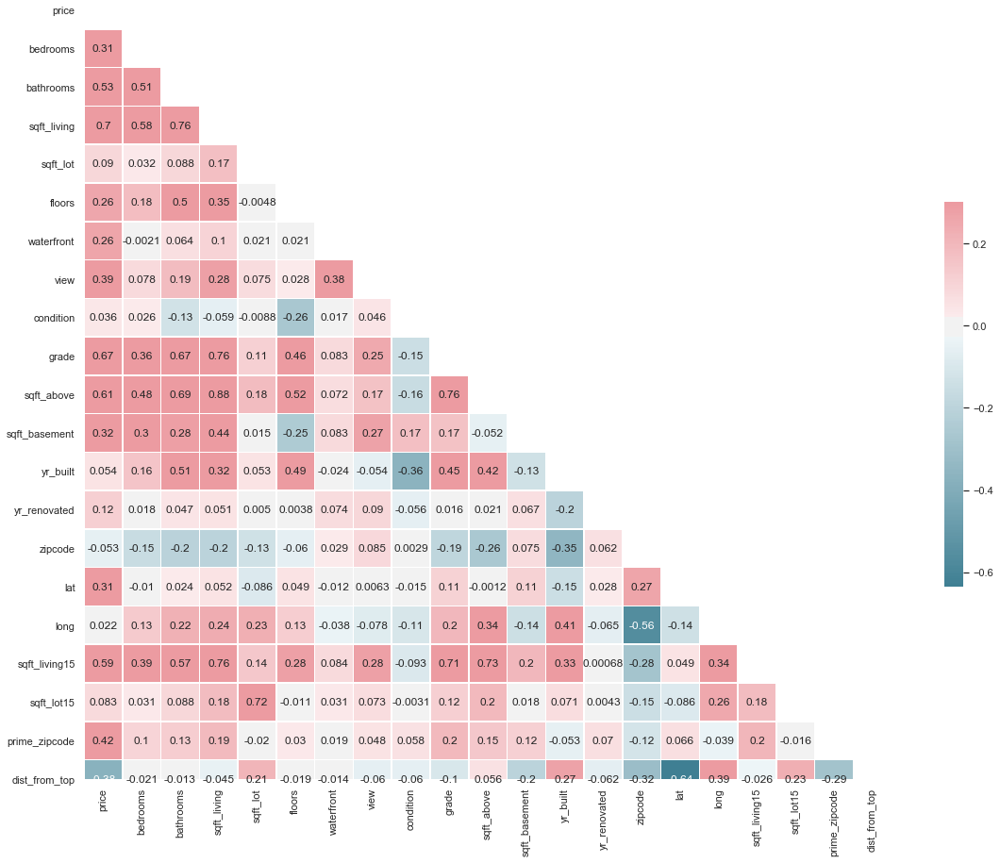

In [29]:
# Set the style of the visualization
sns.set(style="white")

# Create a covariance matrix
corr = df.corr()

# Generate a mask the size of our covariance matrix
mask = np.zeros_like(corr, dtype = np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize = (20, 15))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap = True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask = mask, cmap = cmap, vmax = .3, center = 0, annot = True,
            square = True, linewidths = .5, cbar_kws = {"shrink": .5})
plt.show()

Let's see which predictors have a correlation of over 0.75 and how many times this happens. 

In [30]:
#subtract one as each variable is correlated to itself
(abs(df.corr()) > .75).sum() - 1

price            0
bedrooms         0
bathrooms        1
sqft_living      4
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            2
sqft_above       2
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    1
sqft_lot15       0
prime_zipcode    0
dist_from_top    0
dtype: int64

With a cutoff of 0.75 the following variables have a high correlation:

* sqft_living and sqft_living15 with correlation value of .756
* sqft_living and bathrooms with correlation value of .756
* sqft_living and sqft_above with correlation value of .876
* sqft_living and grade with correlation value of .762
* sqft_above and grade with correlation value of .756

The column sqft_living is dropped as it seems to be the consistent parameter that causes multicollinearity.


In [31]:
df.drop(['sqft_living'],axis = 1,inplace = True)

Now we can once again evaluate the heatmap to see if any new correlations above 0.75 come about. 

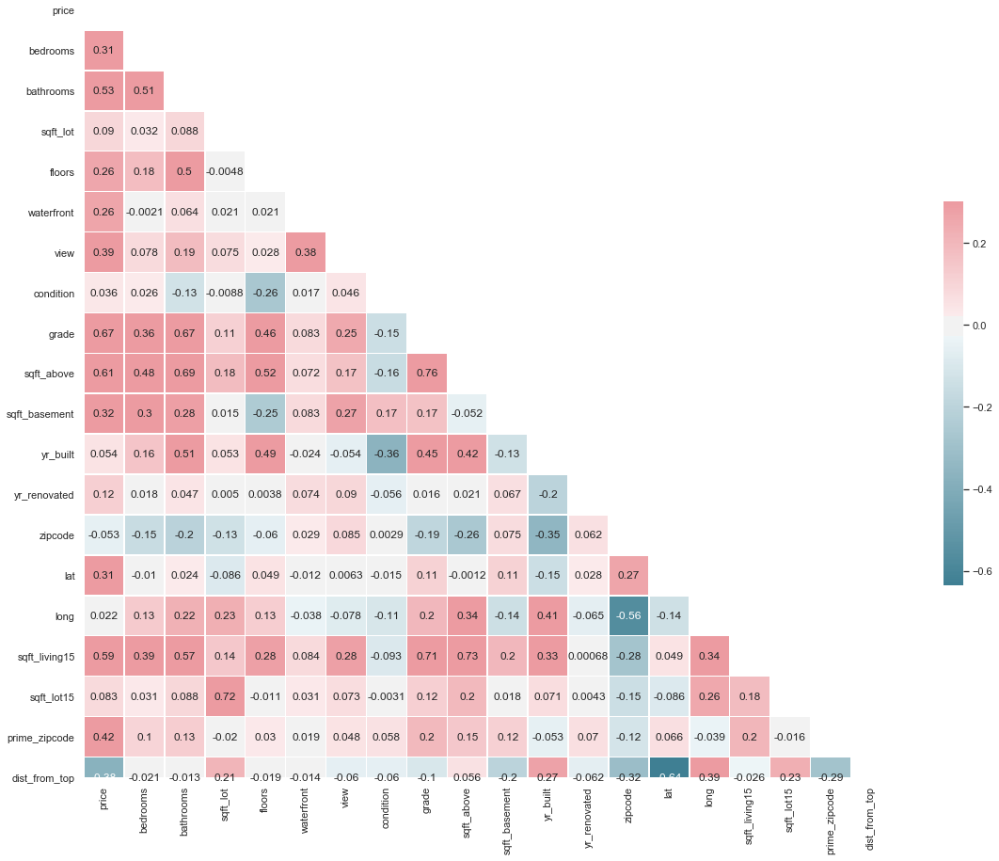

In [32]:
sns.set(style = "white")

# Create a covariance matrix
corr = df.corr()

# Generate a mask the size of our covariance matrix
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 15))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask = mask, cmap = cmap, vmax = .3, center = 0, annot = True,
            square = True, linewidths = .5, cbar_kws = {"shrink": .5})
plt.show()

Let's again check to see if there are any correlation values of over 0.75

In [33]:
(abs(df.corr()) > .75).sum() - 1

price            0
bedrooms         0
bathrooms        0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            1
sqft_above       1
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
prime_zipcode    0
dist_from_top    0
dtype: int64

We can see that sqft_above and grade still have a correlation value above 0.75. Thus further investigation is needed via a scatter plot to get an idea of this relationship. 

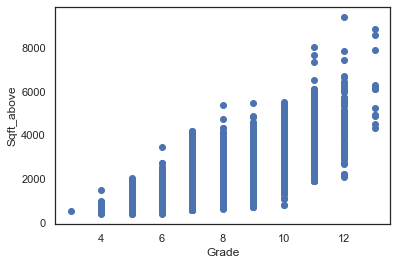

In [34]:
plt.scatter(df.grade,df.sqft_above)
plt.xlabel('Grade')
plt.ylabel('Sqft_above')
plt.show()

It seems as though there is a linear relationship among these predictors. However, because it seems as though grade can become a categorical variable, let's wait and first develop our categorical predictors and then evaluate the multicollinearity once again.

## Categorical Variable Designation/Further Data Cleaning

After review of the histograms it is determined the following are potential categorical variables:

* bedroom
* bathroom 
* waterfront
* view 
* condition     
* zipcode
* grade
* floors 
* yr_renovated
* yr_built

It was decided that for now the variables that require dummy variable creation in order to properly categorize them are: 

* condition
* view
* waterfront
* grade
* yr_renovated
* yr_built

However, some binning is necessary to  minimize the amount of predictors in the model. After viewing the boxplots for view and waterfront, it is determined that binning is not necessary as each value for view and waterfront has its own unique price range. The first categorical variable that will be binned is condition. Let's first examine the boxplot for price with respect to condition. 


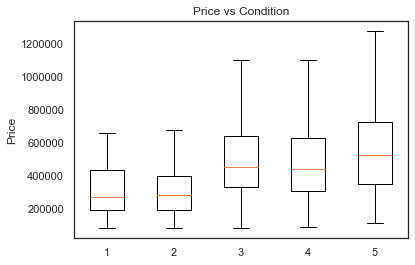

In [35]:
one=df.price[df['condition'] == 1]
two=df.price[df['condition'] == 2]
three=df.price[df['condition'] == 3]
four=df.price[df['condition'] == 4]
five=df.price[df['condition'] == 5]
plt.boxplot([one,two,three,four,five],labels = ['1','2','3','4','5'],showfliers = False)
plt.title('Price vs Condition')
plt.ylabel('Price')
plt.show()

It looks like the data presents itself in a way to where 2 bins can be constructed where the first bin is [ 1 , 2 ] and the second bin is ( 2 , 5 ]. The next variable that is binned is yr_built. First let's view the distribution of this variable.

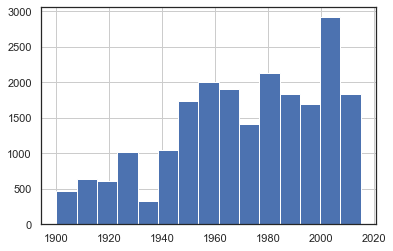

In [36]:
df.yr_built.hist(bins = 15)
plt.show()

The information gained from this histogram will be taken into account in addition to accounting for the 3 most significant recessions in the USA during this time span. The first recession taken into account is the Great Depression from 1929-1933. This will be its own bin and everything before the Great Depression will be its own bin as well. From there the next bin will end at the 1973 recession. The 1973 recession is then followed by two significant recession the next 10 years. Thus this period of 3 recessions is binned together. The next bin then starts at 1983 until 1990. From there the selection for the next bin spans from 1990-2000. The bin following that leads up to 2007 in which the Great Recession occurs. This period will be binned by itself from 2007-2009, and a bin from 2009 and on is created after that. The next variable to be binned is view. Let's first look at the average prices for each view value. 

In [37]:
prices = {}
for i in range(0,5):
    x = df[df['view'] == i].price.mean()
    prices[i] = x
print(prices)

{0: 497210.71439568896, 1: 813373.2666666667, 2: 791390.3709508881, 3: 973285.1968503937, 4: 1452465.883280757}


It looks like 3 bins can be made from [0,1), [1,4), [4,5)

In [38]:
bins_view = [-1,0,3,4]
view = pd.cut(df['view'], bins_view)
view = view.cat.as_unordered()

bins = [1899,1928,1933,1972,1982 , 1990, 2000, 2007,2009, 2020]
new_age = pd.cut(df['yr_built'], bins)
new_age = new_age.cat.as_unordered()

bins_cond = [0,2,5]
cond = pd.cut(df['condition'], bins_cond)
cond = cond.cat.as_unordered()



This economic research led to the tangent of deciding whether a separate set of categorical variables are necessary for the year the house was sold as this it is suspected that the sale date can have an affect on the price. Lets investigate this by use of a scatter plot:

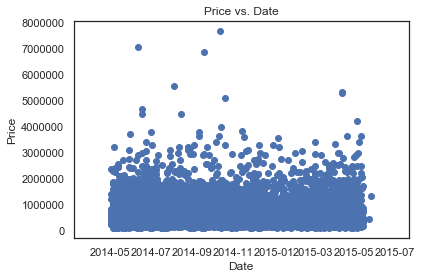

In [39]:
plt.scatter(df.date,df.price)
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Price vs. Date')
plt.show()


Based off this plot, there is no linear relationship between date and price. The next variable that needs to be categorized is grades. Let's first evaluate its distribution to see if there's an obvious grouping. 

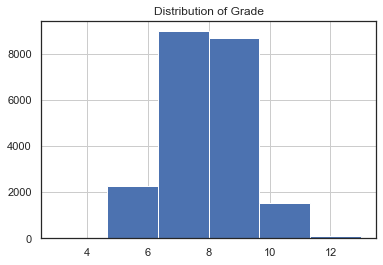

In [40]:
df.grade.hist(bins=6)
plt.title('Distribution of Grade')
plt.show()

It seems that 3 bins for grades of 0-7, 7-9, and 9-13 is the logical choice. After further research it is found that grade represents the construction quality of improvements and they are generally defined as:

* 1-3: Falls short of minimum building standards. Normally cabin or inferior structure.

* 4: Generally older, low quality construction. Does not meet code.

* 5: Low construction costs and workmanship. Small, simple design.

* 6: Lowest grade currently meeting building code. Low quality materials and simple designs.

* 7: Average grade of construction and design. Commonly seen in plats and older sub-divisions.

* 8: Just above average in construction and design. Usually better materials in both the exterior and interior finish work.

* 9: Better architectural design with extra interior and exterior design and quality.

* 10: Homes of this quality generally have high quality features. Finish work is better and more design quality is seen in the floor plans. Generally have a larger square footage.

* 11: Custom design and higher quality finish work with added amenities of solid woods, bathroom fixtures and more luxurious options.

* 12: Custom design and excellent builders. All materials are of the highest quality and all conveniences are present.

* 13: Generally custom designed and built. Mansion level. Large amount of highest quality cabinet work, wood trim, marble, entry ways etc.

Taking into account these descriptions along with the distribution of the predictor, 3 bins are created that consist of a grade of below average, average, and above average with grades of 1-6 being below average, grades 7-9 being average, and grades 10-13 being above average.

In [41]:
grade_bins = [0,6,9,13]
grade_bins = pd.cut(df['grade'], grade_bins)
grade_bins = grade_bins.cat.as_unordered()
new_grade = pd.get_dummies(grade_bins,prefix = 'grade')

After review of the histogram for yr_renovated. Further investigation is needed to see how much of the data has a value of 0 for yr_renovated.

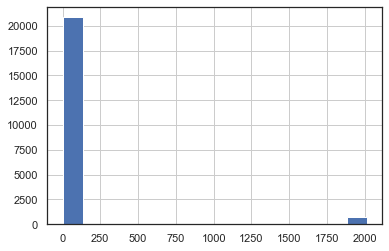

In [42]:
df.yr_renovated.hist(bins = 15)

In [43]:
num_zero = (df.yr_renovated == 0).sum()
print('Zero is the value for {}% of the data in the column "yr_renovated"'.format(round(num_zero / len(df) * 100,2)))

Zero is the value for 96.56% of the data in the column "yr_renovated"


This is a large amount thus the variable yr_renovated can be transformed into a boolean column named "Renovated?" that simply depends on whether the house was renovated or not.

In [44]:
renovated = []
for val in df.yr_renovated:
    if val == 0:
        renovated.append(False)
    else:
        renovated.append(True)
ren = np.array(renovated)
ren = pd.DataFrame(ren,columns = ['Renovated?'])
df = pd.concat([df,ren],axis = 1)

We now can create the categorical variables and incorporate them into the DataFrame. We also can drop the original columns with variables that were categorized.  

In [45]:
cond = pd.get_dummies(cond,prefix = 'condition')
view = pd.get_dummies(view,prefix = 'view')
waterfront = pd.get_dummies(df['waterfront'],prefix = 'waterfront')
grade = pd.get_dummies(new_grade,prefix = 'grade')
dum_ren = pd.get_dummies(df['Renovated?'],prefix = 'Renovated?')
new_age = pd.get_dummies(new_age,prefix = 'yr_built')
prime_zip = pd.get_dummies(df['prime_zipcode'],prefix = 'prime_zipcode')

In [46]:
df = pd.concat([df,cond,view,waterfront,new_age,grade,dum_ren,prime_zip],axis = 1)
df.drop(['condition','view','waterfront','grade','yr_built',
             'yr_renovated','Renovated?','prime_zipcode'],axis = 1,inplace = True)
df.head()

,id,date,price,bedrooms,bathrooms,sqft_lot,floors,sqft_above,sqft_basement,zipcode,...,"yr_built_(2000, 2007]","yr_built_(2007, 2009]","yr_built_(2009, 2020]","grade_(0, 6]","grade_(6, 9]","grade_(9, 13]",Renovated?_False,Renovated?_True,prime_zipcode_False,prime_zipcode_True
0,7129300520,2014-10-13,221900.0,3,1.00,5650,1.0,1180,0,98178,...,0,0,0,0,1,0,1,0,1,0
1,6414100192,2014-12-09,538000.0,3,2.25,7242,2.0,2170,400,98125,...,0,0,0,0,1,0,0,1,1,0
2,5631500400,2015-02-25,180000.0,2,1.00,10000,1.0,770,0,98028,...,0,0,0,1,0,0,1,0,1,0
3,2487200875,2014-12-09,604000.0,4,3.00,5000,1.0,1050,910,98136,...,0,0,0,0,1,0,1,0,1,0
4,1954400510,2015-02-18,510000.0,3,2.00,8080,1.0,1680,0,98074,...,0,0,0,0,1,0,1,0,1,0


In [47]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_lot', 'floors',
       'sqft_above', 'sqft_basement', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'dist_from_top', 'condition_(0, 2]',
       'condition_(2, 5]', 'view_(-1, 0]', 'view_(0, 3]', 'view_(3, 4]',
       'waterfront_0.0', 'waterfront_1.0', 'yr_built_(1899, 1928]',
       'yr_built_(1928, 1933]', 'yr_built_(1933, 1972]',
       'yr_built_(1972, 1982]', 'yr_built_(1982, 1990]',
       'yr_built_(1990, 2000]', 'yr_built_(2000, 2007]',
       'yr_built_(2007, 2009]', 'yr_built_(2009, 2020]', 'grade_(0, 6]',
       'grade_(6, 9]', 'grade_(9, 13]', 'Renovated?_False', 'Renovated?_True',
       'prime_zipcode_False', 'prime_zipcode_True'],
      dtype='object')

In [48]:
df.drop(['Renovated?_False','waterfront_0.0','prime_zipcode_False','condition_(0, 2]',
        'view_(-1, 0]','grade_(0, 6]'],axis = 1,inplace = True)
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_lot', 'floors',
       'sqft_above', 'sqft_basement', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'dist_from_top', 'condition_(2, 5]',
       'view_(0, 3]', 'view_(3, 4]', 'waterfront_1.0', 'yr_built_(1899, 1928]',
       'yr_built_(1928, 1933]', 'yr_built_(1933, 1972]',
       'yr_built_(1972, 1982]', 'yr_built_(1982, 1990]',
       'yr_built_(1990, 2000]', 'yr_built_(2000, 2007]',
       'yr_built_(2007, 2009]', 'yr_built_(2009, 2020]', 'grade_(6, 9]',
       'grade_(9, 13]', 'Renovated?_True', 'prime_zipcode_True'],
      dtype='object')

In [49]:
# copy made for trial 2
df2=df.copy()

## Normalization and Standardization of Data

To begin the process of normalizing data, we first should evaluate the distribution of each variable.

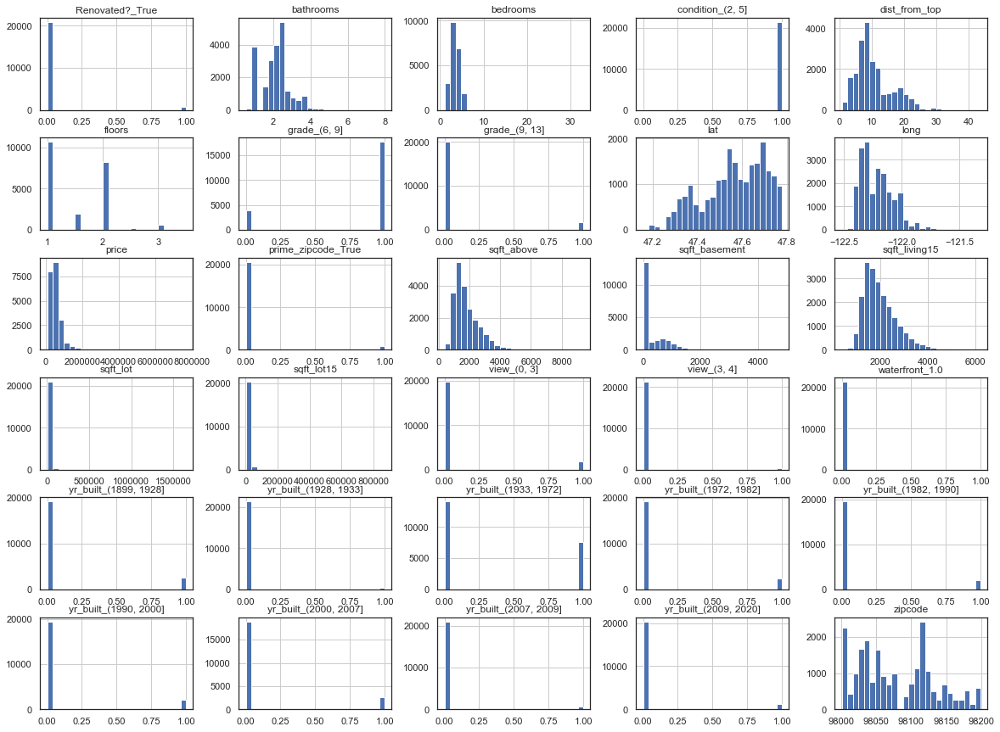

In [50]:
df.hist(figsize = [20,15],bins = 25)
plt.show()

From the histograms, one can determine that many of the variables do not follow normal distribution behavior. Thus to help make these variables more normal, a log transformation is done. The variables are then standardized. The  variables to be normally distributed and log transformed are:

* sqft_above
* sqft_living15
* sqft_lot
* sqft_lot15
* sqft_basement
* dist_from_top
* floors
* bathrooms
* bedrooms
* price

In [51]:
# log transform data
df.sqft_above = np.log(df.sqft_above)
df.sqft_living15 = np.log(df.sqft_living15)
df.sqft_lot = np.log(df.sqft_lot)
df.sqft_lot15 = np.log(df.sqft_lot15)
df.price = np.log(df.price)
df.sqft_basement = np.log1p(df.sqft_basement)
df.bedrooms = np.log(df.bedrooms)
df.bathrooms = np.log(df.bathrooms)
df.dist_from_top = np.log(df.dist_from_top)
df.floors = np.log(df.floors)

In [52]:
# Standardization of data
df.sqft_above = (df.sqft_above - df.sqft_above.mean()) / df.sqft_above.std()
df.sqft_living15 = (df.sqft_living15 - df.sqft_living15.mean()) / df.sqft_living15.std()
df.sqft_lot = (df.sqft_lot - df.sqft_lot.mean()) / df.sqft_lot.std()
df.sqft_lot15 = (df.sqft_lot15 - df.sqft_lot15.mean()) / df.sqft_lot15.std()
df.sqft_basement = (df.sqft_basement - df.sqft_basement.mean())/df.sqft_basement.std()
df.dist_from_top = (df.dist_from_top - df.dist_from_top.mean())/df.dist_from_top.std()
df.price = (df.price - df.price.mean()) / df.price.std()
df.floors = (df.floors - df.floors.mean()) / (df.floors.std())
df.bathrooms = (df.bathrooms - df.bathrooms.mean()) / (df.bathrooms.std())
df.bedrooms = (df.bedrooms - df.bedrooms.mean()) / (df.bedrooms.std())

After this standardization, we are almost ready to model the DataFrame but the multicollinearity should be checked one final time.

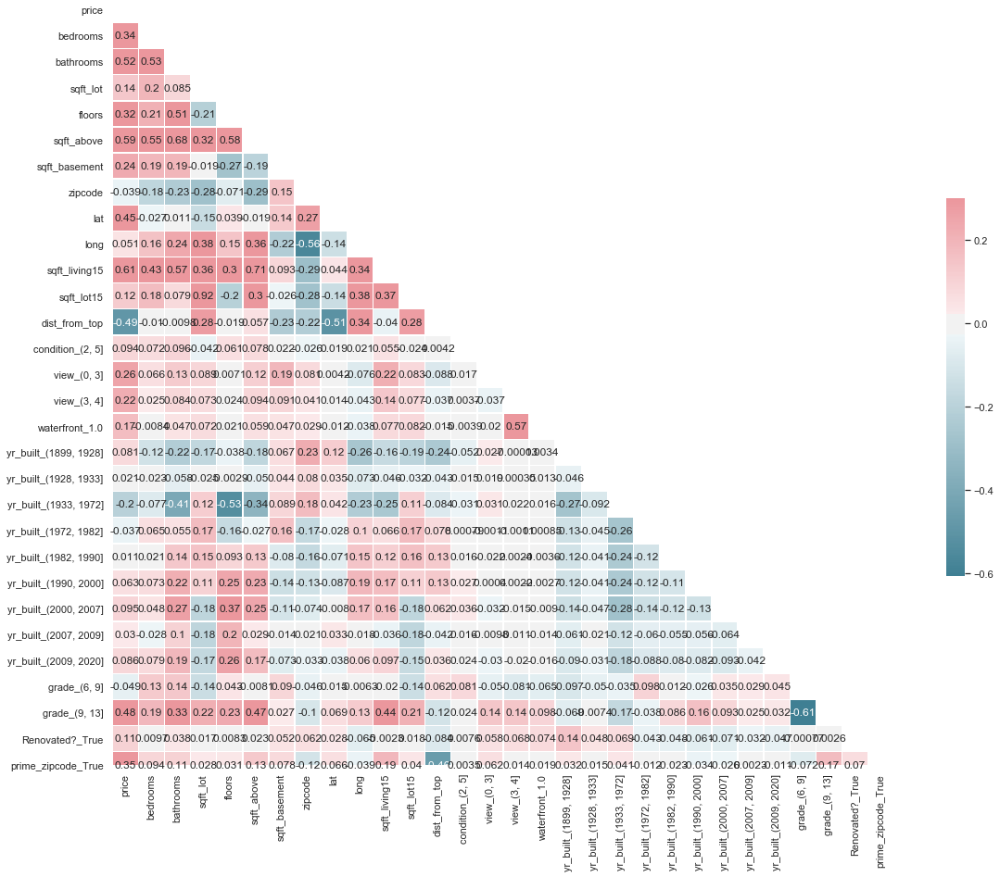

In [53]:
sns.set(style="white")

# Create a covariance matrix
corr = df.corr()

# Generate a mask the size of our covariance matrix
mask = np.zeros_like(corr, dtype = np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize = (20, 15))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap = True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask = mask, cmap = cmap, vmax = .3, center = 0, annot = True,
            square = True, linewidths = .5, cbar_kws = {"shrink": .5})
plt.show()

In [54]:
(abs(df.corr()) > .75).sum() - 1

price                    0
bedrooms                 0
bathrooms                0
sqft_lot                 1
floors                   0
sqft_above               0
sqft_basement            0
zipcode                  0
lat                      0
long                     0
sqft_living15            0
sqft_lot15               1
dist_from_top            0
condition_(2, 5]         0
view_(0, 3]              0
view_(3, 4]              0
waterfront_1.0           0
yr_built_(1899, 1928]    0
yr_built_(1928, 1933]    0
yr_built_(1933, 1972]    0
yr_built_(1972, 1982]    0
yr_built_(1982, 1990]    0
yr_built_(1990, 2000]    0
yr_built_(2000, 2007]    0
yr_built_(2007, 2009]    0
yr_built_(2009, 2020]    0
grade_(6, 9]             0
grade_(9, 13]            0
Renovated?_True          0
prime_zipcode_True       0
dtype: int64

It looks like there is some multicollinearity between sqft_lot15 and sqft_lot. To determine which predictor to drop, let's evaluate which parameter least follows a normal distribution's behavior.

In [55]:
print('Sqft_lot Parameters:\nKurtosis: {}\nSkewness: {}'.format(df.sqft_lot.kurtosis(),df.sqft_lot.skew()))
print('----------------------------')
print('Sqft_lot15 Parameters:\nKurtosis: {}\nSkewness: {}'.format(df.sqft_lot15.kurtosis(),df.sqft_lot15.skew()))

Sqft_lot Parameters:
Kurtosis: 3.330022847809785
Skewness: 0.9625003856495584
----------------------------
Sqft_lot15 Parameters:
Kurtosis: 3.564328654399475
Skewness: 0.9662023077970391


Sqft_lot15 has a higher kurtosis and skewness and thus will be dropped.

In [56]:
df.drop('sqft_lot15',axis=1,inplace=True)

Next, let's evaluate histograms with kde plots to better understand the distributions of the continuous variables.

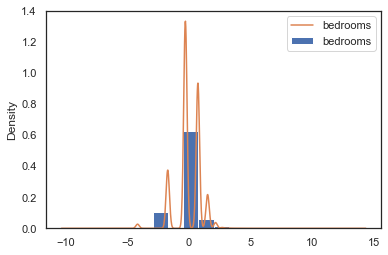

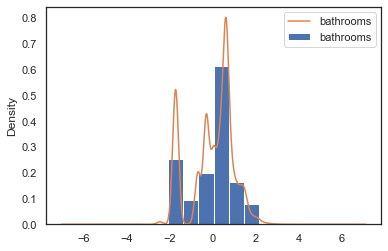

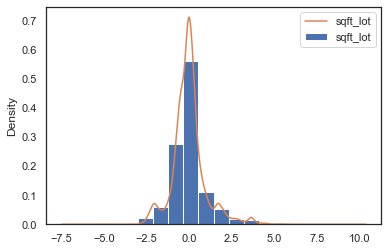

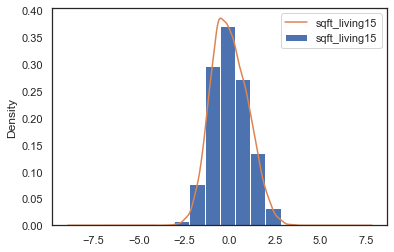

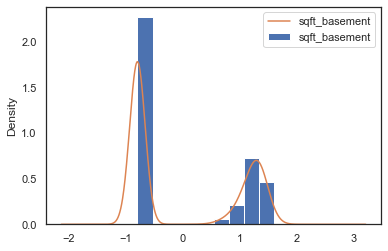

...

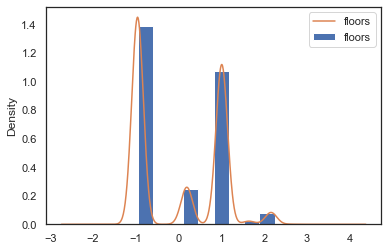

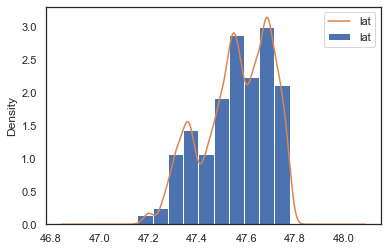

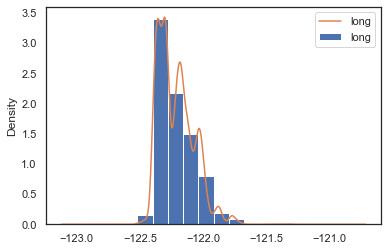

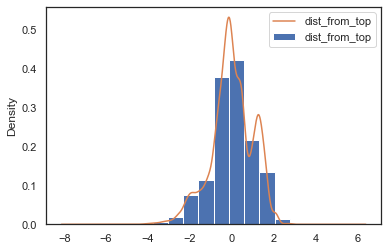

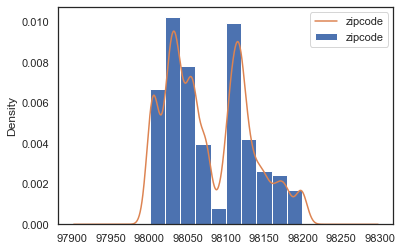

In [57]:
for col in ['bedrooms','bathrooms','sqft_lot','sqft_living15',
            'sqft_basement','sqft_above','floors','lat','long','dist_from_top','zipcode']:
    df[col].plot.hist(density = True )
    df[col].plot.kde(label = col )
    plt.legend()
    plt.show()

The continuous variables seem to follow a normal distribution for the most part. The variables that are most in question are floors, bedrooms, bathrooms, longitude, and latitude. Let's first evaluate the initial model before we decided what to do. There is potential to either normalize and standardize the longitude and latitude variables or simply drop them because of the variable dist_from_top. We'll next evaluate the linearity between each predictor and the target variable "price" in order to understand which predictors seem to show linear behavior with respect to the target variable. 

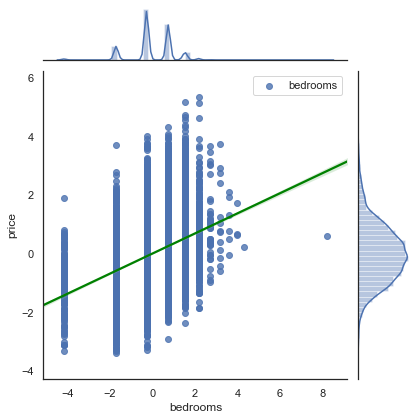

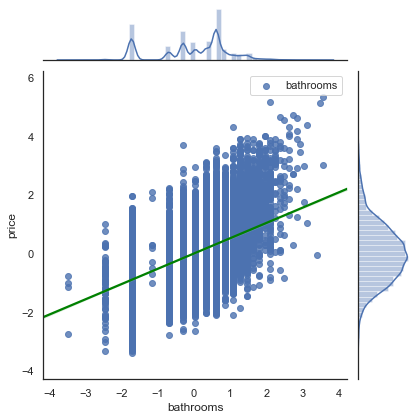

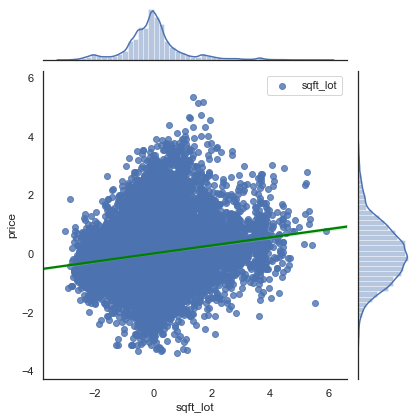

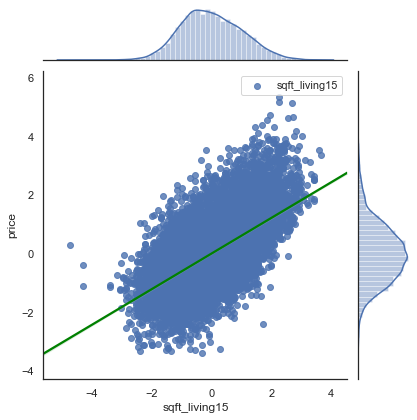

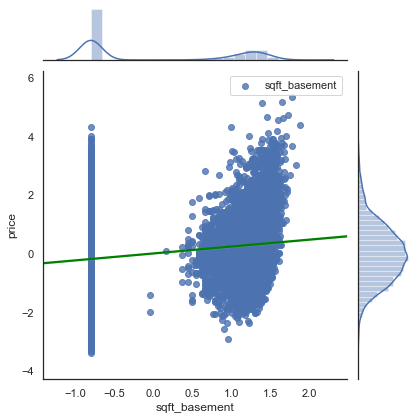

...

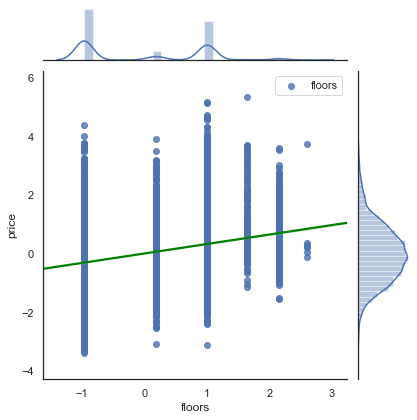

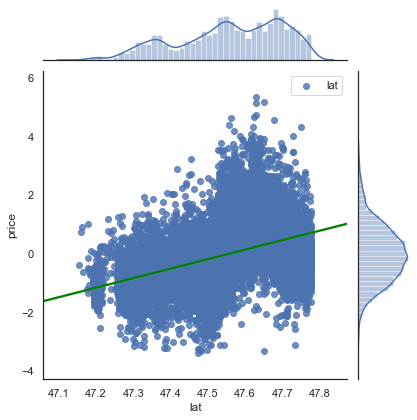

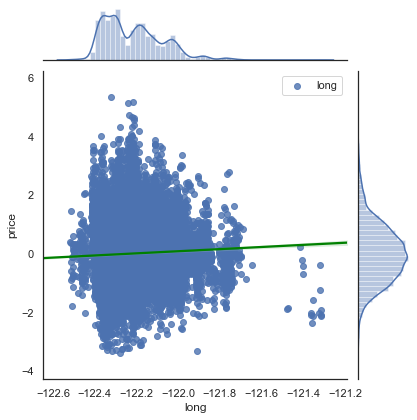

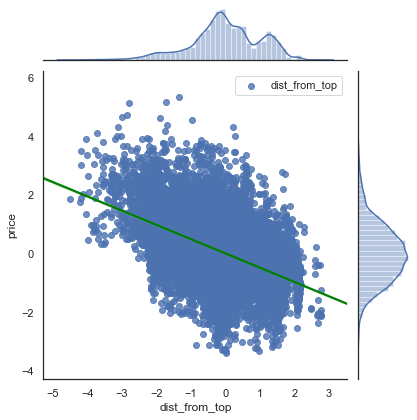

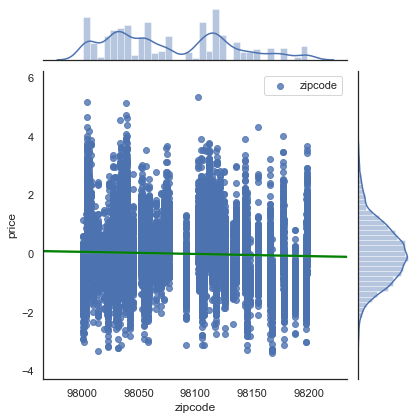

In [58]:
for col in ['bedrooms','bathrooms','sqft_lot','sqft_living15',
            'sqft_basement','sqft_above','floors','lat','long','dist_from_top','zipcode']:
    sns.jointplot(x = col, y = "price",
                  data = df, 
                  kind = 'reg', 
                  label = col,
                  joint_kws = {'line_kws':{'color':'green'}})
    plt.legend()
    plt.show()

The variables longitude, floors, zipcode, and sqft_lot show a slight linear relationship to price thus there is potential for these variables to be dropped in the final model. 

# 4. Modeling 

The thought process behind the trials in this modeling process is to maintain the linearity assumptions. The linearity assumptions are: 
* Linearity: there is a linear relationship between the target and predictors
    * This is done before via the Joint plots thus it is not as much of a concern when evaluating the model
* Normality: the model residuals should follow a normal distribution
    * This will be evaluated via ensuring the model's residuals  within the Q-Q plots follow a linear pattern 
    * It will also be evaluated by working to minimize Jarque-Bera as this is a goodness-of-fit test of whether sample data have the skewness and kurtosis matching a normal distribution
* Homoscedasticity: the target variable is equal across the range of values of the predictor variables
    * Evaluated via residuals vs predictor plot and ensuring the residuals are equal across the regression line
    
Thus every trial is done in an attempt to meet these assumptions while still maximizing the R-squared value in order to be able to predict as much of the variance as possible. To start the modeling process, let's drop the columns id and date as they present no value to the model. 

In [59]:
df.drop(['id','date'],axis = 1,inplace = True)

## Trial 1: Initial Model

* Categorical predictors: view (binned), waterfront, grade (binned), condition (binned), yr_built (binned), Renovated?, prime_zipcode
* Quantitative predictors: bedrooms, bathrooms, floors, sqft_lot, sqft_above, lat, long, sqft_living15, dist_from_top, zipcode, sqft_basement
* Notes: initial model

### Trial Data Exploration and Cleaning

In [60]:
df.head()
df.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_lot', 'floors', 'sqft_above',
       'sqft_basement', 'zipcode', 'lat', 'long', 'sqft_living15',
       'dist_from_top', 'condition_(2, 5]', 'view_(0, 3]', 'view_(3, 4]',
       'waterfront_1.0', 'yr_built_(1899, 1928]', 'yr_built_(1928, 1933]',
       'yr_built_(1933, 1972]', 'yr_built_(1972, 1982]',
       'yr_built_(1982, 1990]', 'yr_built_(1990, 2000]',
       'yr_built_(2000, 2007]', 'yr_built_(2007, 2009]',
       'yr_built_(2009, 2020]', 'grade_(6, 9]', 'grade_(9, 13]',
       'Renovated?_True', 'prime_zipcode_True'],
      dtype='object')

In [61]:
testing = df.copy()
x = testing.drop(['price','yr_built_(1899, 1928]'],axis = 1)
y = testing.price
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 3)

In [62]:
x_train.shape

(17277, 27)

### Trial Results and Analysis

In [63]:
predictors_int = sm.add_constant(x_train)
model = sm.OLS(y_train,predictors_int).fit()
model.summary()

/Users/kiarashahmadi/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.807
Model:                            OLS   Adj. R-squared:                  0.807
Method:                 Least Squares   F-statistic:                     2679.
Date:                Thu, 30 Jul 2020   Prob (F-statistic):               0.00
Time:                        21:07:12   Log-Likelihood:                -10311.
No. Observations:               17277   AIC:                         2.068e+04
Df Residuals:                   17249   BIC:                         2.089e+04
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                   -42.6829      7.310     -5.839      0.000     -57.011     -28.355
bedrooms                 -0.0556      0.005    -12.196      0.000      -0.065      -0.047
bathrooms                 0.0786      0.006     12.812      0.000       0.067       0.091
sqft_lot                  0.0871      0.005     17.558      0.000       0.077       0.097
floors                    0.0098      0.006      1.717      0.086      -0.001       0.021
sqft_above                0.3779      0.008     47.767      0.000       0.362       0.393
sqft_basement             0.1551      0.005     33.056      0.000       0.146       0.164
zipcode                  -0.0006   8.26e-05     -7.165      0.000      -0.001      -0.000
lat                       2.0441      0.030     68.069      0.000       1.985       2.103
long                     -0.0249      0.033     -0.743      0.458      -0.091       0.041
sqft_living15             0.1225      0.006     22.242      0.000       0.112       0.133
dist_from_top            -0.2555      0.005    -50.247      0.000      -0.266      -0.246
condition_(2, 5]          0.4274      0.035     12.159      0.000       0.359       0.496
view_(0, 3]               0.3457      0.013     26.543      0.000       0.320       0.371
view_(3, 4]               0.7345      0.034     21.469      0.000       0.667       0.802
waterfront_1.0            0.6607      0.050     13.324      0.000       0.564       0.758
yr_built_(1928, 1933]    -0.0666      0.028     -2.357      0.018      -0.122      -0.011
yr_built_(1933, 1972]    -0.3445      0.012    -28.345      0.000      -0.368      -0.321
yr_built_(1972, 1982]    -0.4351      0.016    -27.686      0.000      -0.466      -0.404
yr_built_(1982, 1990]    -0.3898      0.017    -22.734      0.000      -0.423      -0.356
yr_built_(1990, 2000]    -0.3329      0.018    -18.858      0.000      -0.367      -0.298
yr_built_(2000, 2007]    -0.2928      0.017    -16.997      0.000      -0.327      -0.259
yr_built_(2007, 2009]    -0.2576      0.025    -10.436      0.000      -0.306      -0.209
yr_built_(2009, 2020]    -0.1340      0.020     -6.685      0.000      -0.173      -0.095
grade_(6, 9]              0.2444      0.013     18.968      0.000       0.219       0.270
grade_(9, 13]             0.6370      0.021     30.021      0.000       0.595       0.679
Renovated?_True           0.1125      0.019      5.918      0.000       0.075       0.150
prime_zipcode_True        0.4304      0.020     21.276      0.000       0.391       0.470
==============================================================================
Omnibus:                      419.674   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              881.421
Skew:                          -0.131   Prob(JB):       

In [64]:
predictors_test = sm.add_constant(x_test)
y_hat_train = model.predict(predictors_int)
y_hat_test = model.predict(predictors_test)

In [65]:
train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squarred Error:', train_mse)
print('Test Mean Squarred Error:', test_mse)

Train Mean Squarred Error: 0.1931454652956973
Test Mean Squarred Error: 0.20180702460777195


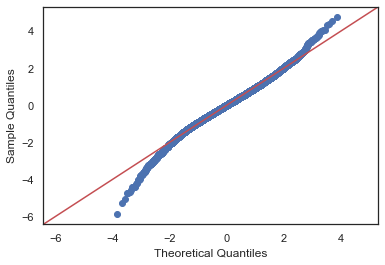

In [66]:
residuals=model.resid
fig=sm.graphics.qqplot(residuals,dist=stats.norm, line ='45', fit = True)

<Figure size 1080x576 with 0 Axes>

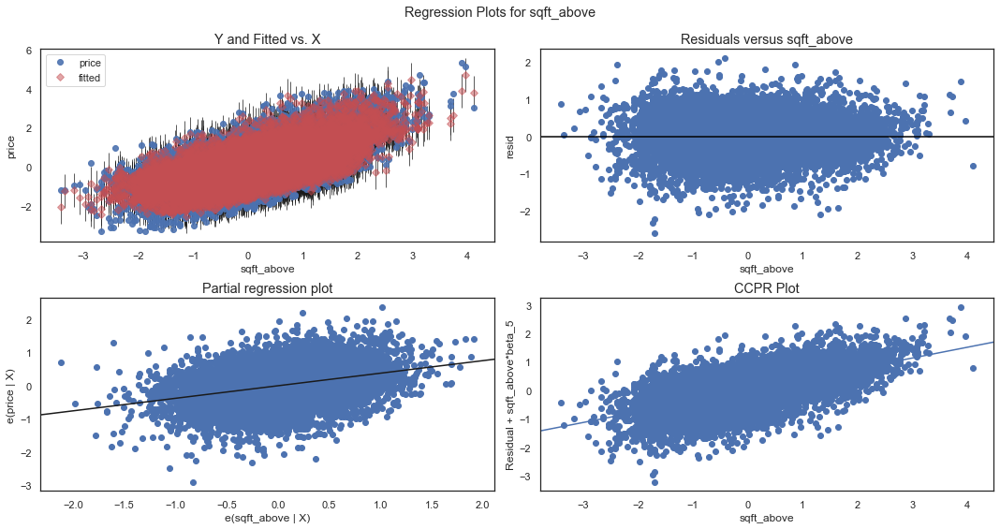

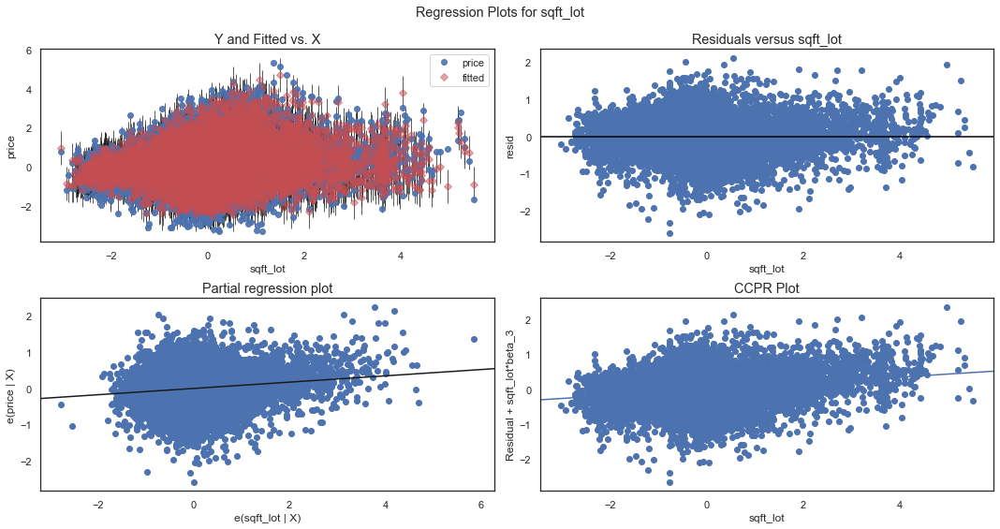

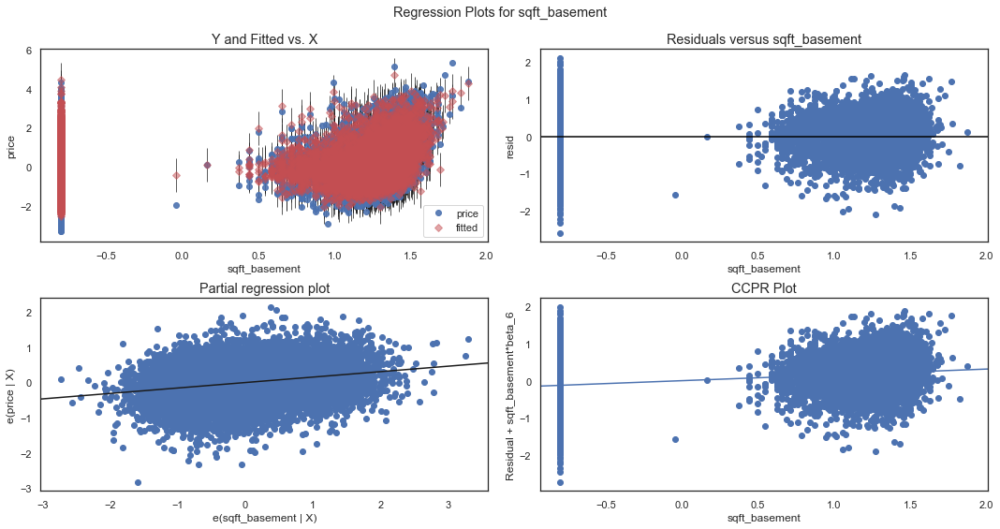

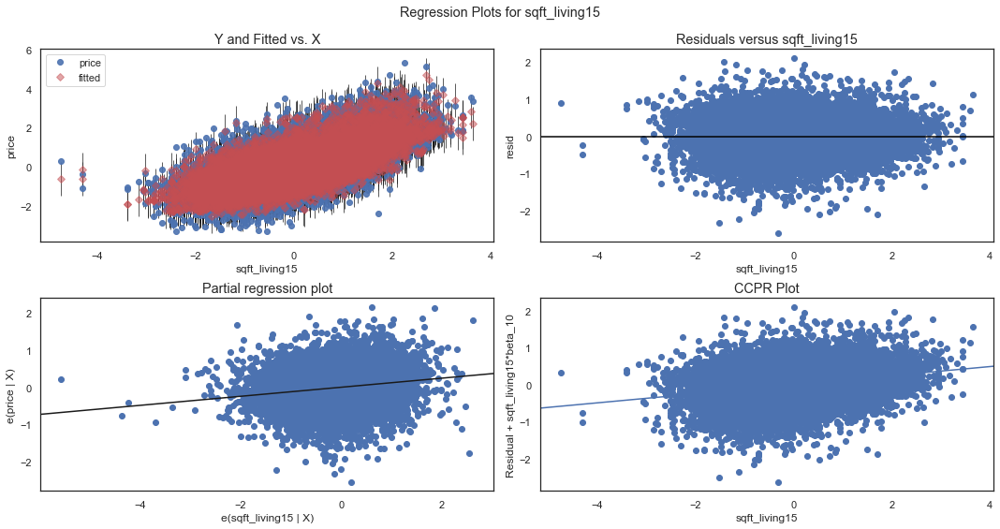

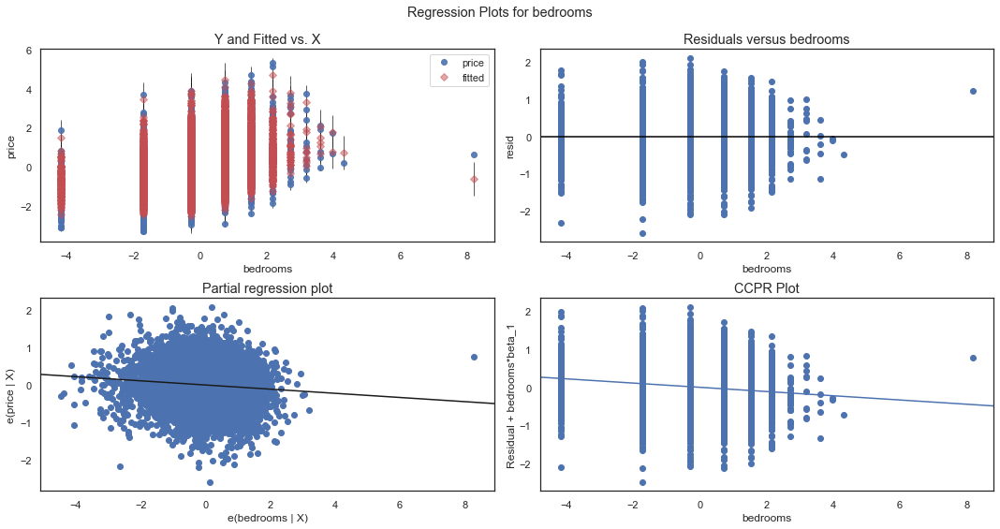

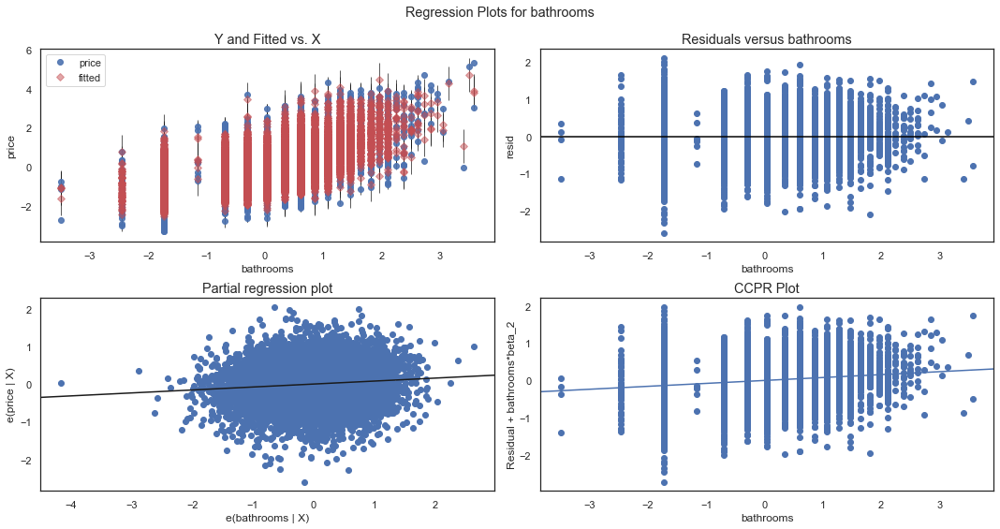

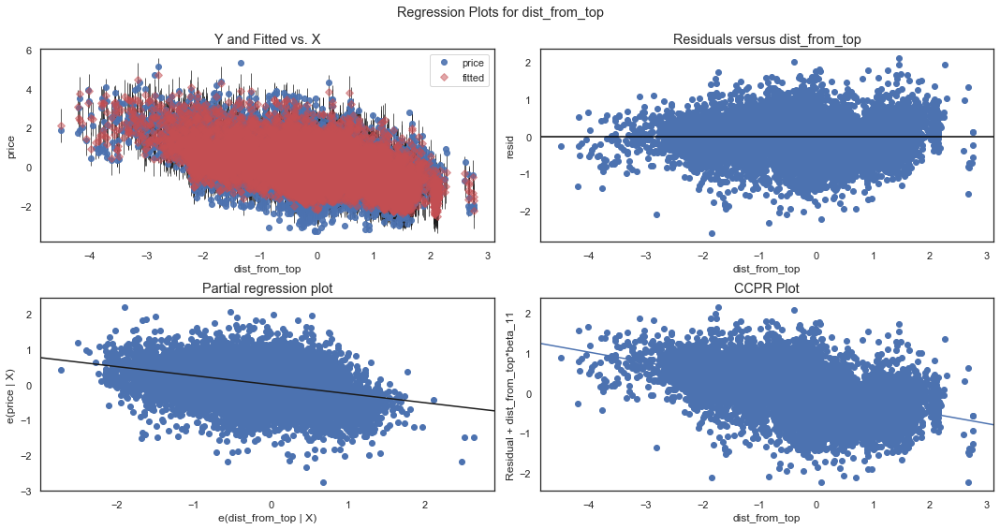

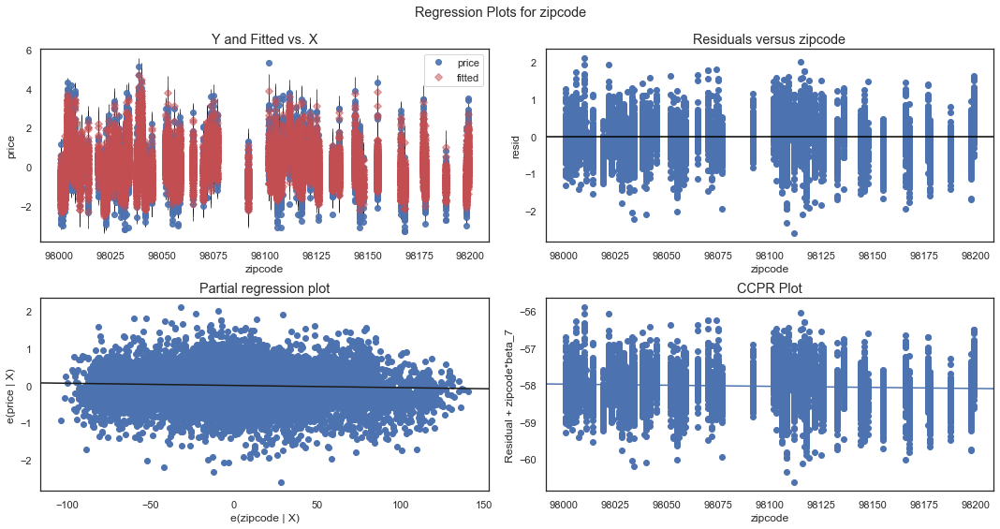

In [67]:
fig = plt.figure(figsize=(15,8))
for col in ['sqft_above','sqft_lot','sqft_basement','sqft_living15',
            'bedrooms','bathrooms','dist_from_top','zipcode']:
    fig = plt.figure(figsize=(15,8))
    fig = sm.graphics.plot_regress_exog(model, col, fig = fig)
    plt.show()

In [68]:
name = ['Jarque-Bera','Prob','Skew', 'Kurtosis']
test = sms.jarque_bera(model.resid)
list(zip(name, test))

[('Jarque-Bera', 881.4209380320075),
 ('Prob', 3.998298273019685e-192),
 ('Skew', -0.13138262301251952),
 ('Kurtosis', 4.074878013374842)]

### Trial 1 Discussion
The R squared value is good but the Jarque-Bera value is too high and this along with the residuals plot indicates that normality is still an issue. In addition, the kurtosis and skew values are too high, and it looks like the predictors floors and long need to be dropped due to the high p-values. Let's try to attack this by eliminating outliers.

In [69]:
df.drop(['floors','long'],axis = 1,inplace = True)

## Trial 2: Eliminating Outliers

* Categorical predictors: view (binned), waterfront, grade (binned), condition (binned), yr_built (binned), Renovated?, prime_zipcode
* Quantitative predictors: bedrooms, bathrooms, sqft_lot, sqft_above, lat, sqft_living15, dist_from_top, zipcode, sqft_basement
* Notes: Eliminated outliers 


The process of eliminating outliers for the continuous variables consisted of simple eliminating any data point that had a Z score of over 3. This is done first by calculating the Z score as seen below.

### Trial Data Exploration and Cleaning

In [70]:
#Create a Z-score matrix from df2 DataFrame
df2['zsqft_above'] = (df2.sqft_above - df2.sqft_above.mean()) / df2.sqft_above.std()
df2['zsqft_living15'] = (df2.sqft_living15 - df2.sqft_living15.mean()) / df2.sqft_living15.std()
df2['zsqft_lot'] = (df2.sqft_lot - df2.sqft_lot.mean()) / df2.sqft_lot.std()
df2['zprice'] = (df2.price - df2.price.mean()) / df2.price.std()
df2['zbathrooms'] = (df2.bathrooms - df2.bathrooms.mean()) / df2.bathrooms.std()
df2['zbedrooms'] = (df2.bedrooms - df2.bedrooms.mean()) / df2.bedrooms.std()
df2['zdist_from_top'] = (df2.dist_from_top - df2.dist_from_top.mean()) / df2.dist_from_top.std()
df2['zbasement'] = (df2.sqft_basement - df2.sqft_basement.mean()) / df2.sqft_basement.mean()

From there we eliminate any row that has a Z score of over 3 for the continous variables

In [71]:
# Locate Z scores of over 3 in testing2 DataFrame which is a copy of the cleaned DataFrame df
testing2 = df.copy()
testing2 = testing2.loc[abs(df2["zsqft_above"]) < 3]
testing2 = testing2.loc[abs(df2["zsqft_living15"]) < 3]
testing2 = testing2.loc[abs(df2["zsqft_lot"]) < 3]
testing2 = testing2.loc[abs(df2["zprice"]) < 3]
testing2 = testing2.loc[abs(df2["zbathrooms"]) < 3]
testing2 = testing2.loc[abs(df2["zbedrooms"]) < 3]
testing2 = testing2.loc[abs(df2["zdist_from_top"]) < 3]
testing2 = testing2.loc[abs(df2["zbasement"]) < 3]

print(testing2.shape)

(19412, 27)


We now have the same DataFrame as trial 1 without the outliers and are ready to create a model.

In [72]:
x = testing2.drop(['price'],axis = 1)
y = testing2.price

In [73]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 3)

### Trial Results and Analysis

In [74]:
predictors_int = sm.add_constant(x_train)
model = sm.OLS(y_train,predictors_int).fit()
model.summary()

/Users/kiarashahmadi/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.764
Model:                            OLS   Adj. R-squared:                  0.764
Method:                 Least Squares   F-statistic:                     2009.
Date:                Thu, 30 Jul 2020   Prob (F-statistic):               0.00
Time:                        21:07:24   Log-Likelihood:                -8954.5
No. Observations:               15529   AIC:                         1.796e+04
Df Residuals:                   15503   BIC:                         1.816e+04
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                   -37.5904      6.744     -5.574      0.000     -50.810     -24.371
bedrooms                 -0.0533      0.005    -11.100      0.000      -0.063      -0.044
bathrooms                 0.0637      0.006      9.987      0.000       0.051       0.076
sqft_lot                  0.0509      0.006      8.619      0.000       0.039       0.063
sqft_above                0.3800      0.008     48.091      0.000       0.364       0.395
sqft_basement             0.1492      0.005     30.654      0.000       0.140       0.159
zipcode                  -0.0006   7.75e-05     -7.976      0.000      -0.001      -0.000
lat                       2.1377      0.031     69.339      0.000       2.077       2.198
sqft_living15             0.1309      0.006     22.274      0.000       0.119       0.142
dist_from_top            -0.2567      0.005    -48.219      0.000      -0.267      -0.246
condition_(2, 5]          0.4149      0.036     11.565      0.000       0.345       0.485
view_(0, 3]               0.3320      0.015     22.610      0.000       0.303       0.361
view_(3, 4]               0.6508      0.045     14.374      0.000       0.562       0.739
waterfront_1.0            0.7336      0.069     10.577      0.000       0.598       0.869
yr_built_(1899, 1928]    -3.9408      0.751     -5.250      0.000      -5.412      -2.469
yr_built_(1928, 1933]    -4.0028      0.752     -5.326      0.000      -5.476      -2.530
yr_built_(1933, 1972]    -4.2674      0.750     -5.689      0.000      -5.738      -2.797
yr_built_(1972, 1982]    -4.3474      0.748     -5.811      0.000      -5.814      -2.881
yr_built_(1982, 1990]    -4.2721      0.748     -5.708      0.000      -5.739      -2.805
yr_built_(1990, 2000]    -4.2559      0.749     -5.682      0.000      -5.724      -2.788
yr_built_(2000, 2007]    -4.2402      0.749     -5.661      0.000      -5.708      -2.772
yr_built_(2007, 2009]    -4.2036      0.749     -5.610      0.000      -5.672      -2.735
yr_built_(2009, 2020]    -4.0601      0.749     -5.419      0.000      -5.529      -2.591
grade_(6, 9]              0.2384      0.013     18.434      0.000       0.213       0.264
grade_(9, 13]             0.5872      0.023     25.480      0.000       0.542       0.632
Renovated?_True           0.1088      0.021      5.190      0.000       0.068       0.150
prime_zipcode_True        0.3790      0.023     16.610      0.000       0.334       0.424
==============================================================================
Omnibus:                      401.280   Durbin-Watson:                   2.024
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              804.201
Skew:                          -0.170   Prob(JB):                    2.34e-175
Kurtosis:                       4.062   Cond. No.                  

In [75]:
predictors_test = sm.add_constant(x_test)
y_hat_train = model.predict(predictors_int)
y_hat_test = model.predict(predictors_test)

In [76]:
train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squarred Error:', train_mse)
print('Test Mean Squarred Error:', test_mse)

Train Mean Squarred Error: 0.18551640638041975
Test Mean Squarred Error: 0.1911307538790658


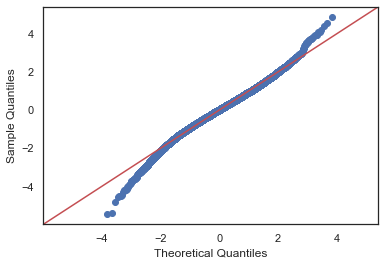

In [77]:
residuals = model.resid
fig = sm.graphics.qqplot(residuals,dist=stats.norm, line ='45', fit = True)

<Figure size 1080x576 with 0 Axes>

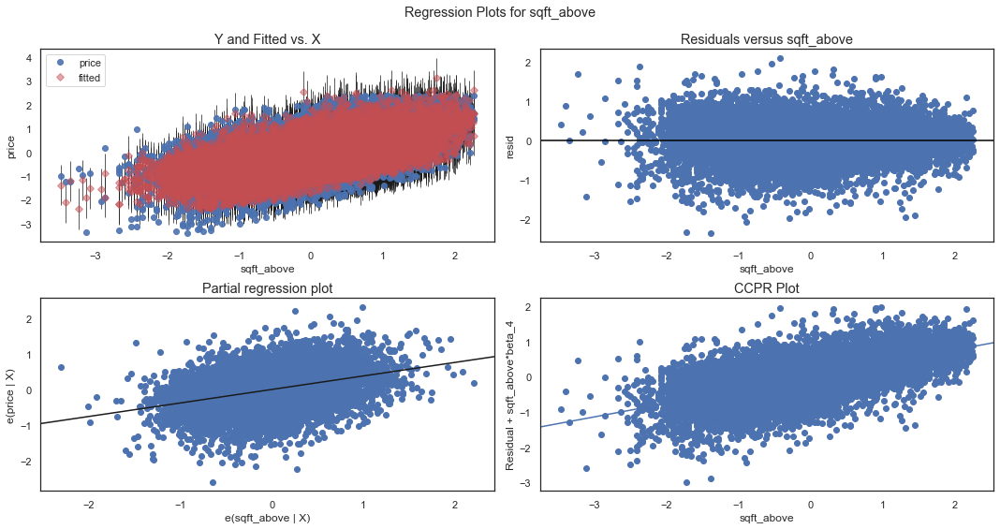

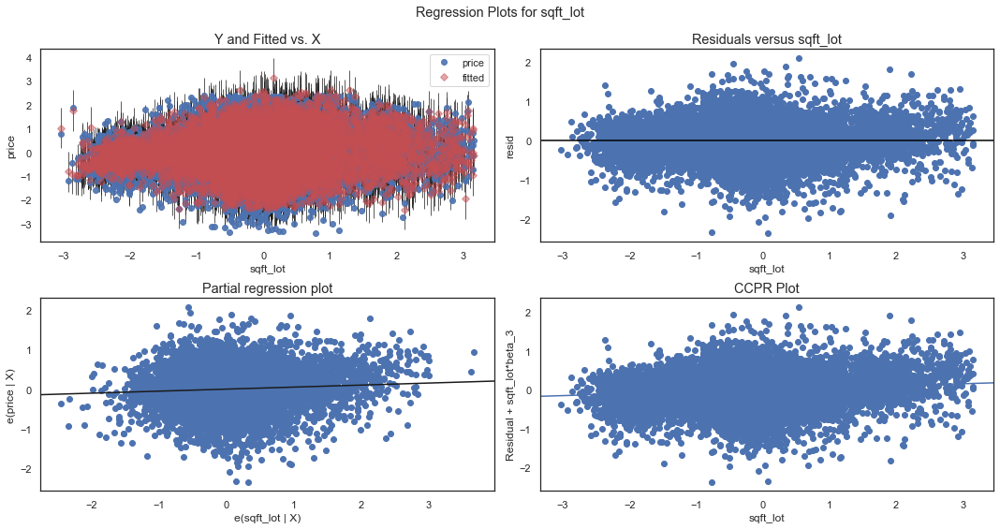

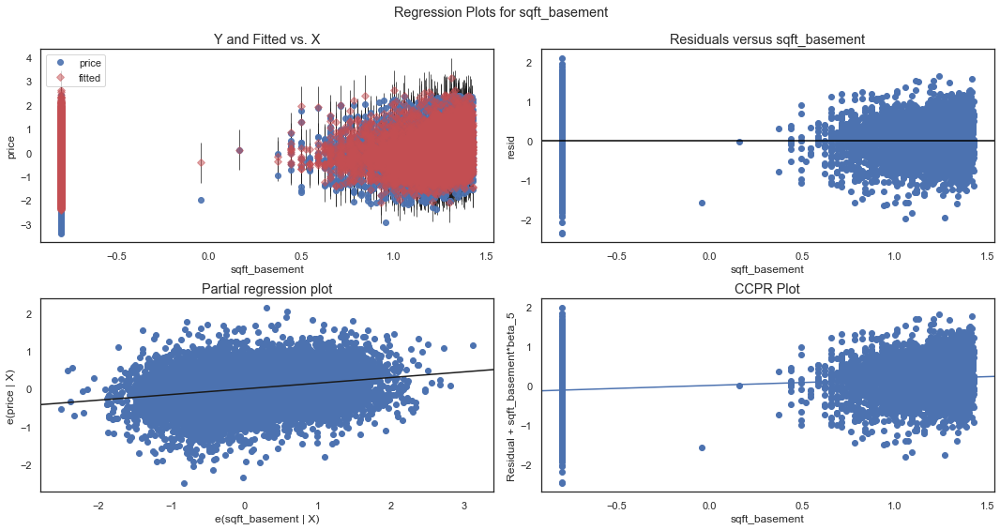

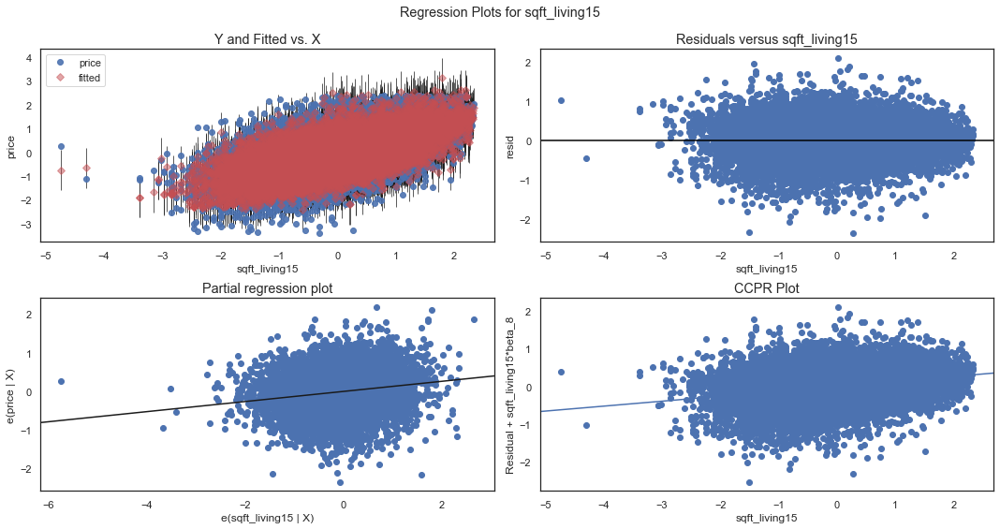

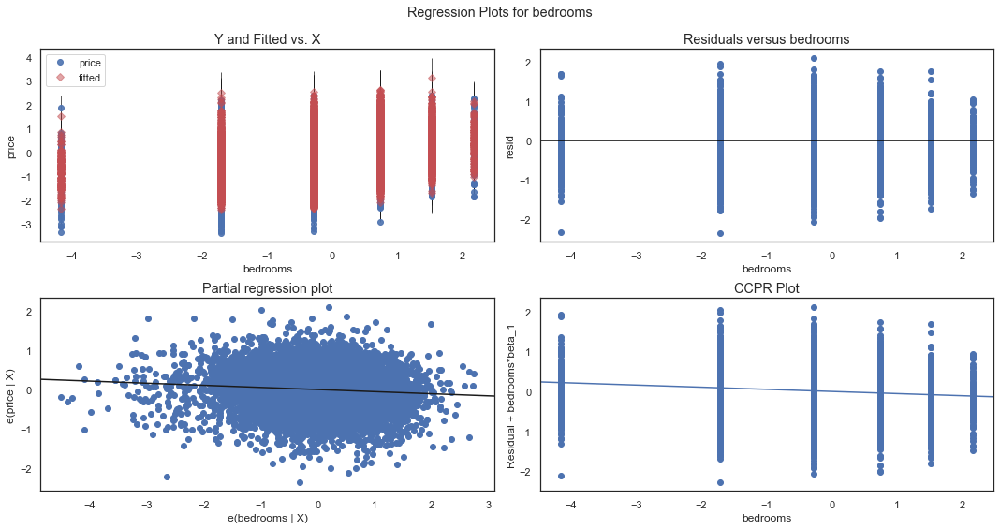

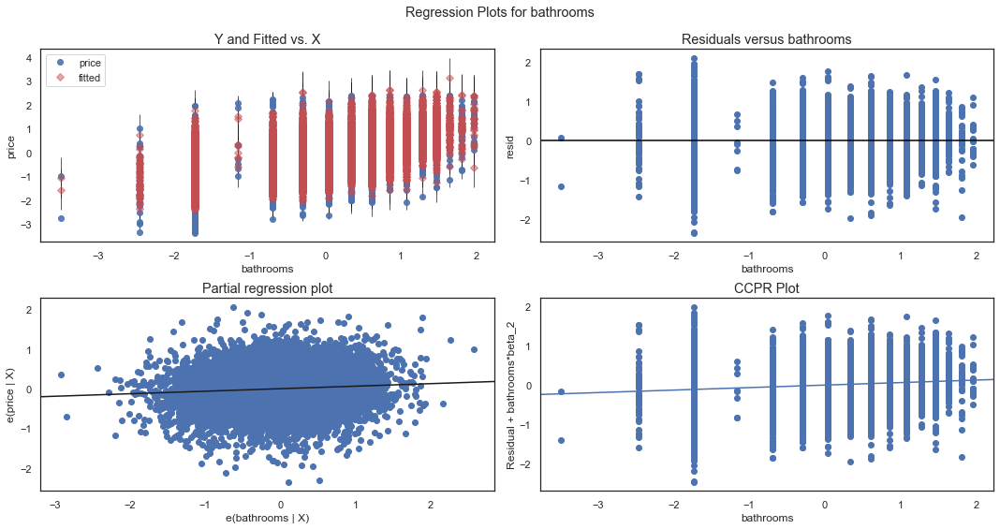

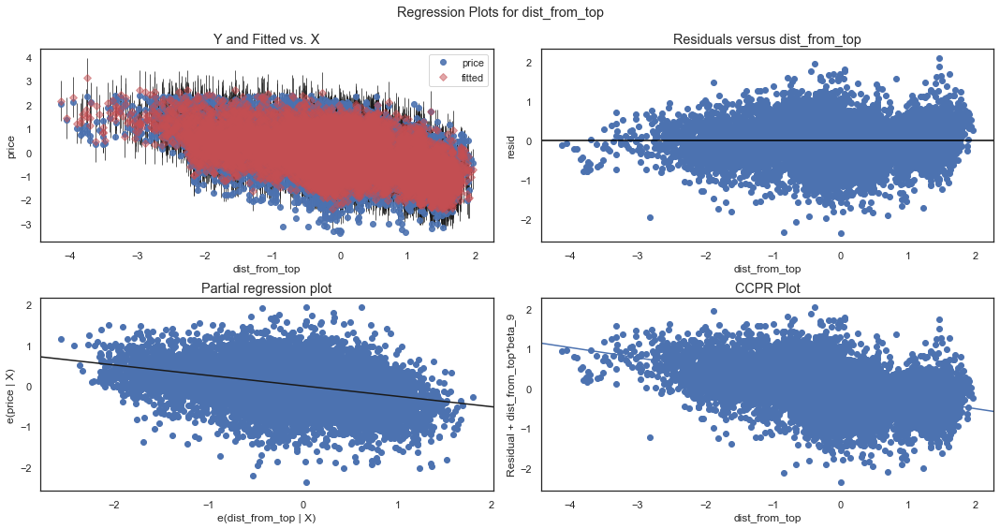

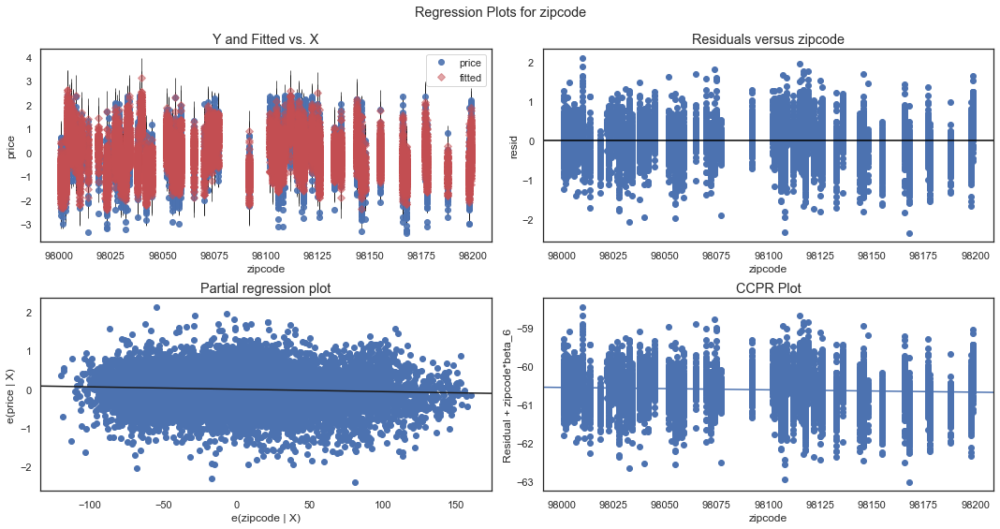

In [78]:
fig = plt.figure(figsize = (15,8))
for col in ['sqft_above','sqft_lot','sqft_basement','sqft_living15',
            'bedrooms','bathrooms','dist_from_top','zipcode']:
    fig = plt.figure(figsize = (15,8))
    fig = sm.graphics.plot_regress_exog(model, col, fig=fig)
    plt.show()

In [79]:
name = ['Jarque-Bera','Prob','Skew', 'Kurtosis']
test = sms.jarque_bera(model.resid)
list(zip(name, test))

[('Jarque-Bera', 804.201113266479),
 ('Prob', 2.343943203232863e-175),
 ('Skew', -0.16991585473079504),
 ('Kurtosis', 4.061792649530839)]

### Trial 2 Discussion:
Overall eliminating the outliers produced worse results. Thus we will keep the outliers in the model. The next step is to see if we can reduce the number of predictors in the model. The first method of choice is eliminating or changing the methodology behind the predictor yr_built. 

## Trial 3: Introduction of Age variable

* Categorical predictors: view (binned), waterfront, grade (binned), condition (binned), Renovated?, prime_zipcode
* Quantitative predictors: bedrooms, bathrooms, sqft_lot, sqft_above, lat, sqft_living15, dist_from_top, zipcode, age,sqft_basement
* Notes: Added a new variable named age and dropped yr_built

The variable age is introduced where it will be the age of the house and we drop the categorical variables for yr_built.

### Trial Data Exploration and Cleaning

In [80]:
df['age'] = 2020-df3.yr_built
df.drop(new_age,axis = 1,inplace = True)
df.head()

,price,bedrooms,bathrooms,sqft_lot,sqft_above,sqft_basement,zipcode,lat,sqft_living15,dist_from_top,"condition_(2, 5]","view_(0, 3]","view_(3, 4]",waterfront_1.0,"grade_(6, 9]","grade_(9, 13]",Renovated?_True,prime_zipcode_True,age
0,-1.401998,-0.279718,-1.726509,-0.388430,-0.753565,-0.798211,98178,47.5112,-1.035429,-0.620617,1,0,0,0,1,0,0,0,65
1,0.279938,-0.279718,0.339653,-0.113241,0.672693,1.092003,98125,47.7210,-0.326781,-0.039721,1,0,0,0,1,0,1,0,69
2,-1.799430,-1.711611,-1.726509,0.244475,-1.752954,-0.798211,98028,47.7379,1.126504,0.034583,1,0,0,0,0,0,0,0,87
3,0.499698,0.736226,1.072635,-0.523914,-1.026835,1.350776,98136,47.5208,-0.990187,0.000914,1,0,0,0,1,0,0,0,55
4,0.178434,-0.279718,0.039555,0.008139,0.073515,-0.798211,98074,47.6168,-0.134218,0.003028,1,0,0,0,1,0,0,0,33


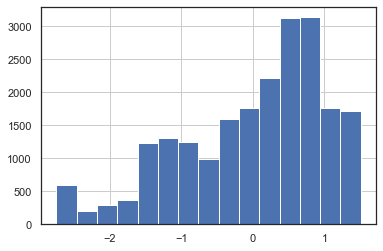

In [81]:
df.age = np.log(df.age)
df.age = (df.age - df.age.mean()) / df.age.std()
df.age.hist(bins = 15)

In [82]:
df.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_lot', 'sqft_above',
       'sqft_basement', 'zipcode', 'lat', 'sqft_living15', 'dist_from_top',
       'condition_(2, 5]', 'view_(0, 3]', 'view_(3, 4]', 'waterfront_1.0',
       'grade_(6, 9]', 'grade_(9, 13]', 'Renovated?_True',
       'prime_zipcode_True', 'age'],
      dtype='object')

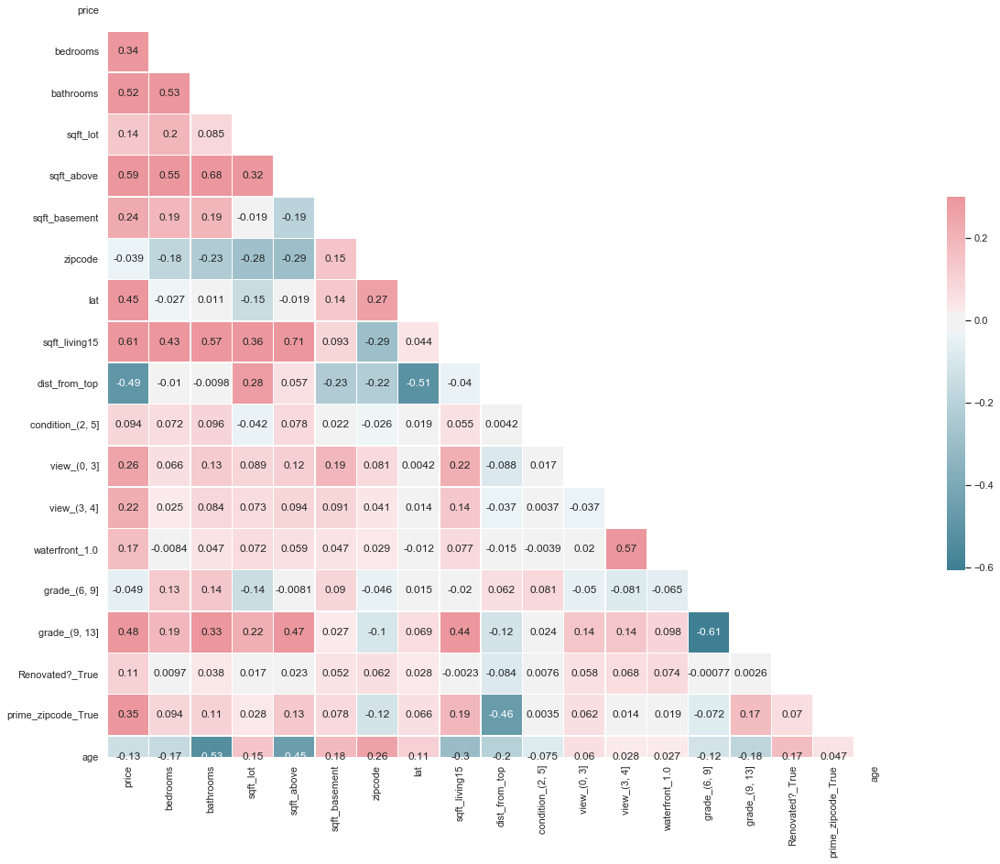

In [83]:
sns.set(style = "white")

# Create a covariance matrix
corr = df.corr()

# Generate a mask the size of our covariance matrix
mask = np.zeros_like(corr, dtype = np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 15))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap = True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask = mask, cmap = cmap, vmax = .3, center = 0, annot = True,
            square = True, linewidths = .5, cbar_kws = {"shrink": .5})
plt.show()

In [84]:
(abs(df.corr()) > .75).sum()-1

price                 0
bedrooms              0
bathrooms             0
sqft_lot              0
sqft_above            0
sqft_basement         0
zipcode               0
lat                   0
sqft_living15         0
dist_from_top         0
condition_(2, 5]      0
view_(0, 3]           0
view_(3, 4]           0
waterfront_1.0        0
grade_(6, 9]          0
grade_(9, 13]         0
Renovated?_True       0
prime_zipcode_True    0
age                   0
dtype: int64

In [85]:
x = df.drop(['price'],axis = 1)
y = df.price

In [86]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 3)

In [87]:
x_train.head()

,bedrooms,bathrooms,sqft_lot,sqft_above,sqft_basement,zipcode,lat,sqft_living15,dist_from_top,"condition_(2, 5]","view_(0, 3]","view_(3, 4]",waterfront_1.0,"grade_(6, 9]","grade_(9, 13]",Renovated?_True,prime_zipcode_True,age
3902,0.736226,1.276575,1.724860,1.661176,0.990889,98034,47.7124,0.794765,-0.331297,1,1,0,0,0,1,0,0,-0.391899
17608,-0.279718,-0.693428,-0.459320,-0.875740,1.416190,98117,47.6927,-0.237744,0.069697,1,0,0,0,1,0,0,0,0.687861
1009,0.736226,-0.300669,-0.418258,-1.026835,1.268142,98117,47.6802,-0.418492,-0.084950,1,0,0,0,1,0,0,0,1.181401
14026,0.736226,-0.300669,-0.299849,-0.455876,1.472700,98117,47.6965,0.640762,0.088802,1,0,0,0,1,0,0,0,0.602890
17575,0.736226,-1.726509,-0.368403,0.410393,-0.798211,98177,47.7188,0.436650,0.104659,1,0,0,0,1,0,0,0,0.843147


### Trial Results and Analysis

In [88]:
predictors_int = sm.add_constant(x_train)
model = sm.OLS(y_train,predictors_int).fit()
model.summary()

/Users/kiarashahmadi/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     3702.
Date:                Thu, 30 Jul 2020   Prob (F-statistic):               0.00
Time:                        21:07:38   Log-Likelihood:                -10882.
No. Observations:               17277   AIC:                         2.180e+04
Df Residuals:                   17258   BIC:                         2.195e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                -68.0758      7.343     -9.271      0.000     -82.469     -53.682
bedrooms              -0.0654      0.005    -14.163      0.000      -0.074      -0.056
bathrooms              0.0717      0.006     11.728      0.000       0.060       0.084
sqft_lot               0.0334      0.005      7.339      0.000       0.024       0.042
sqft_above             0.4278      0.008     56.432      0.000       0.413       0.443
sqft_basement          0.1572      0.005     33.589      0.000       0.148       0.166
zipcode               -0.0003   7.61e-05     -3.728      0.000      -0.000      -0.000
lat                    2.0032      0.031     65.386      0.000       1.943       2.063
sqft_living15          0.1234      0.006     22.019      0.000       0.112       0.134
dist_from_top         -0.2691      0.005    -52.200      0.000      -0.279      -0.259
condition_(2, 5]       0.3785      0.036     10.432      0.000       0.307       0.450
view_(0, 3]            0.3413      0.013     25.441      0.000       0.315       0.368
view_(3, 4]            0.6931      0.035     19.641      0.000       0.624       0.762
waterfront_1.0         0.6814      0.051     13.310      0.000       0.581       0.782
grade_(6, 9]           0.1888      0.013     14.350      0.000       0.163       0.215
grade_(9, 13]          0.5788      0.022     26.701      0.000       0.536       0.621
Renovated?_True        0.1664      0.019      8.534      0.000       0.128       0.205
prime_zipcode_True     0.4069      0.021     19.532      0.000       0.366       0.448
age                    0.0279      0.005      5.591      0.000       0.018       0.038
==============================================================================
Omnibus:                      264.172   Durbin-Watson:                   2.005
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              500.683
Skew:                          -0.055   Prob(JB):                    1.90e-109
Kurtosis:                       3.827   Cond. No.                     2.08e+08
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.08e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [89]:
predictors_test = sm.add_constant(x_test)
y_hat_train = model.predict(predictors_int)
y_hat_test = model.predict(predictors_test)

In [90]:
train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squarred Error:', train_mse)
print('Test Mean Squarred Error:', test_mse)

Train Mean Squarred Error: 0.20635189959140754
Test Mean Squarred Error: 0.21426979286129316


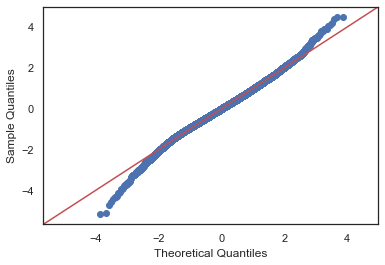

In [91]:
residuals=model.resid
fig=sm.graphics.qqplot(residuals,dist = stats.norm, line ='45', fit = True)

<Figure size 1080x576 with 0 Axes>

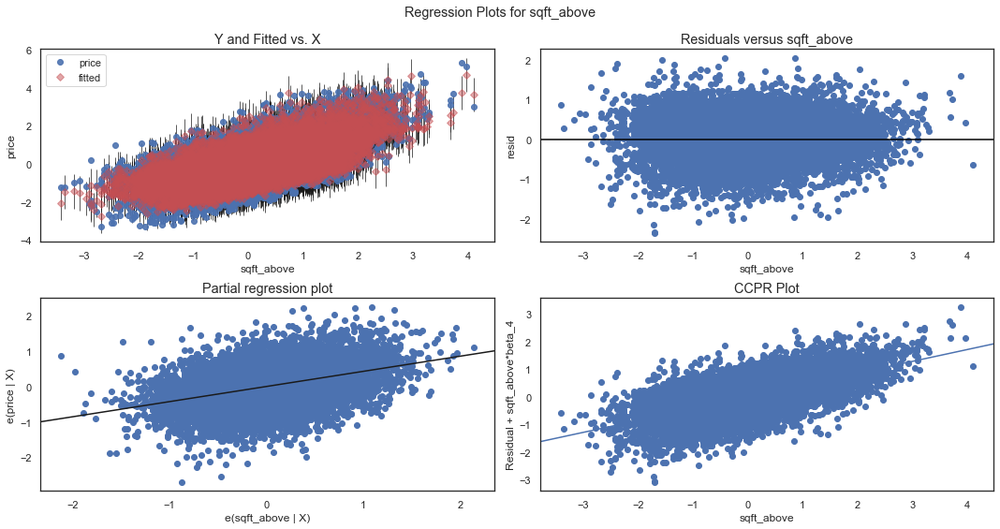

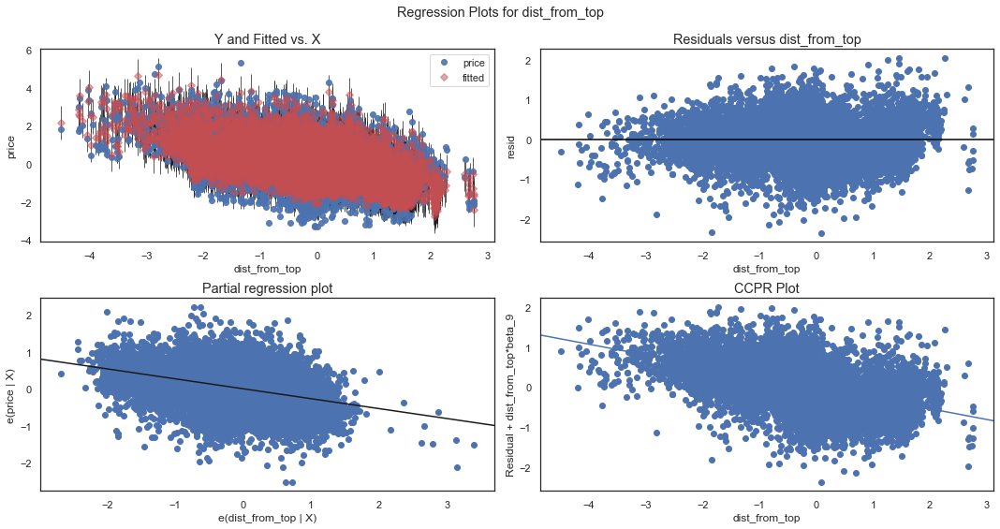

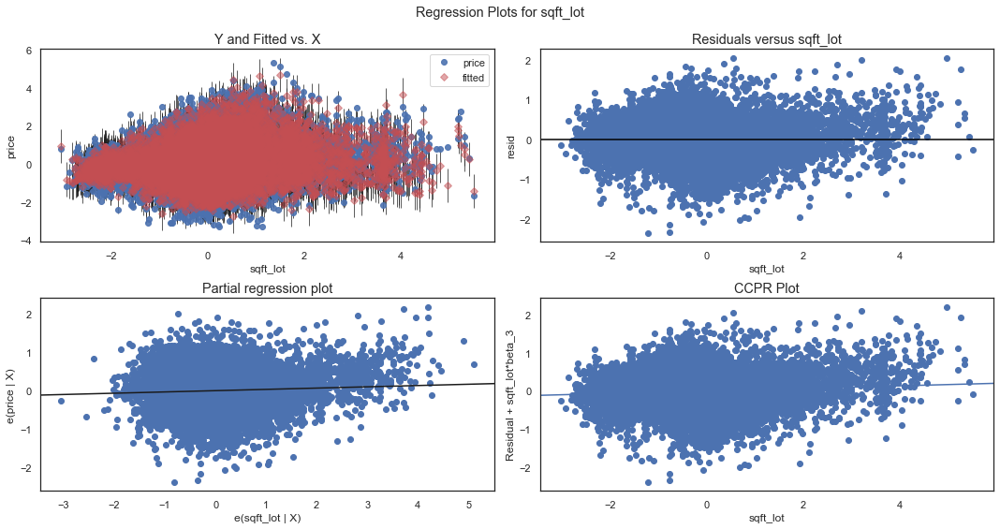

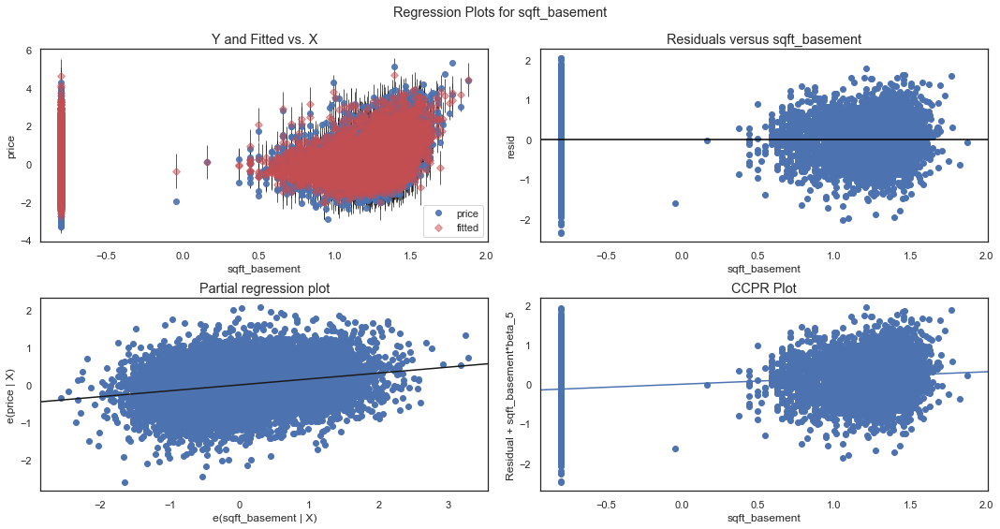

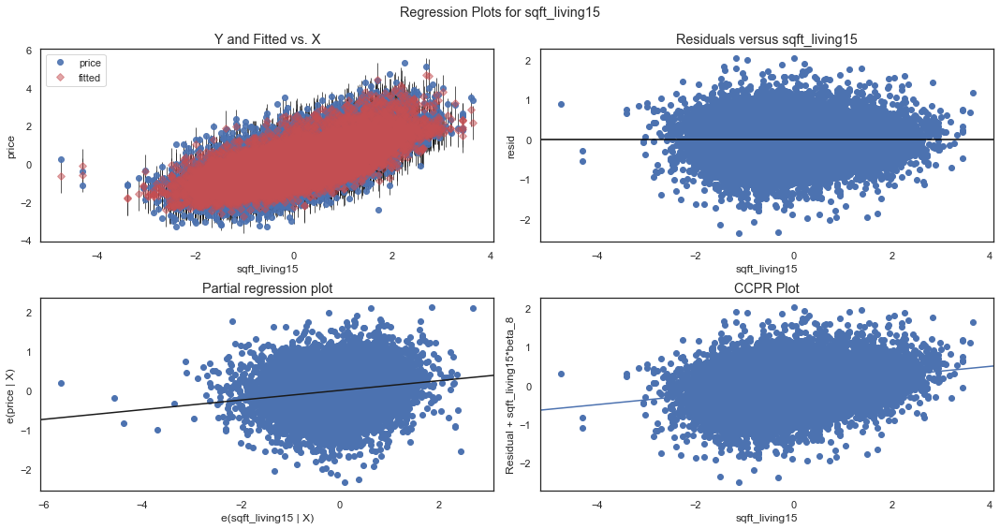

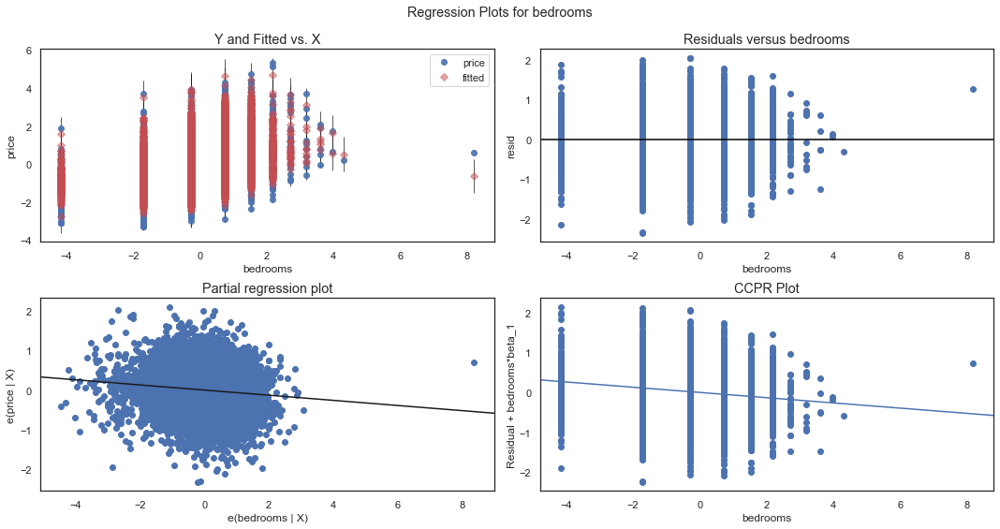

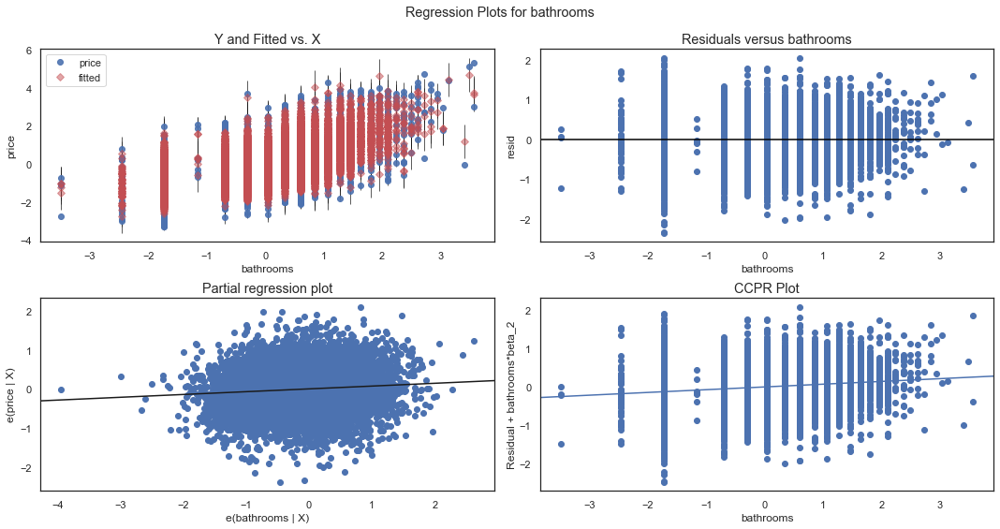

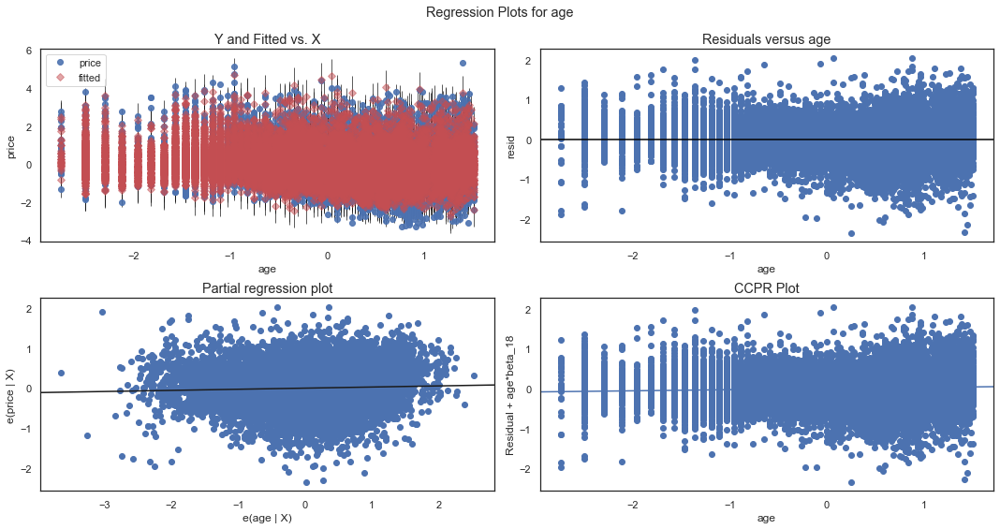

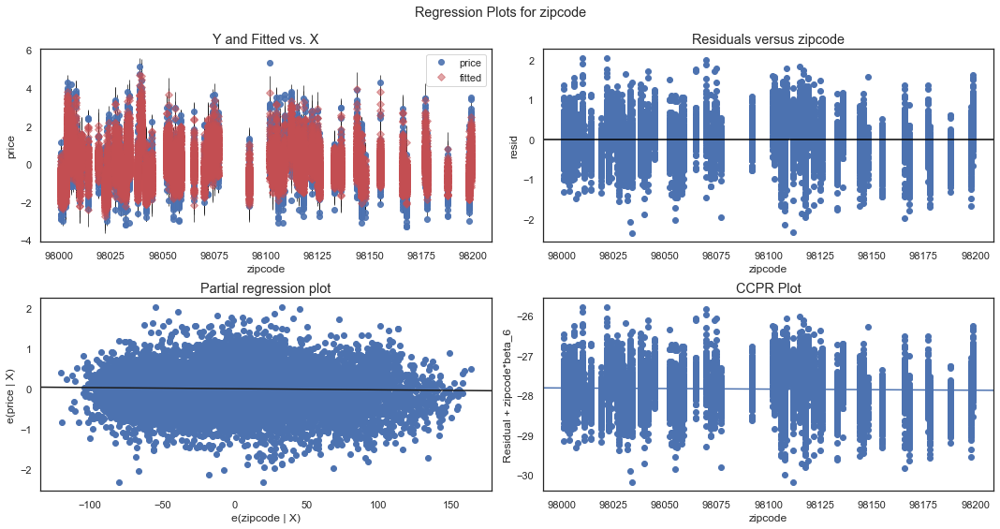

In [92]:
fig = plt.figure(figsize = (15,8))
for col in ['sqft_above','dist_from_top','sqft_lot','sqft_basement',
            'sqft_living15','bedrooms','bathrooms','age','zipcode']:
    fig = plt.figure(figsize=(15,8))
    fig = sm.graphics.plot_regress_exog(model, col, fig = fig)
    plt.show()

In [93]:
name = ['Jarque-Bera','Prob','Skew', 'Kurtosis']
test = sms.jarque_bera(model.resid)
list(zip(name, test))

[('Jarque-Bera', 500.68295569213075),
 ('Prob', 1.897044768462463e-109),
 ('Skew', -0.05452439698035841),
 ('Kurtosis', 3.8268144310945864)]

### Trial 3 Discussion:
Although the R squared value decreased, and the residual plots seem to improve when it comes to normality. This is also evident by the decrease in the Jarque-Bera value. In addition the skew and kurtosis have decreased. Thus elimination of the categorical variables and the new age variable to represent improves the model. The next point of focus is to drop the predictor zipcode as from the joint plots it showed minimal linearity with respect to price and the introduction of the variables prime_zipcode and dist_from_top can represent the relationship between zipcode and price making the use for the predictor zipcode obsolete. In addition, some further investigation into the sqft_basement variable will be performed. 

## Trial 4:  Drop Zipcode and Sqft_basement

* Categorical predictors: view (binned), waterfront, grade (binned), condition (binned), Renovated?, prime_zipcode
* Quantitative predictors: bedrooms, bathrooms, sqft_lot, sqft_above, lat, sqft_living15, dist_from_top, age
* Notes: Dropped zipcode and sqft_basement


### Trial Data Exploration and Cleaning

I've determined to drop the predictor zipcode as the new variables I've introduced replace its value. Thus let's evaluate the distribution of sqft_basement,its skewness and kurtosis, its linearity with respect to price, and its value counts.

Sqft_basement Parameters:
Kurtosis: -1.7131389249423263
Skewness: 0.48336920394024263


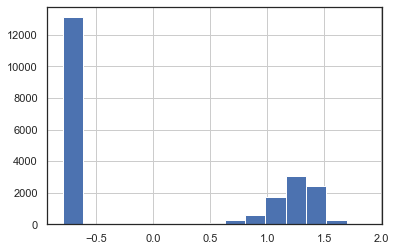

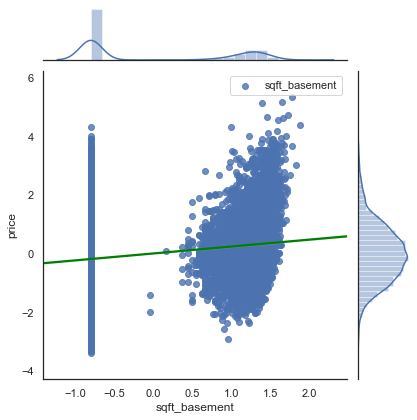

In [94]:
print('Sqft_basement Parameters:\nKurtosis: {}\nSkewness: {}'.format(df.sqft_basement.kurtosis(),df.sqft_basement.skew()))
df.sqft_basement.hist(bins=15)
sns.jointplot(x = 'sqft_basement', y = "price",
                  data = df, 
                  kind = 'reg', 
                  label = 'sqft_basement',
                  joint_kws = {'line_kws':{'color':'green'}})
plt.legend()
plt.show()

It looks like the rows that have sqft_basement as zero (-.79 because of log1p transformation) are heavily influencing the linearity with respect to price as well as the normality of the distribution. Thus, I can either choose to keep this predictor knowing it heavily affects the linearity assumptions or drop the column as a whole. 

(NOTE: I attempted to transform sqft_basement to a column called "Basement?" which was a boolean of whether there's a basement or not and it produced similar results thus I left it out.)

In [95]:
x = df.drop(['price','zipcode','sqft_basement'],axis = 1)
y = df.price
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state=3)

In [96]:
x.head()

,bedrooms,bathrooms,sqft_lot,sqft_above,lat,sqft_living15,dist_from_top,"condition_(2, 5]","view_(0, 3]","view_(3, 4]",waterfront_1.0,"grade_(6, 9]","grade_(9, 13]",Renovated?_True,prime_zipcode_True,age
0,-0.279718,-1.726509,-0.388430,-0.753565,47.5112,-1.035429,-0.620617,1,0,0,0,1,0,0,0,0.687861
1,-0.279718,0.339653,-0.113241,0.672693,47.7210,-0.326781,-0.039721,1,0,0,0,1,0,1,0,0.767756
2,-1.711611,-1.726509,0.244475,-1.752954,47.7379,1.126504,0.034583,1,0,0,0,0,0,0,0,1.077870
3,0.736226,1.072635,-0.523914,-1.026835,47.5208,-0.990187,0.000914,1,0,0,0,1,0,0,0,0.464369
4,-0.279718,0.039555,0.008139,0.073515,47.6168,-0.134218,0.003028,1,0,0,0,1,0,0,0,-0.219034


### Trial Results and Analysis

In [97]:
predictors_int = sm.add_constant(x_train)
model = sm.OLS(y_train,predictors_int).fit()
model.summary()

/Users/kiarashahmadi/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.781
Model:                            OLS   Adj. R-squared:                  0.781
Method:                 Least Squares   F-statistic:                     3844.
Date:                Thu, 30 Jul 2020   Prob (F-statistic):               0.00
Time:                        21:07:54   Log-Likelihood:                -11429.
No. Observations:               17277   AIC:                         2.289e+04
Df Residuals:                   17260   BIC:                         2.302e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                -96.5718      1.477    -65.384      0.000     -99.467     -93.677
bedrooms              -0.0249      0.005     -5.406      0.000      -0.034      -0.016
bathrooms              0.1530      0.006     26.398      0.000       0.142       0.164
sqft_lot               0.0450      0.005      9.810      0.000       0.036       0.054
sqft_above             0.2878      0.007     44.037      0.000       0.275       0.301
lat                    2.0156      0.031     64.859      0.000       1.955       2.076
sqft_living15          0.1640      0.006     29.223      0.000       0.153       0.175
dist_from_top         -0.2851      0.005    -53.914      0.000      -0.295      -0.275
condition_(2, 5]       0.3895      0.037     10.401      0.000       0.316       0.463
view_(0, 3]            0.4001      0.014     29.452      0.000       0.373       0.427
view_(3, 4]            0.7722      0.036     21.292      0.000       0.701       0.843
waterfront_1.0         0.6848      0.053     12.962      0.000       0.581       0.788
grade_(6, 9]           0.2480      0.013     18.441      0.000       0.222       0.274
grade_(9, 13]          0.6878      0.022     31.090      0.000       0.644       0.731
Renovated?_True        0.1643      0.020      8.166      0.000       0.125       0.204
prime_zipcode_True     0.4042      0.021     18.990      0.000       0.362       0.446
age                    0.0527      0.005     10.446      0.000       0.043       0.063
==============================================================================
Omnibus:                      260.165   Durbin-Watson:                   2.015
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              502.926
Skew:                          -0.016   Prob(JB):                    6.18e-110
Kurtosis:                       3.835   Cond. No.                     1.97e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.97e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [98]:
predictors_test = sm.add_constant(x_test)
y_hat_train = model.predict(predictors_int)
y_hat_test = model.predict(predictors_test)

train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squarred Error:', train_mse)
print('Test Mean Squarred Error:', test_mse)

Train Mean Squarred Error: 0.2198419900103187
Test Mean Squarred Error: 0.22665190464661003


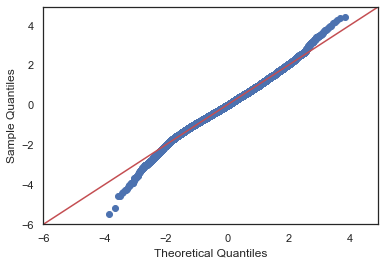

In [99]:
residuals = model.resid
fig = sm.graphics.qqplot(residuals,dist = stats.norm, line = '45', fit = True)

<Figure size 1080x576 with 0 Axes>

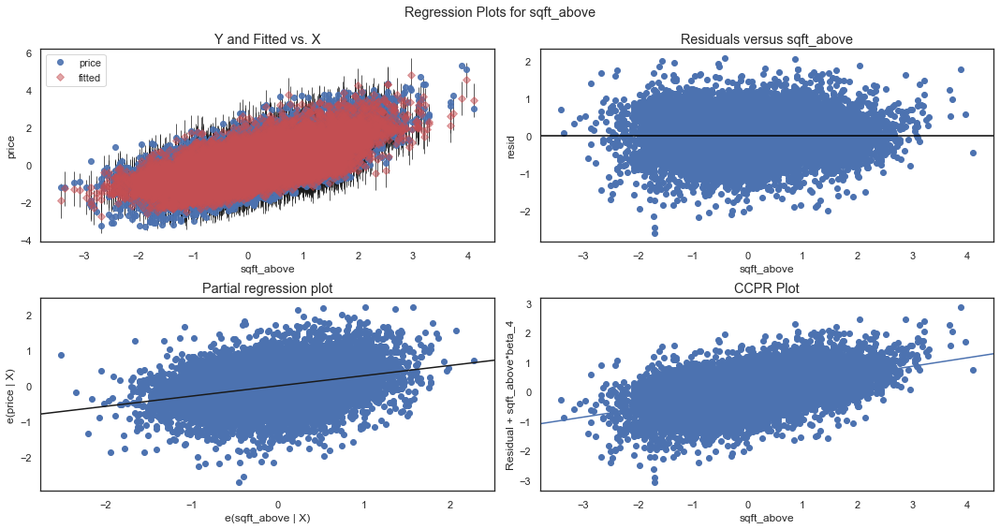

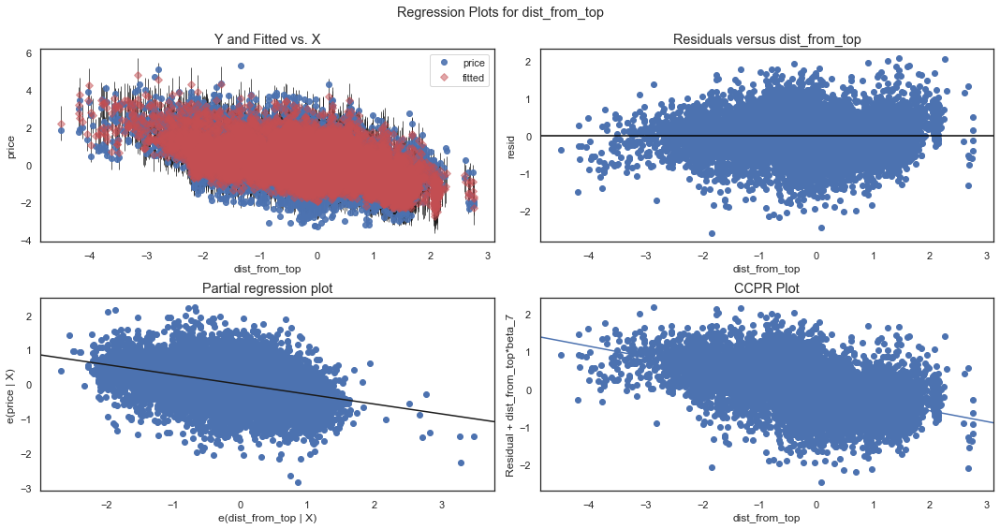

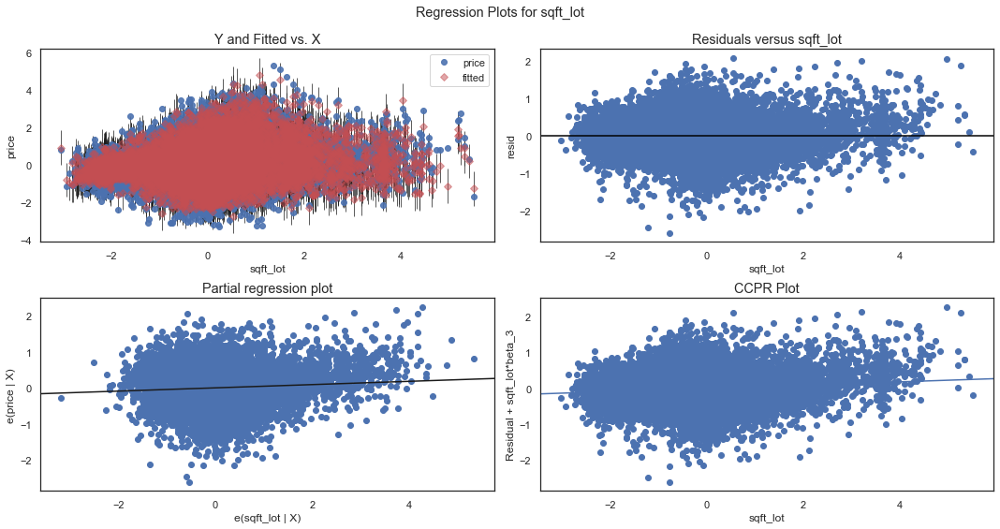

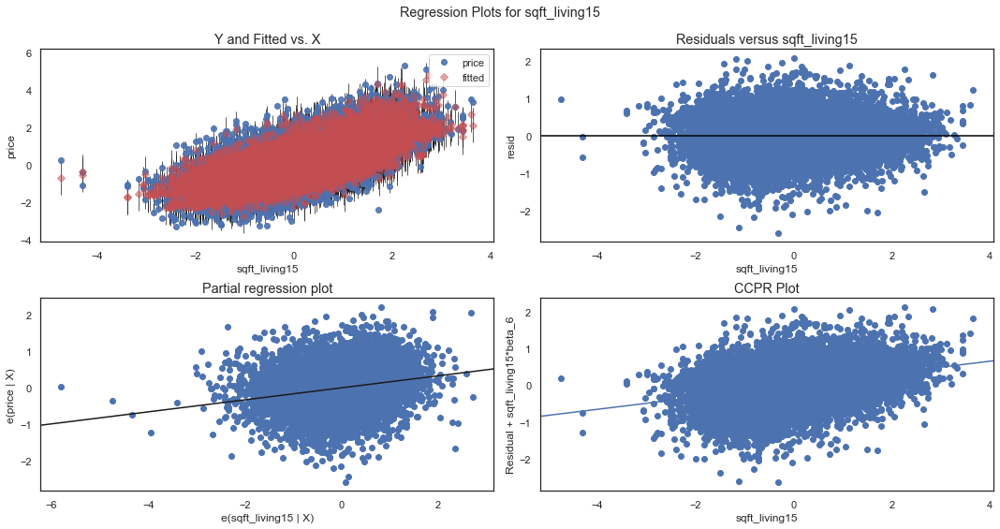

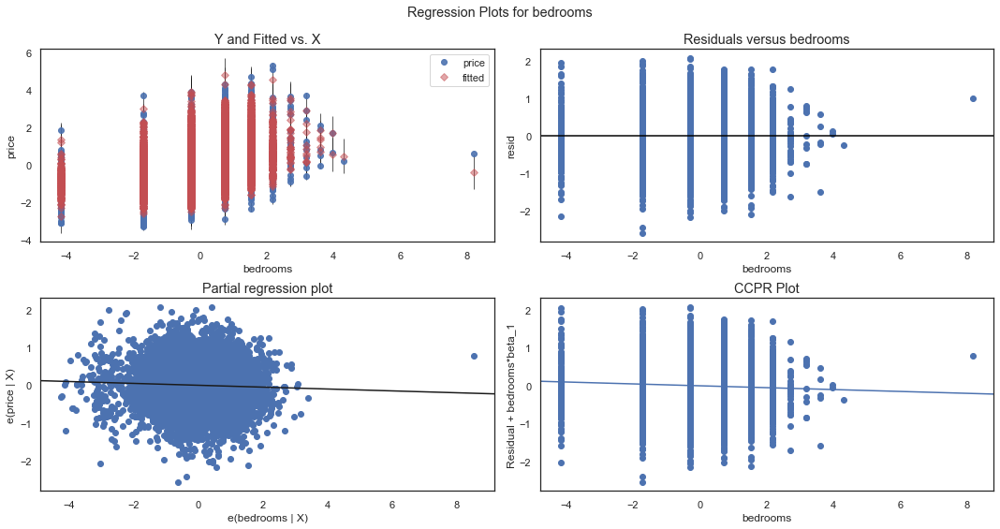

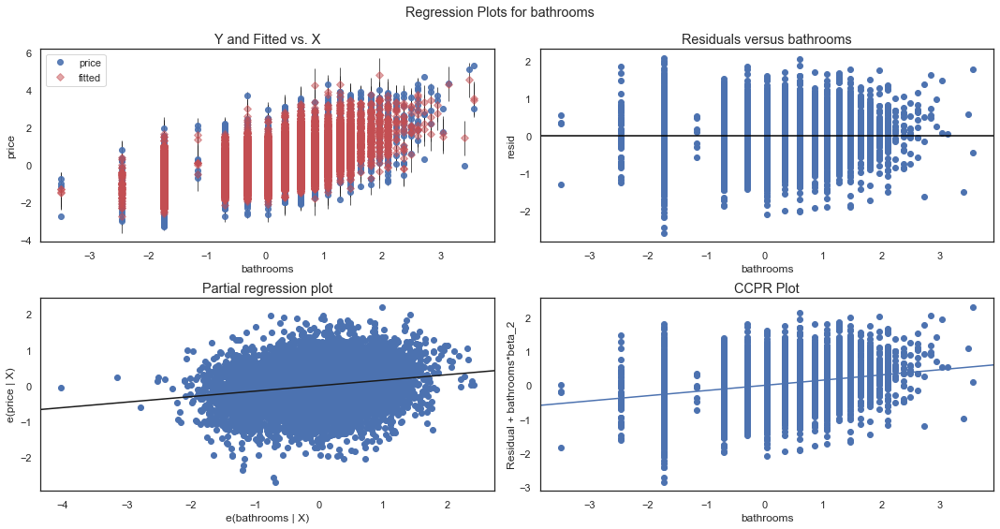

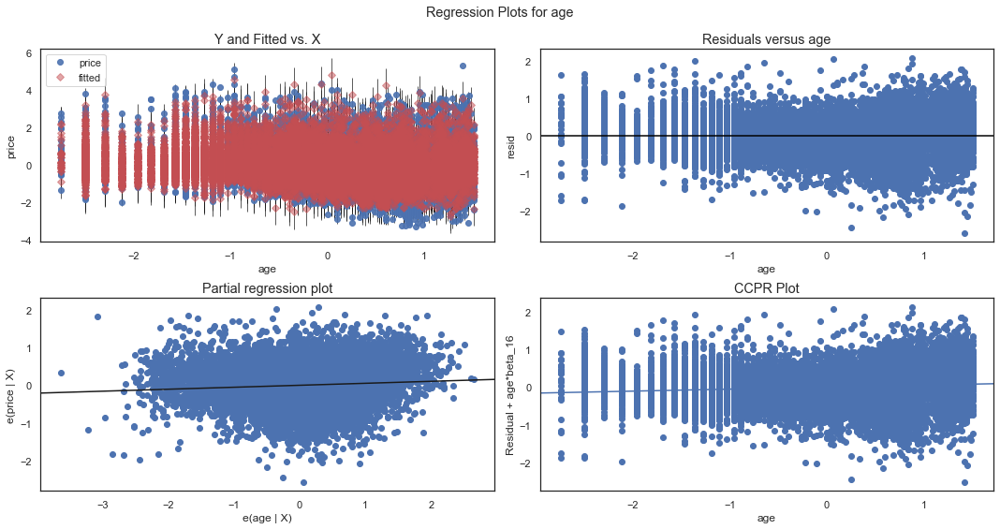

In [100]:
fig = plt.figure(figsize=(15,8))
for col in ['sqft_above','dist_from_top','sqft_lot',
            'sqft_living15','bedrooms','bathrooms','age']:
    fig = plt.figure(figsize=(15,8))
    fig = sm.graphics.plot_regress_exog(model, col, fig = fig)
    plt.show()

In [101]:
name = ['Jarque-Bera','Prob','Skew', 'Kurtosis']
test = sms.jarque_bera(model.resid)
list(zip(name, test))

[('Jarque-Bera', 502.9256908076983),
 ('Prob', 6.181214823267789e-110),
 ('Skew', -0.01613442446886743),
 ('Kurtosis', 3.835217286146776)]

### Trial 4 Discussion:
This produced slightly better results but those variable will be dropped to maintain linearity assumptions and keep the number of predictors low. 

In [102]:
df.drop(['zipcode','sqft_basement'],axis = 1,inplace = True)
df.head()

,price,bedrooms,bathrooms,sqft_lot,sqft_above,lat,sqft_living15,dist_from_top,"condition_(2, 5]","view_(0, 3]","view_(3, 4]",waterfront_1.0,"grade_(6, 9]","grade_(9, 13]",Renovated?_True,prime_zipcode_True,age
0,-1.401998,-0.279718,-1.726509,-0.388430,-0.753565,47.5112,-1.035429,-0.620617,1,0,0,0,1,0,0,0,0.687861
1,0.279938,-0.279718,0.339653,-0.113241,0.672693,47.7210,-0.326781,-0.039721,1,0,0,0,1,0,1,0,0.767756
2,-1.799430,-1.711611,-1.726509,0.244475,-1.752954,47.7379,1.126504,0.034583,1,0,0,0,0,0,0,0,1.077870
3,0.499698,0.736226,1.072635,-0.523914,-1.026835,47.5208,-0.990187,0.000914,1,0,0,0,1,0,0,0,0.464369
4,0.178434,-0.279718,0.039555,0.008139,0.073515,47.6168,-0.134218,0.003028,1,0,0,0,1,0,0,0,-0.219034


## Trial 5: Latitude and Age investigation. 

* Categorical predictors: view (binned), waterfront, grade (binned), condition (binned), Renovated?, prime_zipcode
* Quantitative predictors: bedrooms, bathrooms, sqft_lot, sqft_above, sqft_living15, dist_from_top
* Notes: Dropped lat and age

Let's first look at the histogram for latitude.

### Trial Data Exploration and Cleaning

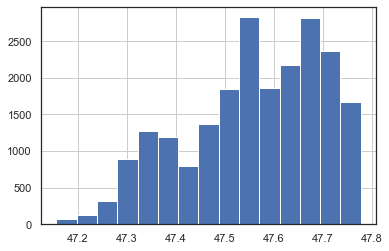

In [103]:
df.lat.hist(bins = 15)

Let's try to improve this distribution by standardizing and log transforming the predictor lat.

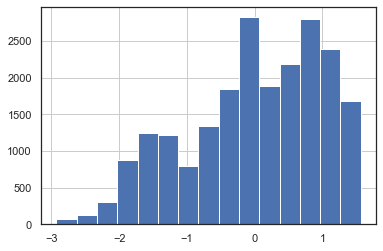

In [104]:
df.lat = np.log(df.lat)
df.lat = (df.lat - df.lat.mean()) / df.lat.std()
df.lat.hist(bins = 15)

This didn't really improve the distribution of the predictor to be more normal. Thus even though the predictor lat is a key predictor as seen by its coefficient, it might be best to drop the variable in order to improve on normality. Let's next look at the linearity between the newly introduced age variable and price. 

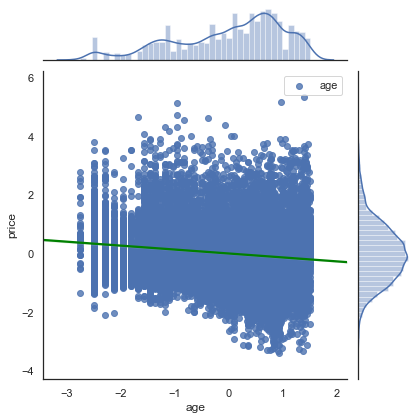

In [105]:
sns.jointplot(x = 'age', y = "price",
                  data = df, 
                  kind = 'reg', 
                  label = 'age',
                  joint_kws = {'line_kws':{'color':'green'}})
plt.legend()
plt.show()

This joint plot shows a slightly negative linear relationship between price and age however due to its lack of normality and minimal relationship the age variable will be dropped. 

In [106]:
x = df.drop(['price','lat','age'],axis = 1)
y = df.price
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 3)

### Trial Results and Analysis

In [107]:
predictors_int = sm.add_constant(x_train)
model = sm.OLS(y_train,predictors_int).fit()
model.summary()

/Users/kiarashahmadi/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.725
Model:                            OLS   Adj. R-squared:                  0.725
Method:                 Least Squares   F-statistic:                     3251.
Date:                Thu, 30 Jul 2020   Prob (F-statistic):               0.00
Time:                        21:08:08   Log-Likelihood:                -13389.
No. Observations:               17277   AIC:                         2.681e+04
Df Residuals:                   17262   BIC:                         2.692e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.7999      0.043    -18.648      0.000      -0.884      -0.716
bedrooms              -0.0322      0.005     -6.405      0.000      -0.042      -0.022
bathrooms              0.1294      0.006     21.278      0.000       0.117       0.141
sqft_lot               0.0700      0.005     14.679      0.000       0.061       0.079
sqft_above             0.2731      0.007     38.471      0.000       0.259       0.287
sqft_living15          0.1757      0.006     28.033      0.000       0.163       0.188
dist_from_top         -0.4734      0.005    -96.411      0.000      -0.483      -0.464
condition_(2, 5]       0.4327      0.042     10.320      0.000       0.351       0.515
view_(0, 3]            0.3634      0.015     24.155      0.000       0.334       0.393
view_(3, 4]            0.7738      0.041     19.105      0.000       0.694       0.853
waterfront_1.0         0.6212      0.059     10.498      0.000       0.505       0.737
grade_(6, 9]           0.3145      0.015     20.988      0.000       0.285       0.344
grade_(9, 13]          0.7748      0.025     31.414      0.000       0.726       0.823
Renovated?_True        0.2037      0.022      9.257      0.000       0.161       0.247
prime_zipcode_True     0.0719      0.023      3.105      0.002       0.027       0.117
==============================================================================
Omnibus:                      121.548   Durbin-Watson:                   2.014
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              173.497
Skew:                          -0.075   Prob(JB):                     2.12e-38
Kurtosis:                       3.468   Cond. No.                         27.6
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [108]:
predictors_test=sm.add_constant(x_test)
y_hat_train = model.predict(predictors_int)
y_hat_test = model.predict(predictors_test)

train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squarred Error:', train_mse)
print('Test Mean Squarred Error:', test_mse)

Train Mean Squarred Error: 0.2758255550922008
Test Mean Squarred Error: 0.27975170551521966


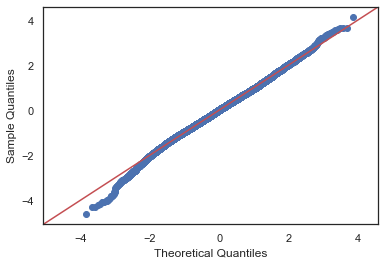

In [109]:
residuals = model.resid
fig = sm.graphics.qqplot(residuals,dist=stats.norm, line = '45', fit = True)

<Figure size 1080x576 with 0 Axes>

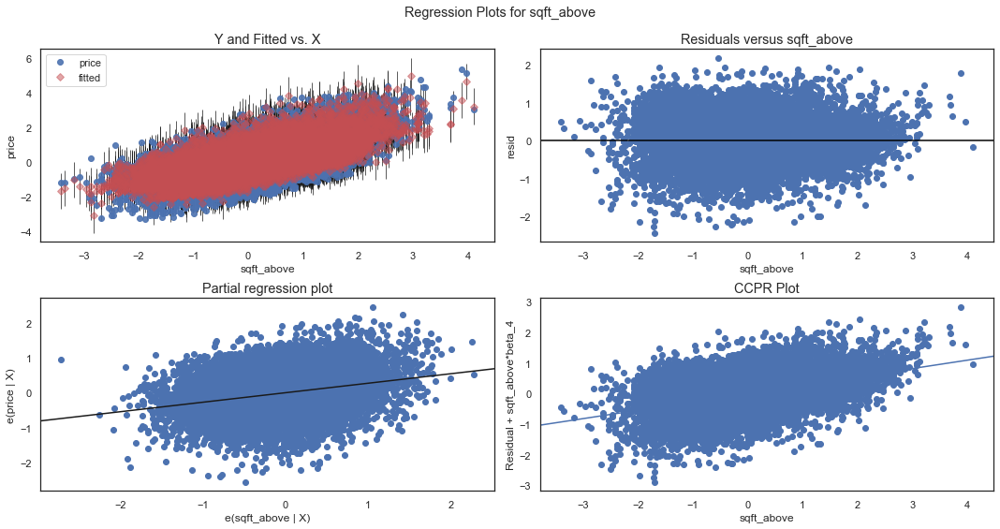

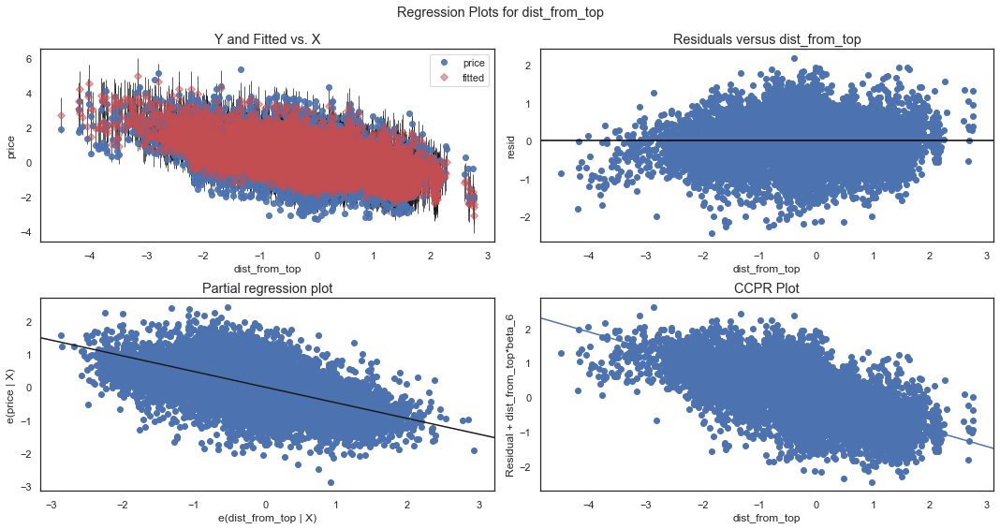

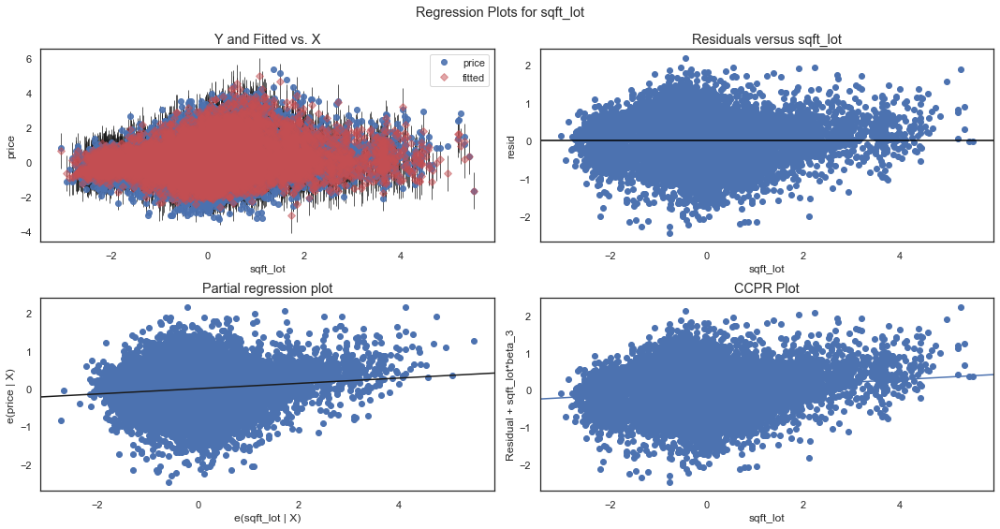

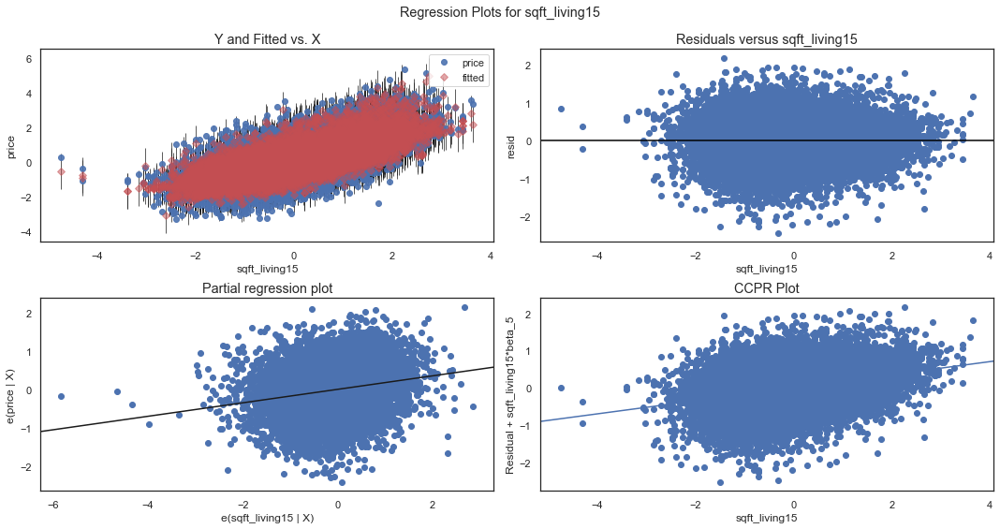

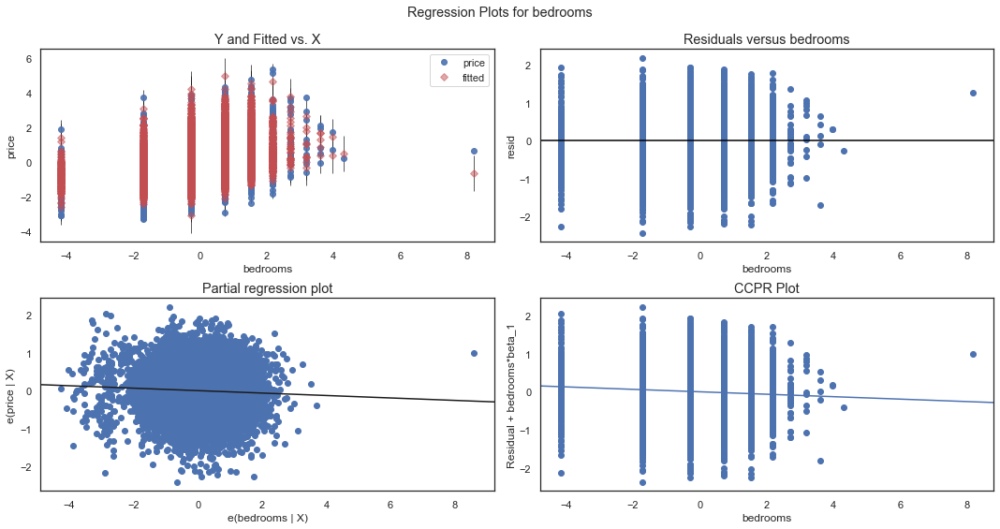

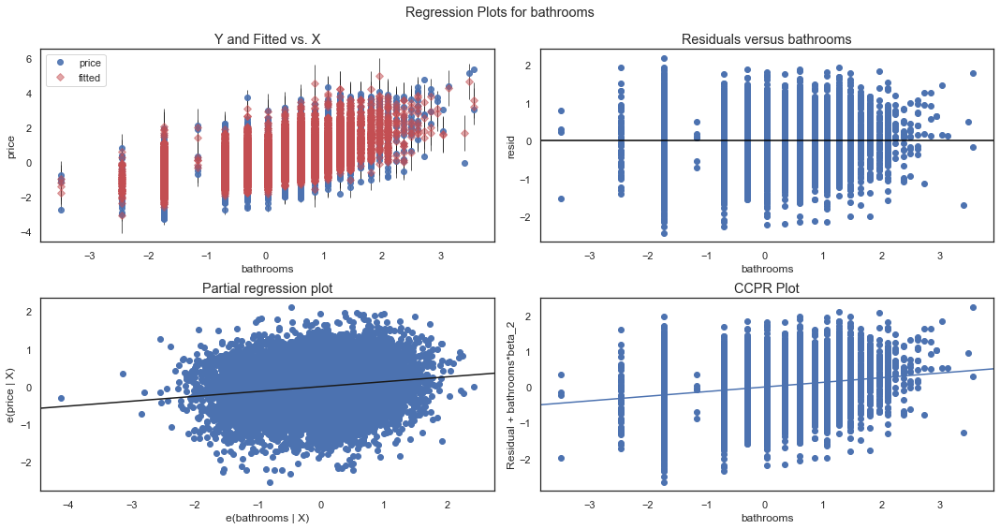

In [110]:
fig = plt.figure(figsize = (15,8))
for col in ['sqft_above','dist_from_top','sqft_lot',
            'sqft_living15','bedrooms','bathrooms']:
    fig = plt.figure(figsize = (15,8))
    fig = sm.graphics.plot_regress_exog(model, col, fig = fig)
    plt.show()

In [111]:
name = ['Jarque-Bera','Prob','Skew', 'Kurtosis']
test = sms.jarque_bera(model.resid)
list(zip(name, test))

[('Jarque-Bera', 173.49706594561073),
 ('Prob', 2.1163661990773382e-38),
 ('Skew', -0.07481867516174863),
 ('Kurtosis', 3.467566735928521)]

### Trial 5 Discussion:

Dropping latitude and age from the model helped to significantly improve the normality of the model while still maintaining a relatively reasonable R-squared value. Thus these variables will stay dropped.

In [112]:
df.drop(['lat','age'],axis = 1, inplace = True)

## Trial 6:  Stepwise Selection

* Categorical predictors: view (binned), waterfront, grade (binned), condition (binned), Renovated?, prime_zipcode
* Quantitative predictors: bedrooms, bathrooms, sqft_lot, sqft_above, sqft_living15, dist_from_top
* Notes: performed stepwise selection to see if any predictors can be eliminated.

Let's first introduce the stepwise selection function then run our dataset into it. 

In [113]:
import statsmodels.api as sm

def stepwise_selection(X, y, 
                       initial_list = [], 
                       threshold_in = 0.01, 
                       threshold_out = 0.05, 
                       verbose = True):
    """ Perform a forward-backward feature selection 
    based on p-value from statsmodels.api.OLS
    Arguments:
        X - pandas.DataFrame with candidate features
        y - list-like with the target
        initial_list - list of features to start with (column names of X)
        threshold_in - include a feature if its p-value < threshold_in
        threshold_out - exclude a feature if its p-value > threshold_out
        verbose - whether to print the sequence of inclusions and exclusions
    Returns: list of selected features 
    Always set threshold_in < threshold_out to avoid infinite looping.
    See https://en.wikipedia.org/wiki/Stepwise_regression for the details
    """
    included = list(initial_list)
    while True:
        changed = False
        # forward step
        excluded = list(set(X.columns)-set(included))
        new_pval = pd.Series(index=excluded)
        for new_column in excluded:
            model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included+[new_column]]))).fit()
            new_pval[new_column] = model.pvalues[new_column]
        best_pval = new_pval.min()
        if best_pval < threshold_in:
            best_feature = new_pval.idxmin()
            included.append(best_feature)
            changed=True
            if verbose:
                print('Add  {:30} with p-value {:.6}'.format(best_feature, best_pval))

        # backward step
        model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included]))).fit()
        # use all coefs except intercept
        pvalues = model.pvalues.iloc[1:]
        worst_pval = pvalues.max() # null if pvalues is empty
        if worst_pval > threshold_out:
            changed=True
            worst_feature = pvalues.argmax()
            included.remove(worst_feature)
            if verbose:
                print('Drop {:30} with p-value {:.6}'.format(worst_feature, worst_pval))
        if not changed:
            break
    return included

In [114]:
result = stepwise_selection(x, y, verbose = True)
print('resulting features:')
print(result)

/Users/kiarashahmadi/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
/Users/kiarashahmadi/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
/Users/kiarashahmadi/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
/Users/kiarashahmadi/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
/Users/kiarashahmadi/opt/ana

Add  grade_(9, 13]                  with p-value 0.0
Add  dist_from_top                  with p-value 0.0
Add  bathrooms                      with p-value 0.0
Add  sqft_above                     with p-value 0.0
Add  sqft_living15                  with p-value 0.0
Add  view_(3, 4]                    with p-value 3.53869e-205
Add  view_(0, 3]                    with p-value 2.36543e-169
Add  grade_(6, 9]                   with p-value 3.26865e-103
Add  sqft_lot                       with p-value 1.99977e-58
Add  waterfront_1.0                 with p-value 1.45182e-37
Add  condition_(2, 5]               with p-value 1.0514e-29
Add  Renovated?_True                with p-value 4.28585e-26
Add  bedrooms                       with p-value 8.35768e-15
Add  prime_zipcode_True             with p-value 0.00175813
resulting features:
['grade_(9, 13]', 'dist_from_top', 'bathrooms', 'sqft_above', 'sqft_living15', 'view_(3, 4]', 'view_(0, 3]', 'grade_(6, 9]', 'sqft_lot', 'waterfront_1.0', 'condition

In [115]:
resulting_features = ['dist_from_top', 'bathrooms', 'sqft_living15', 'grade_(9, 13]', 
                      'sqft_above', 'view_(3, 4]', 'view_(0, 3]', 'grade_(6, 9]', 'sqft_lot',
                      'waterfront_1.0', 'condition_(2, 5]', 'Renovated?_True', 'bedrooms', 
                      'prime_zipcode_True']


In [116]:
len(resulting_features)

14

Let's now incorporate the resulting features into dataset by dropping any column that is not in the variable resulting features. 

In [117]:
for column in x:
    if (column  not in resulting_features):
        x.drop(column,axis = 1,inplace = True)
x.head()

,bedrooms,bathrooms,sqft_lot,sqft_above,sqft_living15,dist_from_top,"condition_(2, 5]","view_(0, 3]","view_(3, 4]",waterfront_1.0,"grade_(6, 9]","grade_(9, 13]",Renovated?_True,prime_zipcode_True
0,-0.279718,-1.726509,-0.388430,-0.753565,-1.035429,-0.620617,1,0,0,0,1,0,0,0
1,-0.279718,0.339653,-0.113241,0.672693,-0.326781,-0.039721,1,0,0,0,1,0,1,0
2,-1.711611,-1.726509,0.244475,-1.752954,1.126504,0.034583,1,0,0,0,0,0,0,0
3,0.736226,1.072635,-0.523914,-1.026835,-0.990187,0.000914,1,0,0,0,1,0,0,0
4,-0.279718,0.039555,0.008139,0.073515,-0.134218,0.003028,1,0,0,0,1,0,0,0


In [118]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state=3)

In [119]:
predictors_int = sm.add_constant(x_train)
model = sm.OLS(y_train,predictors_int).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.725
Model:                            OLS   Adj. R-squared:                  0.725
Method:                 Least Squares   F-statistic:                     3251.
Date:                Thu, 30 Jul 2020   Prob (F-statistic):               0.00
Time:                        21:08:19   Log-Likelihood:                -13389.
No. Observations:               17277   AIC:                         2.681e+04
Df Residuals:                   17262   BIC:                         2.692e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.7999      0.043    -18.648      0.000      -0.884      -0.716
bedrooms              -0.0322      0.005     -6.405      0.000      -0.042      -0.022
bathrooms              0.1294      0.006     21.278      0.000       0.117       0.141
sqft_lot               0.0700      0.005     14.679      0.000       0.061       0.079
sqft_above             0.2731      0.007     38.471      0.000       0.259       0.287
sqft_living15          0.1757      0.006     28.033      0.000       0.163       0.188
dist_from_top         -0.4734      0.005    -96.411      0.000      -0.483      -0.464
condition_(2, 5]       0.4327      0.042     10.320      0.000       0.351       0.515
view_(0, 3]            0.3634      0.015     24.155      0.000       0.334       0.393
view_(3, 4]            0.7738      0.041     19.105      0.000       0.694       0.853
waterfront_1.0         0.6212      0.059     10.498      0.000       0.505       0.737
grade_(6, 9]           0.3145      0.015     20.988      0.000       0.285       0.344
grade_(9, 13]          0.7748      0.025     31.414      0.000       0.726       0.823
Renovated?_True        0.2037      0.022      9.257      0.000       0.161       0.247
prime_zipcode_True     0.0719      0.023      3.105      0.002       0.027       0.117
==============================================================================
Omnibus:                      121.548   Durbin-Watson:                   2.014
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              173.497
Skew:                          -0.075   Prob(JB):                     2.12e-38
Kurtosis:                       3.468   Cond. No.                         27.6
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [120]:
predictors_test = sm.add_constant(x_test)
y_hat_train = model.predict(predictors_int)
y_hat_test = model.predict(predictors_test)

In [121]:
train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squarred Error:', train_mse)
print('Test Mean Squarred Error:', test_mse)

Train Mean Squarred Error: 0.2758255550922008
Test Mean Squarred Error: 0.27975170551521966


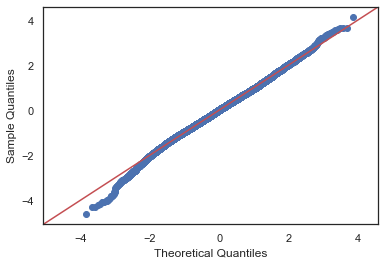

In [122]:
residuals = model.resid
fig = sm.graphics.qqplot(residuals,dist = stats.norm, line = '45', fit = True)

<Figure size 1080x576 with 0 Axes>

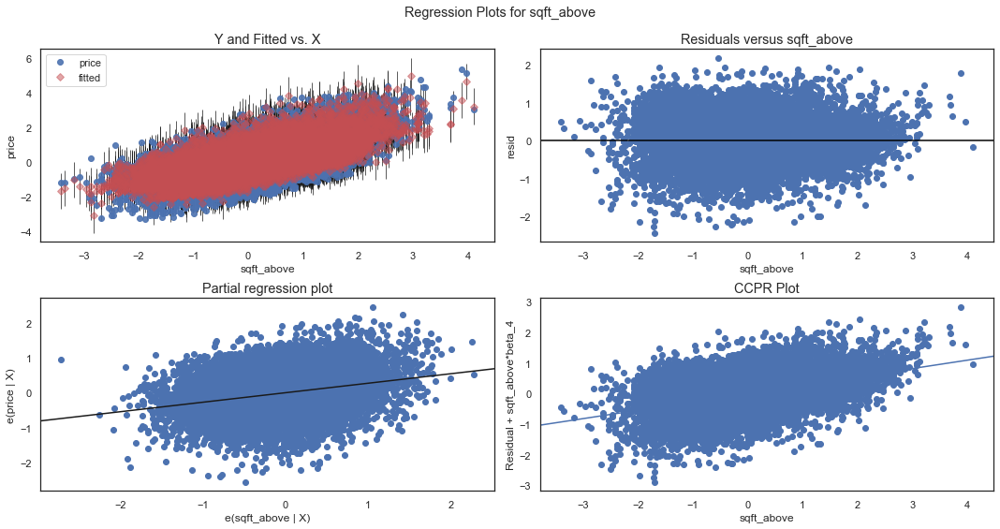

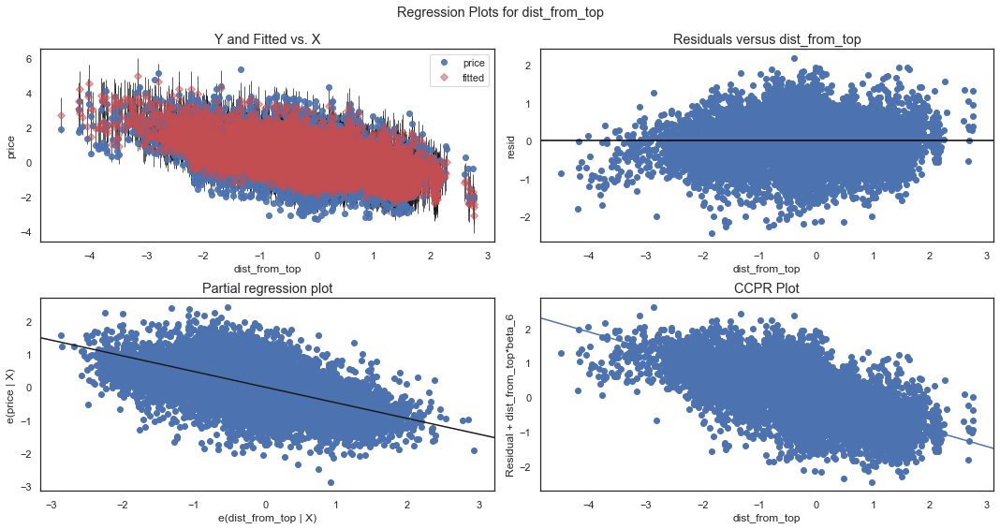

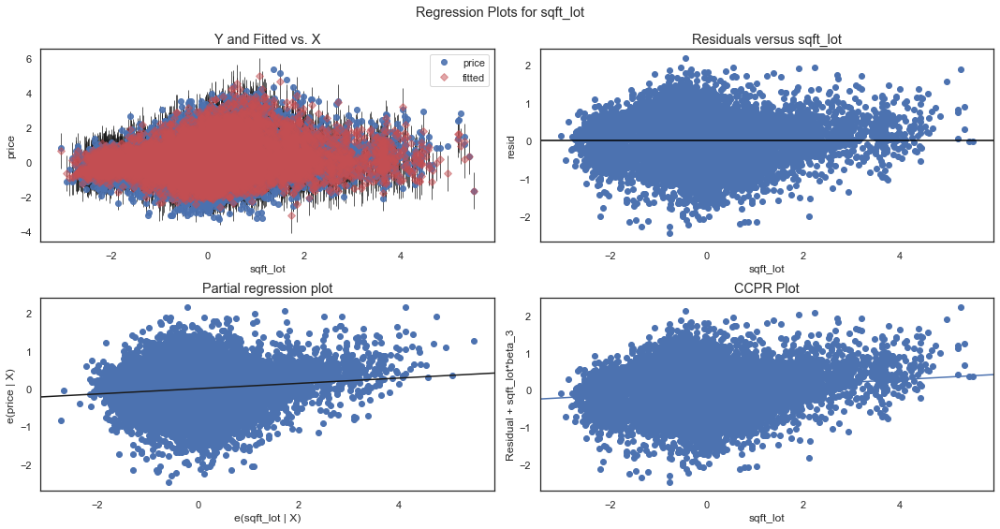

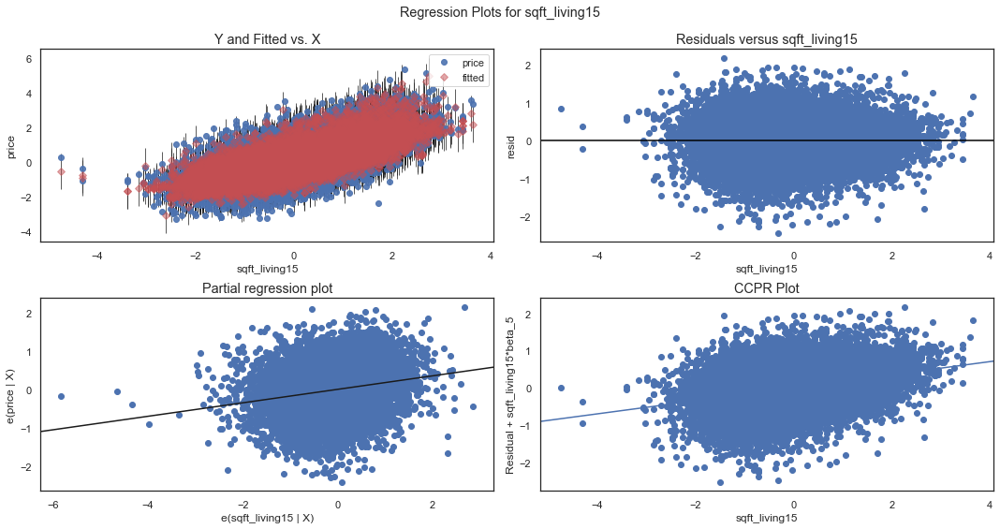

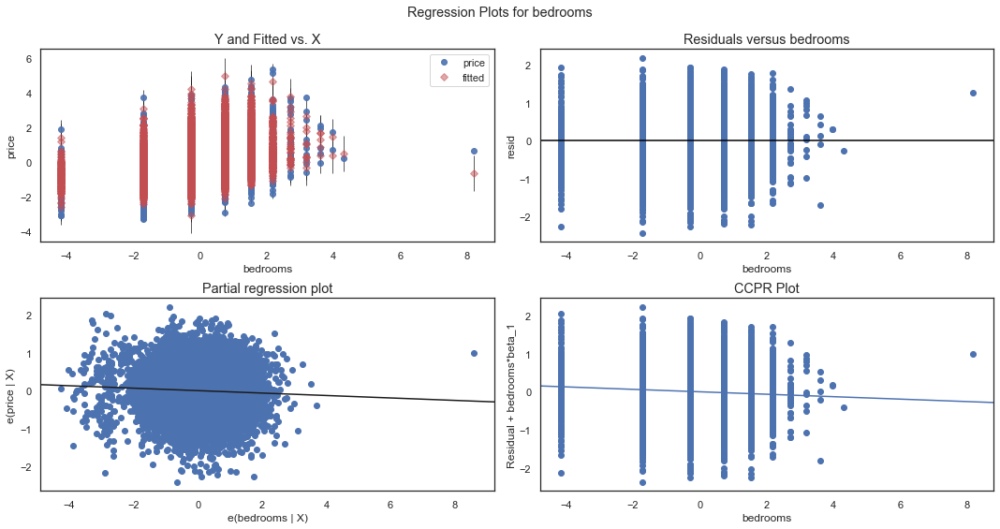

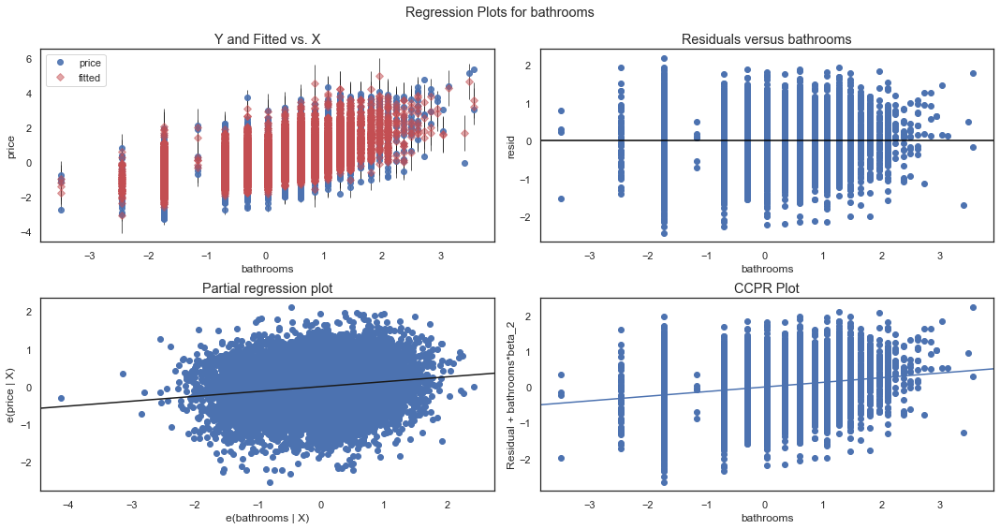

In [123]:
fig = plt.figure(figsize = (15,8))
for col in ['sqft_above','dist_from_top','sqft_lot',
            'sqft_living15','bedrooms','bathrooms']:
    fig = plt.figure(figsize = (15,8))
    fig = sm.graphics.plot_regress_exog(model, col, fig = fig)
    plt.show()

In [124]:
name = ['Jarque-Bera','Prob','Skew', 'Kurtosis']
test = sms.jarque_bera(model.resid)
list(zip(name, test))

[('Jarque-Bera', 173.49706594561073),
 ('Prob', 2.1163661990773382e-38),
 ('Skew', -0.07481867516174863),
 ('Kurtosis', 3.467566735928521)]

### Trial 6 Discussion:

The stepwise selection function picked every variable already in the model thus there was no difference in terms of results. Thus let's next try to select features using Recursive Feature Elimination from Scikit.

## Trial 7: Recursive Feature Elimination 

* Categorical predictors: view (binned), waterfront, grade (binned), condition (binned), Renovated?, prime_zipcode
* Quantitative predictors: bedrooms, bathrooms, sqft_lot, sqft_above, sqft_living15, dist_from_top
* Notes: performed RFE and evaluated the model 


I'll perform RFE with the intention of cutting the amount of predictors in half and then evaluate the model. 

In [125]:
predictors_int = sm.add_constant(x)
model = sm.OLS(df['price'],predictors_int).fit()
model.summary()


linreg = LinearRegression()
selector = RFE(linreg, n_features_to_select = 7)
selector = selector.fit(x, df["price"])

test = x.columns[selector.support_]
print(test)
selector.ranking_

Index(['sqft_above', 'dist_from_top', 'view_(0, 3]', 'view_(3, 4]',
       'waterfront_1.0', 'grade_(6, 9]', 'grade_(9, 13]'],
      dtype='object')


/Users/kiarashahmadi/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


array([8, 5, 6, 1, 4, 1, 2, 1, 1, 1, 1, 1, 3, 7])

In [126]:
rfe_results = ['sqft_above', 'dist_from_top', 'view_(0, 3]', 'view_(3, 4]',
       'waterfront_1.0', 'grade_(6, 9]', 'grade_(9, 13]']

In [127]:
xx = x.copy()
for column in xx:
    if (column  not in rfe_results):
        xx.drop(column,axis=1,inplace=True)
xx.head()

,sqft_above,dist_from_top,"view_(0, 3]","view_(3, 4]",waterfront_1.0,"grade_(6, 9]","grade_(9, 13]"
0,-0.753565,-0.620617,0,0,0,1,0
1,0.672693,-0.039721,0,0,0,1,0
2,-1.752954,0.034583,0,0,0,0,0
3,-1.026835,0.000914,0,0,0,1,0
4,0.073515,0.003028,0,0,0,1,0


In [128]:
x_train, x_test, y_train, y_test = train_test_split(xx, y, test_size = 0.2, random_state=3)

In [129]:
predictors_int = sm.add_constant(x_train)
model = sm.OLS(y_train,predictors_int).fit()
model.summary()

/Users/kiarashahmadi/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.693
Model:                            OLS   Adj. R-squared:                  0.693
Method:                 Least Squares   F-statistic:                     5565.
Date:                Thu, 30 Jul 2020   Prob (F-statistic):               0.00
Time:                        21:08:28   Log-Likelihood:                -14345.
No. Observations:               17277   AIC:                         2.871e+04
Df Residuals:                   17269   BIC:                         2.877e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -0.4947      0.014    -34.666      0.000      -0.523      -0.467
sqft_above         0.4605      0.005     87.579      0.000       0.450       0.471
dist_from_top     -0.4736      0.004   -110.025      0.000      -0.482      -0.465
view_(0, 3]        0.4879      0.016     31.341      0.000       0.457       0.518
view_(3, 4]        0.9276      0.043     21.798      0.000       0.844       1.011
waterfront_1.0     0.6454      0.062     10.348      0.000       0.523       0.768
grade_(6, 9]       0.4387      0.015     29.320      0.000       0.409       0.468
grade_(9, 13]      1.0287      0.025     40.954      0.000       0.979       1.078
==============================================================================
Omnibus:                      146.892   Durbin-Watson:                   2.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              188.404
Skew:                          -0.139   Prob(JB):                     1.23e-41
Kurtosis:                       3.429   Cond. No.                         21.3
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [130]:
predictors_test = sm.add_constant(x_test)
y_hat_train = model.predict(predictors_int)
y_hat_test = model.predict(predictors_test)

In [131]:
train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squarred Error:', train_mse)
print('Test Mean Squarred Error:', test_mse)

Train Mean Squarred Error: 0.308119292978414
Test Mean Squarred Error: 0.3134040984902266


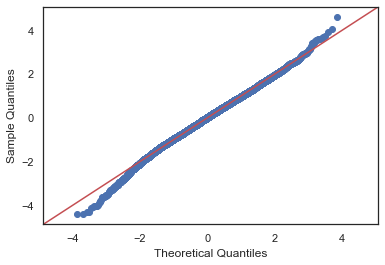

In [132]:
residuals=model.resid
fig=sm.graphics.qqplot(residuals,dist = stats.norm, line = '45', fit = True)

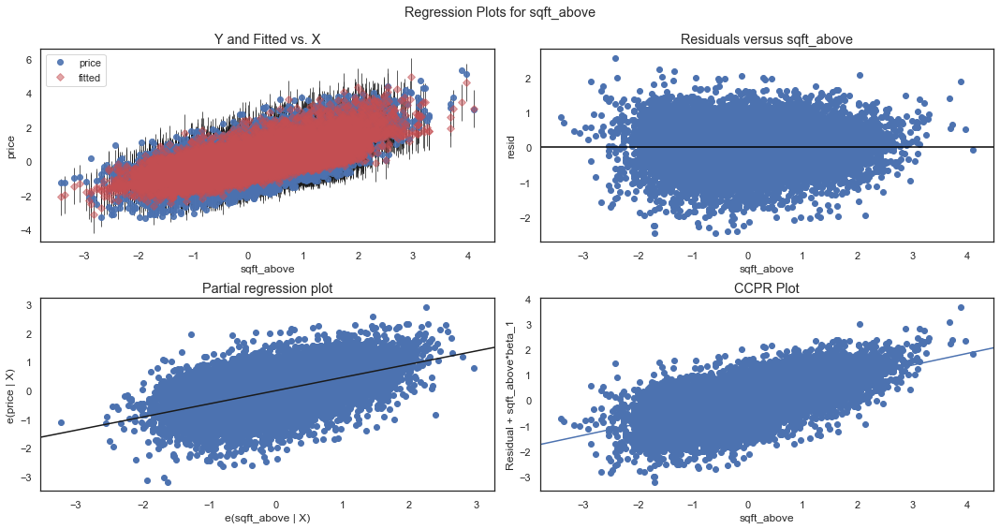

In [133]:
fig = plt.figure(figsize = (15,8))
fig = sm.graphics.plot_regress_exog(model, "sqft_above", fig = fig)
plt.show()

In [134]:
name = ['Jarque-Bera','Prob','Skew', 'Kurtosis']
test = sms.jarque_bera(model.resid)
list(zip(name, test))

[('Jarque-Bera', 188.40412533483612),
 ('Prob', 1.2262075889646897e-41),
 ('Skew', -0.13923613507272697),
 ('Kurtosis', 3.4291515212396186)]

### Trial 7 Discussion:

RFE performed much worse. I'll keep the model from before. Ideally more investigation should be done by finding out how many features I can have while still having good results. 

## Final Model

* Categorical predictors: view (binned), waterfront, grade (binned), condition (binned), Renovated?, prime_zipcode
* Quantitative predictors: bedrooms, bathrooms, sqft_lot, sqft_above, sqft_living15, dist_from_top
* Notes: This set of predictors make up the final model. 

### Final Model Results

In [135]:
df.head()

,price,bedrooms,bathrooms,sqft_lot,sqft_above,sqft_living15,dist_from_top,"condition_(2, 5]","view_(0, 3]","view_(3, 4]",waterfront_1.0,"grade_(6, 9]","grade_(9, 13]",Renovated?_True,prime_zipcode_True
0,-1.401998,-0.279718,-1.726509,-0.388430,-0.753565,-1.035429,-0.620617,1,0,0,0,1,0,0,0
1,0.279938,-0.279718,0.339653,-0.113241,0.672693,-0.326781,-0.039721,1,0,0,0,1,0,1,0
2,-1.799430,-1.711611,-1.726509,0.244475,-1.752954,1.126504,0.034583,1,0,0,0,0,0,0,0
3,0.499698,0.736226,1.072635,-0.523914,-1.026835,-0.990187,0.000914,1,0,0,0,1,0,0,0
4,0.178434,-0.279718,0.039555,0.008139,0.073515,-0.134218,0.003028,1,0,0,0,1,0,0,0


In [136]:
x = df.drop(['price'],axis = 1)
y = df.price
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 3)

In [137]:
predictors_int = sm.add_constant(x_train)
model = sm.OLS(y_train,predictors_int).fit()
model.summary()

/Users/kiarashahmadi/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.725
Model:                            OLS   Adj. R-squared:                  0.725
Method:                 Least Squares   F-statistic:                     3251.
Date:                Thu, 30 Jul 2020   Prob (F-statistic):               0.00
Time:                        21:08:30   Log-Likelihood:                -13389.
No. Observations:               17277   AIC:                         2.681e+04
Df Residuals:                   17262   BIC:                         2.692e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.7999      0.043    -18.648      0.000      -0.884      -0.716
bedrooms              -0.0322      0.005     -6.405      0.000      -0.042      -0.022
bathrooms              0.1294      0.006     21.278      0.000       0.117       0.141
sqft_lot               0.0700      0.005     14.679      0.000       0.061       0.079
sqft_above             0.2731      0.007     38.471      0.000       0.259       0.287
sqft_living15          0.1757      0.006     28.033      0.000       0.163       0.188
dist_from_top         -0.4734      0.005    -96.411      0.000      -0.483      -0.464
condition_(2, 5]       0.4327      0.042     10.320      0.000       0.351       0.515
view_(0, 3]            0.3634      0.015     24.155      0.000       0.334       0.393
view_(3, 4]            0.7738      0.041     19.105      0.000       0.694       0.853
waterfront_1.0         0.6212      0.059     10.498      0.000       0.505       0.737
grade_(6, 9]           0.3145      0.015     20.988      0.000       0.285       0.344
grade_(9, 13]          0.7748      0.025     31.414      0.000       0.726       0.823
Renovated?_True        0.2037      0.022      9.257      0.000       0.161       0.247
prime_zipcode_True     0.0719      0.023      3.105      0.002       0.027       0.117
==============================================================================
Omnibus:                      121.548   Durbin-Watson:                   2.014
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              173.497
Skew:                          -0.075   Prob(JB):                     2.12e-38
Kurtosis:                       3.468   Cond. No.                         27.6
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [138]:
predictors_test=sm.add_constant(x_test)
y_hat_train = model.predict(predictors_int)
y_hat_test = model.predict(predictors_test)

train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squarred Error:', train_mse)
print('Test Mean Squarred Error:', test_mse)

Train Mean Squarred Error: 0.2758255550922008
Test Mean Squarred Error: 0.27975170551521966


The similar MSE values for the training set and test set indicate that over-fitting is not occurring. 

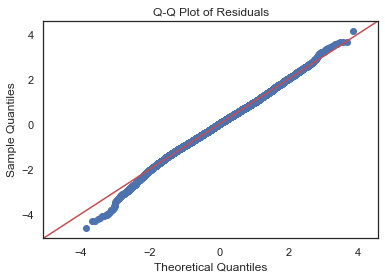

In [139]:
residuals = model.resid
fig = sm.graphics.qqplot(residuals,dist=stats.norm, line = '45', fit = True)
plt.title('Q-Q Plot of Residuals')
plt.show()

The residuals seem to follow a linear pattern with some slight deviation in linear behavior at the negative end of the quantiles. This is possible due to the negative outliers and would require further investigation yet the Jarque-Bera value is good enough to accept these results.

<Figure size 1080x576 with 0 Axes>

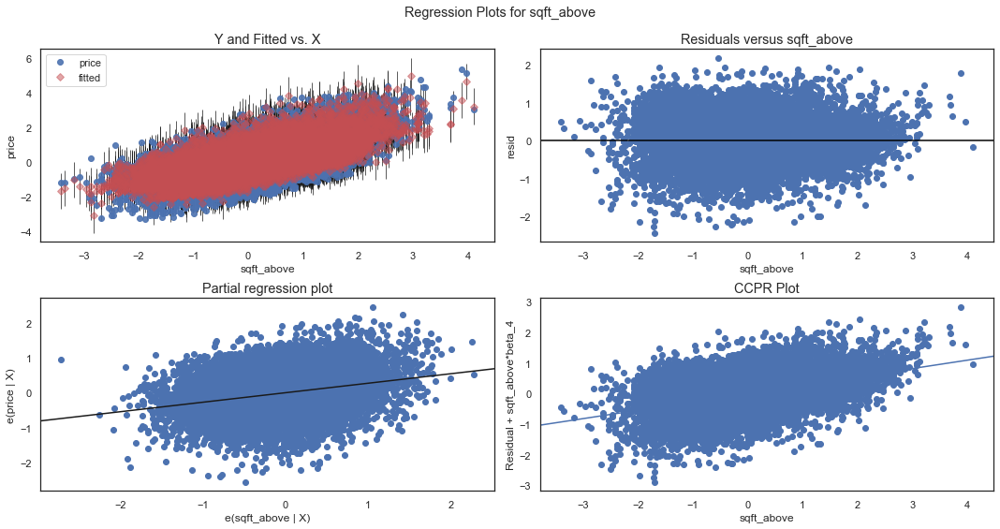

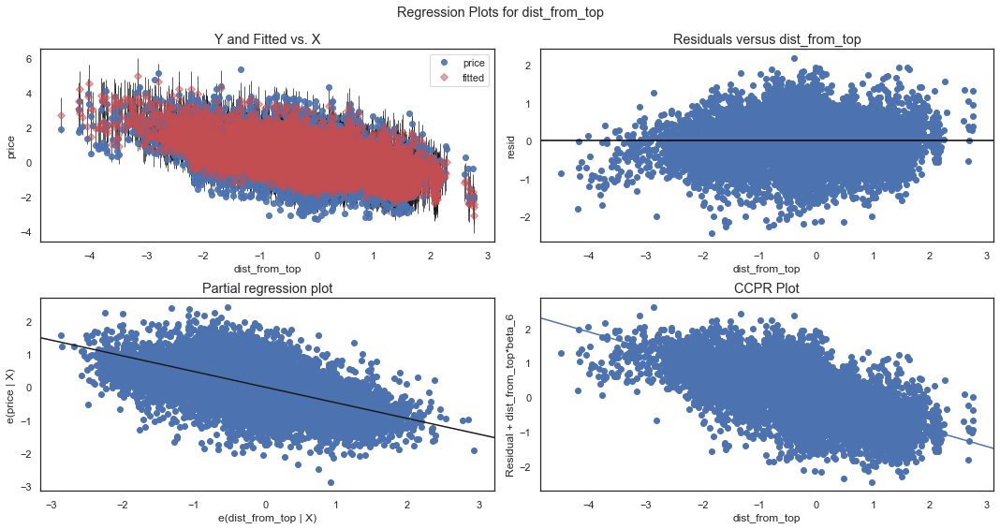

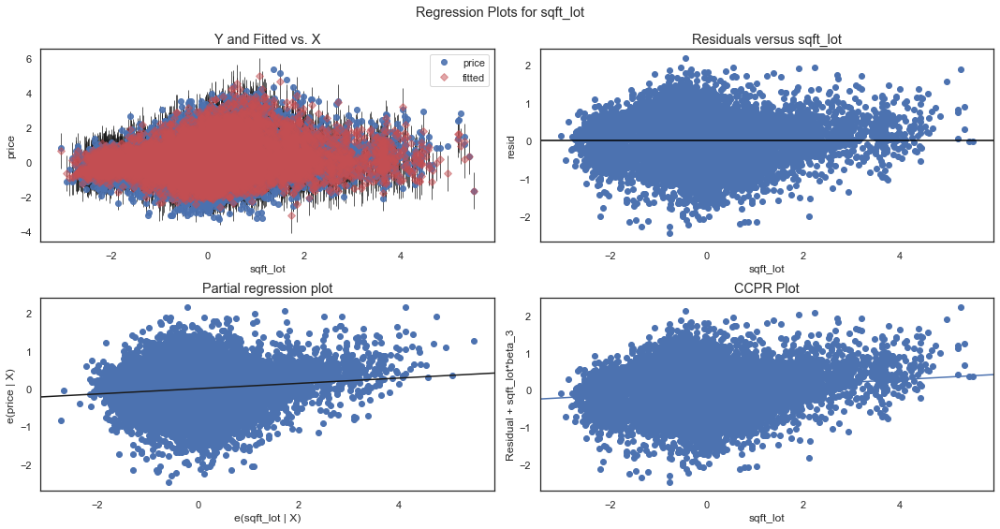

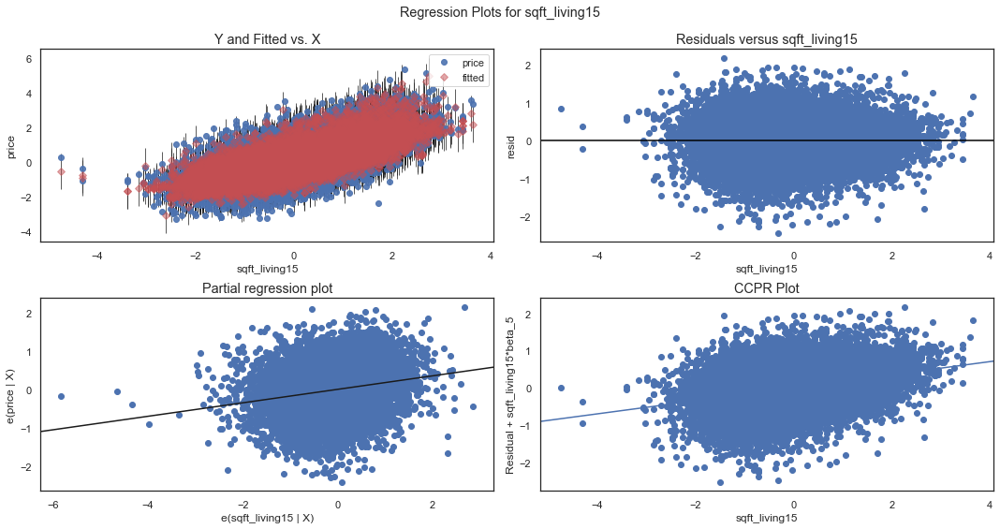

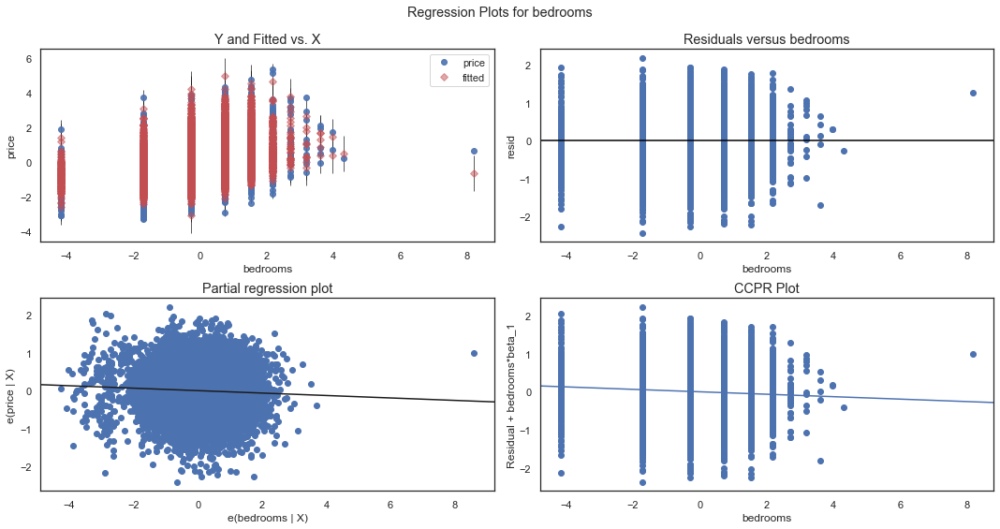

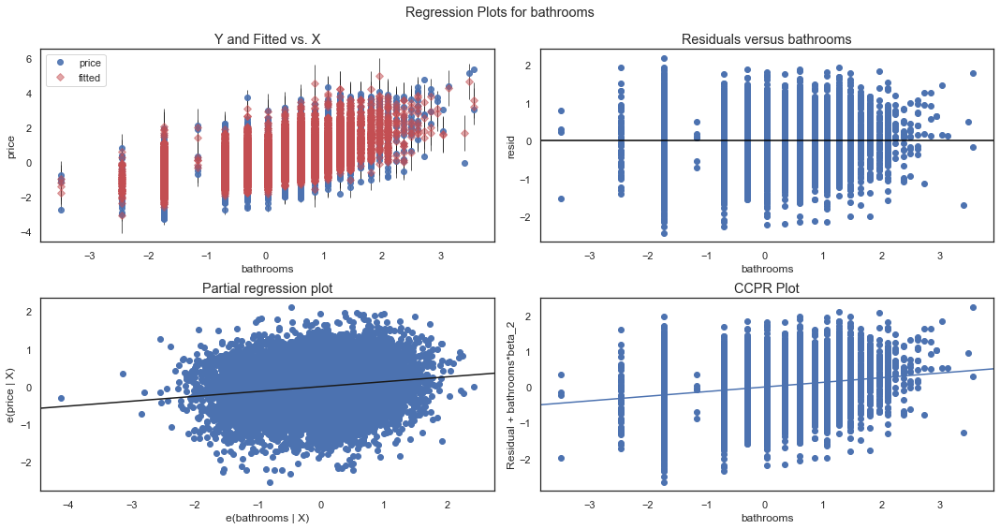

In [140]:
fig = plt.figure(figsize = (15,8))
for col in ['sqft_above','dist_from_top','sqft_lot',
            'sqft_living15','bedrooms','bathrooms']:
    fig = plt.figure(figsize = (15,8))
    fig = sm.graphics.plot_regress_exog(model, col, fig = fig)
    plt.show()

The residuals of the final model pass the homoscedasticity test as the residuals are equal along the regression line for all the predictors.

In [141]:
name = ['Jarque-Bera','Prob','Skew', 'Kurtosis']
test = sms.jarque_bera(model.resid)
list(zip(name, test))

[('Jarque-Bera', 173.49706594561073),
 ('Prob', 2.1163661990773382e-38),
 ('Skew', -0.07481867516174863),
 ('Kurtosis', 3.467566735928521)]

The skewness and kurtosis of the residuals are close to that of a normal distribution (0 and 3 respectively). In addition the low Jarque-Bera value combined with its probability allows me to safely assume the residuals follow a normal distribution.

### K-Fold Cross Validation

Let's confirm the final model's results by performing K-Fold Cross Validation. This process consists of splitting the entire data set into "K" equal sections of data. From there, "K" regression models are trained which each model using a different section of the test set and all the other sections are combined as a training set. We then evaluate the results from each model to a get a Cross-Validation MSE. This process will be done with K = 5, 10, and 20 then the MSE of each set is evaluated. 

In [142]:
from sklearn.model_selection import cross_val_score

cv_5_results = (cross_val_score(linreg, x, y, cv = 5, scoring = "neg_mean_squared_error"))
cv_10_results = (cross_val_score(linreg, x, y, cv = 10, scoring = "neg_mean_squared_error"))
cv_20_results = (cross_val_score(linreg, x, y, cv = 20, scoring = "neg_mean_squared_error"))


In [143]:
print(np.mean(cv_5_results))
print(np.mean(cv_10_results))
print(np.mean(cv_20_results))

-0.27726036530209386
-0.27728321186856963
-0.2771537421906304


The MSE values for each K-Fold size are close enough to give further validation to the modeling process. 

# Interpretation/Code for Presentation

Let's first revisit what the questions were exactly:

1. How much does the quality of the house affect house prices? 
2. Does a view actually cause an increase in house prices?
3. Does location matter the most? If not what does?

Thus let's see from the model how a change in grade (quality), view, and distance from the top locations affect the change in price. 

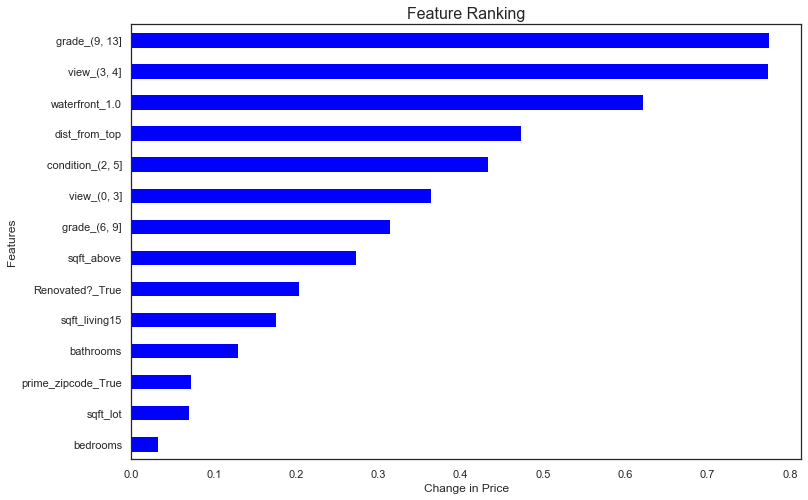

In [144]:
ranking1 = model.params.drop(['const']).abs().sort_values(ascending=True)
ranking1.plot(kind = 'barh' , color ='blue', figsize =(12,8));
plt.title('Feature Ranking', fontsize = 16);
plt.xlabel("Change in Price");
plt.ylabel("Features");
plt.savefig('ranking.jpg', bbox_inches = 'tight')

Based off the feature ranking figure, it seems as though quality and view have a significant impact in the change of price whereas distance from the top zipcodes has less of an impact than the other 2 but still a worthwhile impact. Let's now examine exactly how much of an impact each of the 3 features in question have. To find the exact change in price when a unit change of one of the features is performed, a transformation needs to be done because the variables were log transformed. 

In [145]:
ranking = model.params.drop(['const']).abs().sort_values(ascending=False)
## (1.10**(feature_coefficient)-1)*100 = The percentage change in price when the feature in question is changed by 10%
target_dist = abs((1.10 ** (ranking[3]) - 1) * 100)
target_view_good = (1.10 ** (ranking[1]) - 1) * 100
target_view_bad = (1.10 ** (ranking[5]) - 1) * 100
target_grade = (1.10 ** (ranking[0]) - 1) * 100
target_grade_bad = (1.10 ** (ranking[6]) - 1) * 100
view_diff = (target_view_good - target_view_bad)
grade_diff = (target_grade - target_grade_bad)
print("A 10% increase in the distance from the top zipcodes causes a {}% decrease in price".format(round(target_dist,2)))
print("A 10% increase in a good view (views that are 3 or 4) leads to a {}% increase in price".format(round(target_view_good,2)))
print("A 10% increase in an above average grade (grades of 10-13) leads to a {}% increase in price".format(round(target_grade,2)))

A 10% increase in the distance from the top zipcodes causes a 4.61% decrease in price
A 10% increase in a good view (views that are 3 or 4) leads to a 7.65% increase in price
A 10% increase in an above average grade (grades of 10-13) leads to a 7.66% increase in price


These results help indicate which features cause the most change in price and by how much. They also help to answer that for the sake what this model identified as location, location does not matter the most. To further evaluate how grade affects price, lets introduce a boxplot with a hue for whether the property was renovated or not.

In [146]:
# To Have True/False Labeling 
df3['Renovated'] = df2['Renovated?_True']
df3.waterfront = df3.waterfront.astype('bool')
df3.Renovated = df3.Renovated.astype('bool')

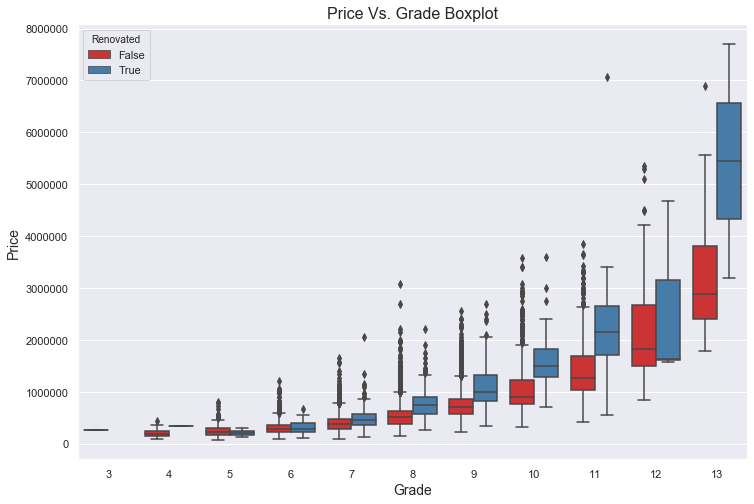

In [147]:
plt.figure(figsize = (12,8))
sns.set_style('darkgrid')
sns.boxplot(x = 'grade', y = 'price', data = df3, hue = 'Renovated', palette = "Set1")
plt.title('Price Vs. Grade Boxplot',fontsize = 16)
plt.ylabel('Price',fontsize = 14)
plt.xlabel('Grade',fontsize = 14)
plt.savefig('grade_boxplot.jpg', bbox_inches = 'tight')
plt.show()
sns.set_style('white')

This boxplot indicates that as grade increases so does price. It also shows that when houses in each grade are compared to each other on the basis of if they were renovated or not, the properties that are renovated have a higher mean in price. These two features are how I defined quality and thus from the model results and this boxplot I can conclude that the quality of a house with respect to this model impacts house prices the most. Now, a category plot and boxplot for view will be used to evaluate its impact on house prices. 

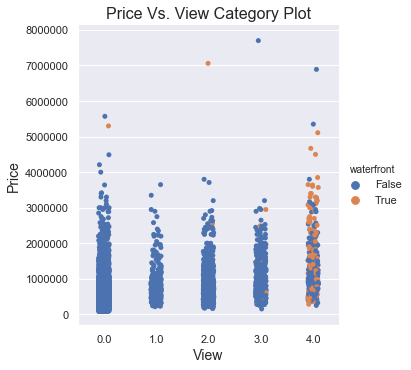

In [148]:
sns.set_style('darkgrid')
sns.catplot(x = "view", y = "price", hue = "waterfront", data = df3)
plt.title('Price Vs. View Category Plot',fontsize = 16)
plt.ylabel('Price',fontsize = 14)
plt.xlabel('View',fontsize = 14)
plt.savefig('view_catplot.jpg', bbox_inches = 'tight')
plt.show()
sns.set_style('white')

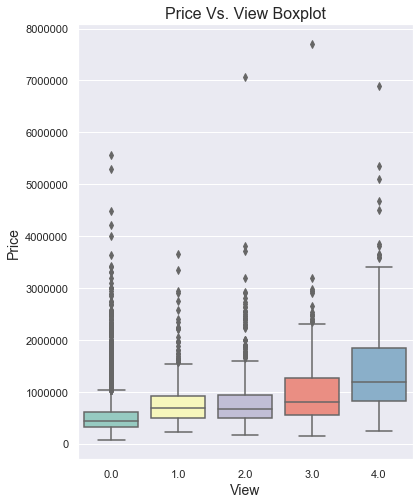

In [149]:
plt.figure(figsize = (6,8))
sns.set_style('darkgrid')
sns.boxplot(x = 'view', y = 'price', data = df3, palette = "Set3")
plt.title('Price Vs. View Boxplot',fontsize = 16)
plt.ylabel('Price',fontsize = 14)
plt.xlabel('View',fontsize = 14)
plt.savefig('view_boxplot.jpg', bbox_inches = 'tight')
plt.show()
sns.set_style('white')

The boxplot helps indicate that a better view leads to a higher mean price. In addition, having a waterfront property leads to having a better view as the category plot shows that most of the waterfront properties have the highest view rating. 

# Final Model Conclusion

The final model performs well as I was able to account for 72.5% of the variance (R-Squared value of 0.725) while still working to satisfy the linearity assumptions as my Q-Q plot follows a linear pattern, my residuals pass the Homoscedasticity test, and there is a clear linear pattern between the predictors and the target variable. One thing I'd like to spend more time on is quantifying quality by combining the grade rankings with whether the property was renovated or not into one single variable. I'd also apply this same concept to how the view is rating as waterfront properties seemed to only be in the view ranking value of 4. I believe giving a score for view and quality would eliminate the need to categorize these variables, thus making the results more interpretable when compared to the fact that the variables in question had to be categorized. Initially my plan was to not categorize grade but the multicollinearity matrix led to my decision to categorize and bin this variable.

In addition, I believe more focus is required in quantifying location as I wanted to introduce two other variables that would quantify the distance of each property from Seattle and Bellevue. The introduction of these variables causes multicollinearity issues and were therefore not included in the final model. A way to combine these 3 predictors would be to develop a location score that incorporates these 3 variables. This would require more research to find out what is the best way to assess a location score. Overall, this project helped to accelerate my programming skills while also applying concepts. It also helped to give me an idea of how to approach future projects as my organization of code was poor at the beginning. I look forward to doing more projects and seeing how I can use these skills in the real world when I'm done.